#Capstone Project - Industrial safety. NLP based Chatbot

##Problem statement
There is a need for industries/Companies around the globe to undestand why employees still suffer from injuries/accidents in plants. Sometimes they also die in such enviroment. Based on the given description of the incident, it is required to identify the severity of the incident and highlight the saftety risk associated with the incident description.


##Context

The database comes from one of the biggest industry in Brazil and in the world. It is an urgent need for industries/companies around the
globe to understand why employees still suffer some injuries/accidents in plants. Sometimes they also die in such environment

##Project objective

Design a ML/DL based chatbot utility which can help the professionals to highlight the safety risk as per the incident description.

##Data description

This The database is basically records of accidents from 12 different plants in 03 different countries which every line in the data is an
occurrence of an accident.

###Columns description:

- **Data**: timestamp or time/date information
- **Countries**: which country the accident occurred (anonymised)
- **Local**: the city where the manufacturing plant is located (anonymised)
- **Industry sector**: which sector the plant belongs to
- **Accident level**: from I to VI, it registers how severe was the accident (I means not severe but VI means very severe)
- **Potential Accident Level**: Depending on the Accident Level, the database also registers how severe the accident could have been (due to other factors
involved in the accident)
- **Genre**: if the person is male of female
- **Employee or Third Party**: if the injured person is an employee or a third party
- **Critical Risk**: some description of the risk involved in the accident
- **Description**: Detailed description of how the accident happened.

Link to download the dataset: https://www.kaggle.com/ihmstefanini/industrial-safety-and-health-analytics-database

##Import libraries

In [1]:
# !pip uninstall -y tensorflow
# !pip install tensorflow==2.15.0
# import os
# os._exit(00)
# !pip install openpyxl

In [2]:
# installing the sentence-transformers and gensim libraries for word embeddings
# Force reinstall compatible versions
# !pip install -U python==3.11.7
# !pip install -U "numpy>=1.26.0" "scikit-learn==1.3.2" "transformers==4.38.2" "sentence-transformers==2.2.2" "gensim==4.3.3" "xgboost==3.0.0"
# # !pip install huggingface_hub==0.21.0
# import numpy as np
# np.__version__
# !pip install -U sentence-transformers gensim transformers tqdm -q

In [3]:
# !pip install --force-reinstall scikit-learn==1.3.0
# !pip install -U scikit-learn imbalanced-learn

In [4]:
# =============================
# Install Required Libraries
# =============================

# Uncomment the lines below if using Google Colab or local Jupyter environment
# !pip install -U sentence-transformers gensim transformers tqdm xgboost pandas numpy matplotlib seaborn imbalanced-learn tensorflow keras -q
# !pip install click --upgrade

# =============================
# Import Standard Libraries
# =============================

import time
import json
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# =============================
# Data Manipulation & Analysis
# =============================

import pandas as pd
import numpy as np

# =============================
# Data Visualization
# =============================

import matplotlib.pyplot as plt
import seaborn as sns

# =============================
# Sklearn - ML & Evaluation
# =============================

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
)

# =============================
# XGBoost
# =============================

from xgboost import XGBClassifier

# =============================
# Imbalanced Data Handling
# =============================

from imblearn.over_sampling import SMOTE

# =============================
# Word Embeddings - Gensim & Glove
# =============================

from gensim.models import Word2Vec, KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

# =============================
# Transformers & Sentence Embeddings
# =============================

import torch
from transformers import BertTokenizerFast, BertTokenizer, TFBertModel
from sentence_transformers import SentenceTransformer

# =============================
# TensorFlow / Keras for Deep Learning
# =============================

import tensorflow as tf
from tensorflow.keras import Input, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Concatenate, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import UnitNorm
from tensorflow.keras.callbacks import EarlyStopping

# =============================
# Progress Bar
# =============================

from tqdm import tqdm
tqdm.pandas()

# =============================
# Check Sklearn Version
# =============================

import sklearn
print(sklearn.__version__)


2025-06-22 09:07:11.173626: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750583231.363743      91 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750583231.419769      91 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


1.6.1


## Load dataset from Google drive

In [5]:
# from google.colab import drive
# drive.mount('/content/drive/')

input_file_path = '/kaggle/input/accident-chatbot/Data Set - industrial_safety_and_health_database_with_accidents_description.xlsx'
# input_file_path = '/content/drive/MyDrive/PGP: AIML University Of Texas/Capstone Project - ChatBot/Data Set - industrial_safety_and_health_database_with_accidents_description.xlsx'
df = pd.read_excel(input_file_path)
data = df.copy()

##Load top 5 rows

In [6]:
data.head()

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


In [7]:
data.tail()

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
420,434,2017-07-04,Country_01,Local_04,Mining,I,III,Male,Third Party,Others,"Being approximately 5:00 a.m. approximately, w..."
421,435,2017-07-04,Country_01,Local_03,Mining,I,II,Female,Employee,Others,The collaborator moved from the infrastructure...
422,436,2017-07-05,Country_02,Local_09,Metals,I,II,Male,Employee,Venomous Animals,During the environmental monitoring activity i...
423,437,2017-07-06,Country_02,Local_05,Metals,I,II,Male,Employee,Cut,The Employee performed the activity of strippi...
424,438,2017-07-09,Country_01,Local_04,Mining,I,II,Female,Third Party,Fall prevention (same level),"At 10:00 a.m., when the assistant cleaned the ..."


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Unnamed: 0                425 non-null    int64         
 1   Data                      425 non-null    datetime64[ns]
 2   Countries                 425 non-null    object        
 3   Local                     425 non-null    object        
 4   Industry Sector           425 non-null    object        
 5   Accident Level            425 non-null    object        
 6   Potential Accident Level  425 non-null    object        
 7   Genre                     425 non-null    object        
 8   Employee or Third Party   425 non-null    object        
 9   Critical Risk             425 non-null    object        
 10  Description               425 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 36.7+ KB


In [9]:
data.describe()

,Unnamed: 0,Data
count,425.000000,425
mean,224.084706,2016-09-20 16:46:18.352941312
min,0.000000,2016-01-01 00:00:00
25%,118.000000,2016-05-01 00:00:00
50%,226.000000,2016-09-13 00:00:00
75%,332.000000,2017-02-08 00:00:00
max,438.000000,2017-07-09 00:00:00
std,125.526786,NaN


In [10]:
data.shape

(425, 11)

Observations
- There are 11 columnns
- Exception column name 'Unnamed: 0' and Data rest all are object type
- Data set has 425 rows and 11 columns

##Data cleansing

#### Drop column name 'Unnamed: 0', it doesn't have required informtioan

In [11]:
data = data.drop('Unnamed: 0', axis=1)

Some column names seem have typos, hence rename them to make business sense

In [12]:
data.rename(columns={'Data' : 'Date', 'Countries':'Country','Genre':'Gender','Employee or Third Party':'Employee Type'},inplace= True)

Check for null values

In [13]:
data.isnull().sum()

Date                        0
Country                     0
Local                       0
Industry Sector             0
Accident Level              0
Potential Accident Level    0
Gender                      0
Employee Type               0
Critical Risk               0
Description                 0
dtype: int64

Check for duplicate

In [14]:
data.duplicated().sum()

7

Drop duplicate

In [15]:
data.drop_duplicates(inplace=True)

In [16]:
data.shape

(418, 10)

Summary:
- Removed UnnamedL 0 column from the dataset
-  Renamed following columns to give meaningfull names
 - data to Date
 - Countries to Country
 - Genre to Gender
 - Employee or Third Party to Employee type
- There were 7 duplicate entries , removed them from dataset
- No mising values in the dataset
- After Data Cleansing, we have now 418 rows and 10 columns

## Exploratory Data Analysis (EDA)

###Univariate analysis

Print all object type columns values distribution (except Description)

In [17]:
string_df = data.select_dtypes(include='object')
for column in string_df:
  if(column != 'Description'):
    print('\n==============================')
    print(column)
    print('\n==============================')
    print(string_df[column].value_counts())


Country

Country
Country_01    248
Country_02    129
Country_03     41
Name: count, dtype: int64

Local

Local
Local_03    89
Local_05    59
Local_01    56
Local_04    55
Local_06    46
Local_10    41
Local_08    27
Local_02    23
Local_07    14
Local_12     4
Local_09     2
Local_11     2
Name: count, dtype: int64

Industry Sector

Industry Sector
Mining    237
Metals    134
Others     47
Name: count, dtype: int64

Accident Level

Accident Level
I      309
II      40
III     31
IV      30
V        8
Name: count, dtype: int64

Potential Accident Level

Potential Accident Level
IV     141
III    106
II      95
I       45
V       30
VI       1
Name: count, dtype: int64

Gender

Gender
Male      396
Female     22
Name: count, dtype: int64

Employee Type

Employee Type
Third Party             185
Employee                178
Third Party (Remote)     55
Name: count, dtype: int64

Critical Risk

Critical Risk
Others                                       229
Pressed                           

Plot values distribution of all object type colums

<Figure size 1500x800 with 0 Axes>

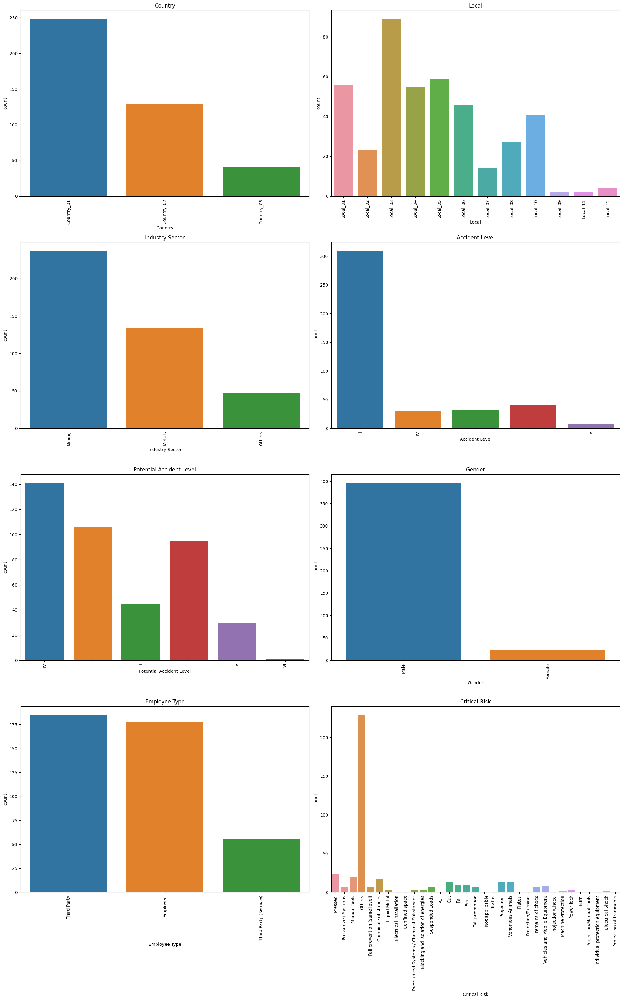

In [18]:
import math

# Calculate the number of columns to plot (excluding 'Description')
plt.figure(figsize=(15,8))

plot_columns = [col for col in string_df.columns if col != 'Description']
num_plots = len(plot_columns)

# Determine the number of rows and columns for the subplot grid
# Let's aim for 2 columns per row for count plots
n_cols = 2
n_rows = math.ceil(num_plots / n_cols)

# Create the figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 8 * n_rows))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Iterate through the columns and create count plots
for i, column in enumerate(plot_columns):
  sns.countplot(data = data, x = column, ax=axes[i]) # Specify the axis for the plot
  axes[i].set_title(column) # Set a title for each subplot for clarity
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)

# Remove any unused subplots if the total number of plots is odd
for j in range(num_plots, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()

In [19]:
data['Day'] = data['Date'].apply(lambda x:x.day)
data['Month'] = data['Date'].apply(lambda x:x.month)
data['Year'] = data['Date'].apply(lambda x:x.year)
data['Day_name'] = data['Date'].apply(lambda x:x.day_name())

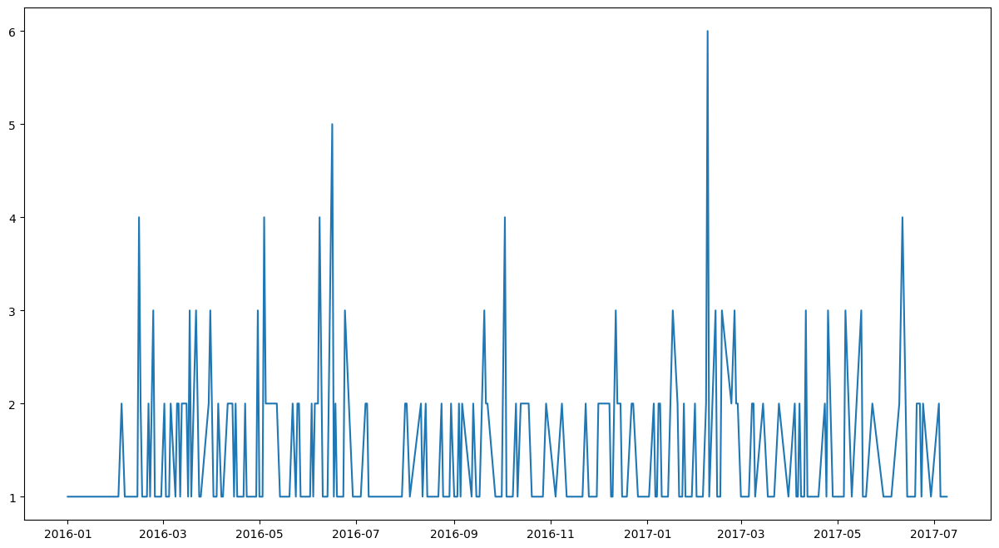

In [20]:
plt.figure(figsize=(15,8))
plt.plot(data['Date'].value_counts().sort_index())

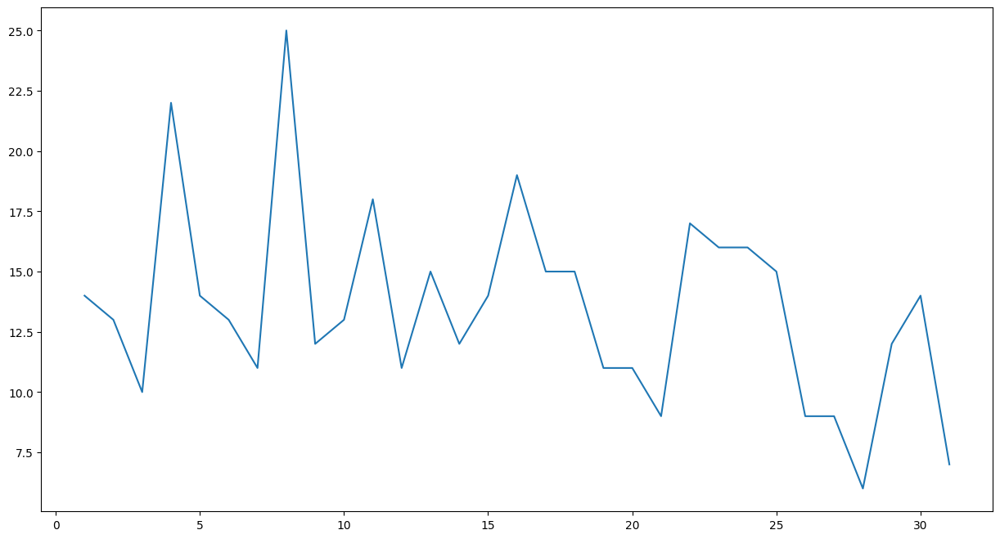

In [21]:
plt.figure(figsize=(15,8))
plt.plot(data['Day'].value_counts().sort_index())

<Axes: xlabel='Month', ylabel='count'>

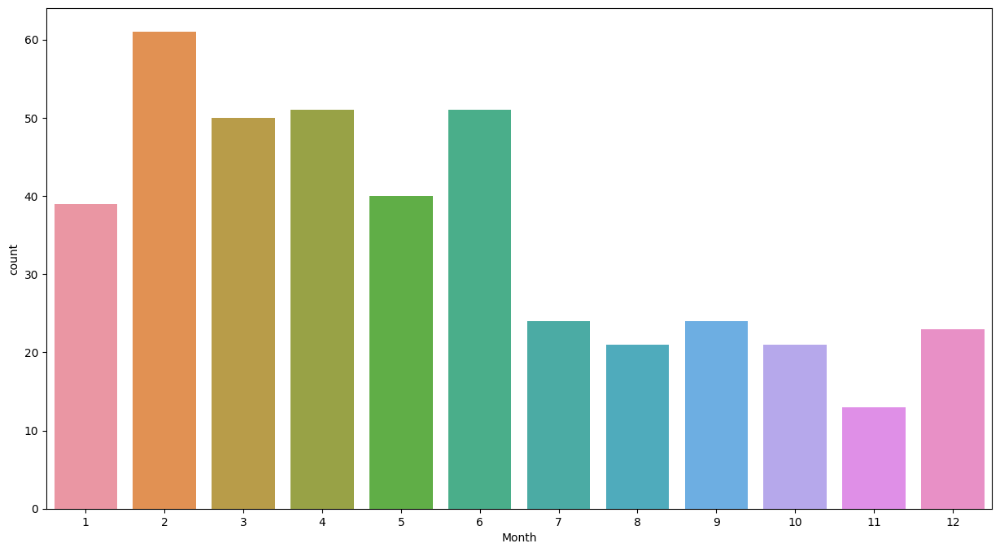

In [22]:
plt.figure(figsize=(15,8))
sns.countplot(data = data, x = 'Month')

<Axes: xlabel='Year', ylabel='count'>

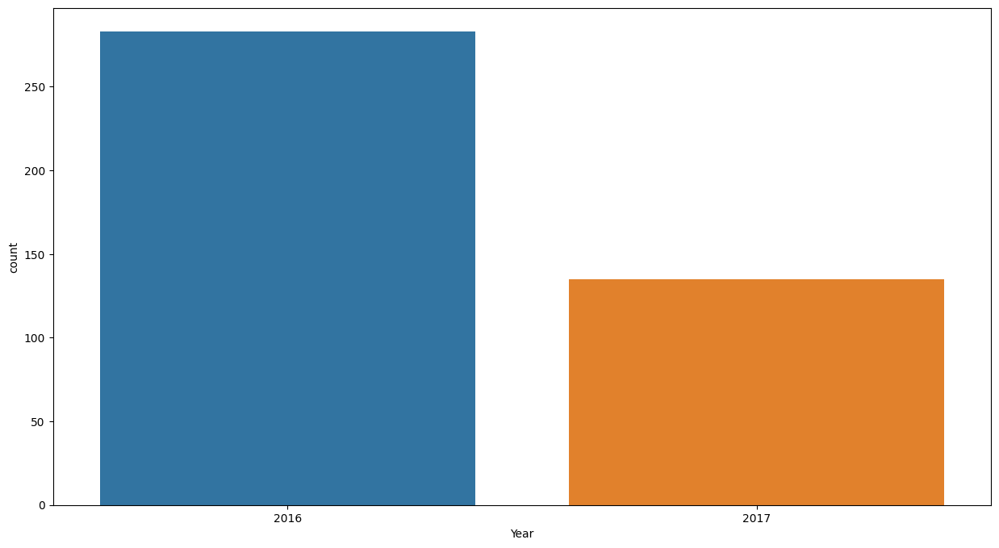

In [23]:
plt.figure(figsize=(15,8))
sns.countplot(data = data, x = 'Year')

Observations
- There are 3 country types country_001, country_002, country_003 and highest number of incidents reported in country_001 and lowest incidents are reported in country_003
- There are 12 local cities where manufacturing plants are located local_01 to local_12 and highest number of accidents are reported in local_03 and lowest number of accidents are reported in local_09 and local_11
- There are only 3 Inustry Sectors and highest number of accidents are reported from Mining industry sector and lowest number of accidents are reported from others
- There are only 5 Accident Levels , ranging from lowest severity I to highest severity V and highest number of accidents recorded are of severity Low I and lowest number of accidents recorded are of severity high V.
- There are only 6 Potential Accident Levels , ranging from lowest severity I to highest severity VI and highest number Potential accidents are reported with severity low I and Lowest number of Potential accidents are reported with severity high VI .
- There are 2 Genders male and female and highest number of accidents are recorded for male Gender and lowest of accidents are recorded for female gender
- There are 3 employee types Third Party, Employee and Third Party ( Remote) and highest of accidents are recorded for Third Party and lowest number of accidents are recorded for Third Party (Remote) .
- There are quite a lot of Critical Risks reported and highest number of accidents are recored of type others Critical Risk .
- Accidents were higher in Feb 2017. Observed higher in first 10-15 days in month
- 2016 had more accidents as compared to 2017

###Bivariate analysis

In [24]:
def bivariate_countplot(data_df, x_col, hue_col,estimator='count', order=None):
  count = data_df[x_col].nunique()
  sorter = data_df[hue_col].value_counts().index[-1]
  plt.figure(figsize=(20,8))
  ax = sns.countplot(data=data_df, x=x_col, hue=hue_col, order=order)
  for i in ax.containers:
    ax.bar_label(i,)
  plt.xlabel(x_col)
  plt.ylabel('Count')
  plt.show()

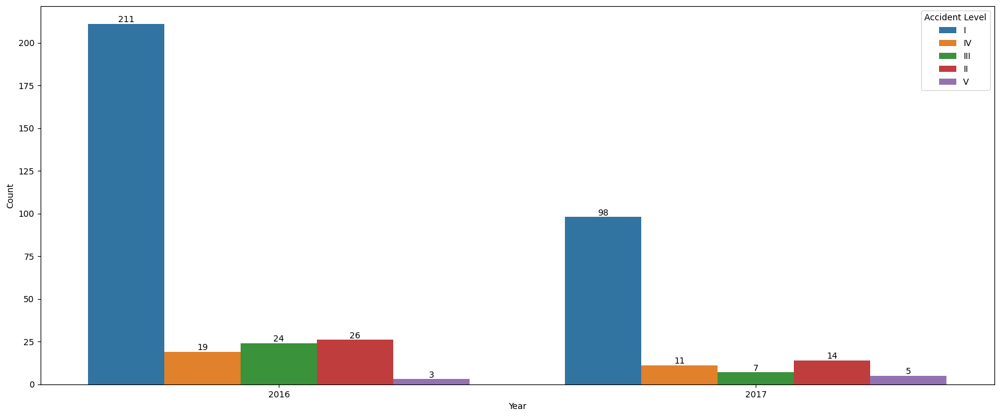

In [25]:
bivariate_countplot(data_df=data, x_col='Year', hue_col='Accident Level')

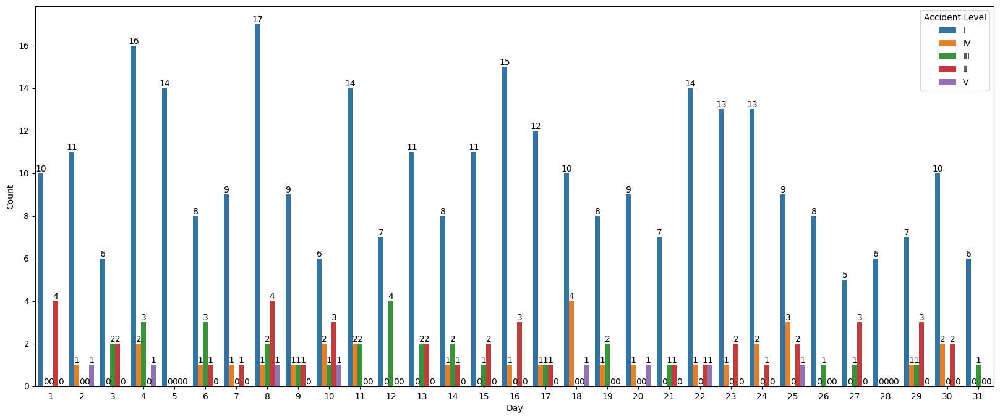

In [26]:
bivariate_countplot(data_df=data, x_col='Day', hue_col='Accident Level')

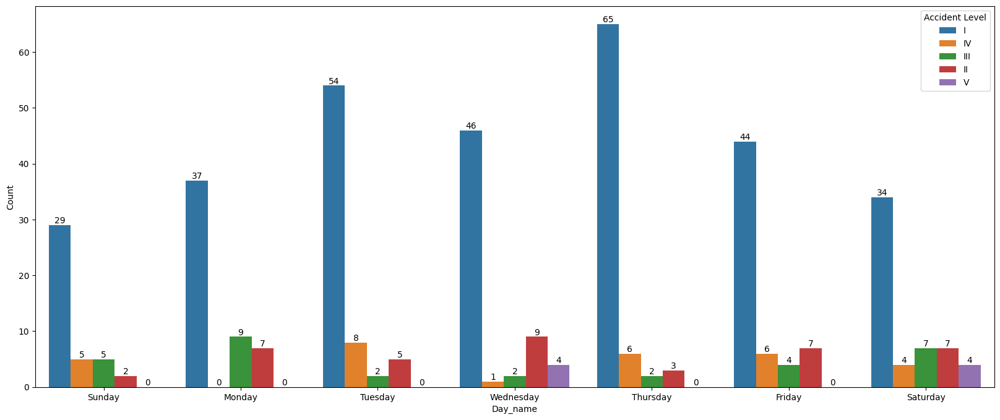

In [27]:
bivariate_countplot(data_df=data, x_col='Day_name', hue_col='Accident Level', order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday', 'Saturday'])

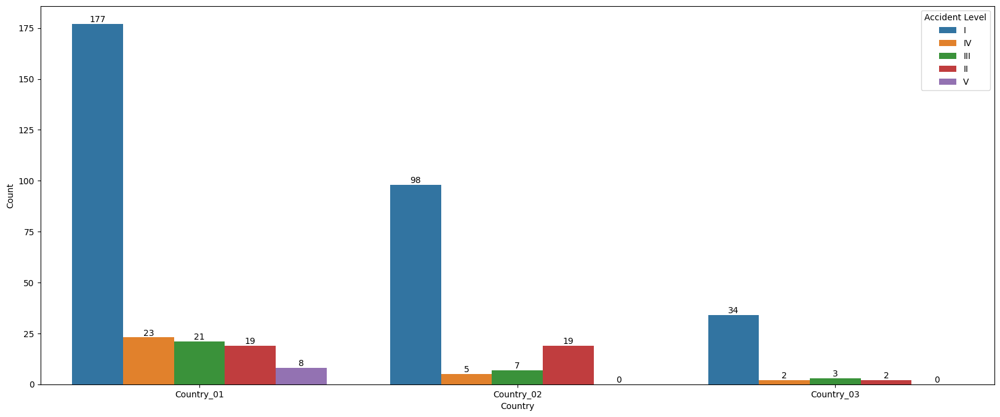

In [28]:
bivariate_countplot(data_df=data, x_col='Country', hue_col='Accident Level')

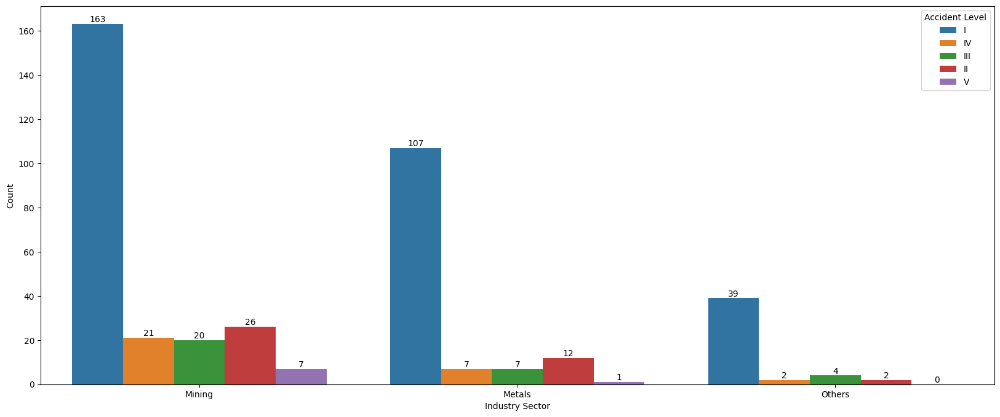

In [29]:
bivariate_countplot(data_df=data, x_col='Industry Sector', hue_col='Accident Level')

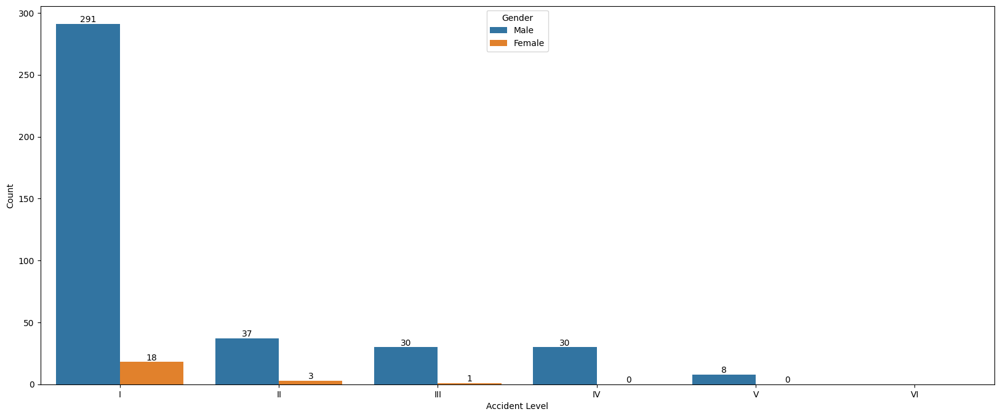

In [30]:
bivariate_countplot(data_df=data, x_col='Accident Level', hue_col='Gender', order=['I','II','III','IV','V','VI'])

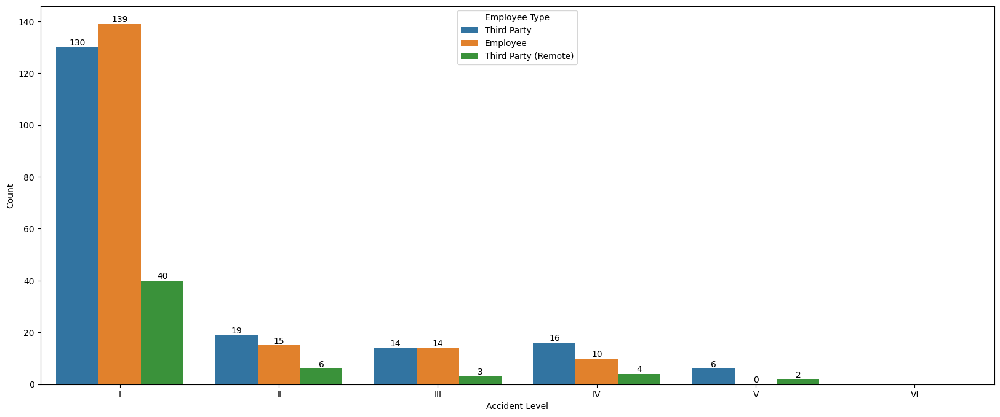

In [31]:
bivariate_countplot(data_df=data, x_col='Accident Level', hue_col='Employee Type', order=['I','II','III','IV','V','VI'])

Observations

- There are 3 country types country_001, country_002, country_003 and highest number of incidents reported in country_001 and lowest incidents are reported in country_003
- There are 12 local cities where manufacturing plants are located local_01 to local_12 and highest number of accidents are reported in local_03 and lowest number of accidents are reported in local_09 and local_11
- There are only 3 Inustry Sectors and highest number of accidents are reported from Mining industry sector and lowest number of accidents are reported from others
- There are only 5 Accident Levels , ranging from lowest severity I to highest severity V and highest number of accidents recorded are of severity Low I and lowest number of accidents recorded are of severity high V.
- There are only 6 Potential Accident Levels , ranging from lowest severity I to highest severity VI and highest number Potential accidents are reported with severity low I and Lowest number of Potential accidents are reported with severity high VI .
- There are 2 Genders male and female and highest number of accidents are recorded for male Gender and lowest of accidents are recorded for female gender
- There are 3 employee types Third Party, Employee and Third Party ( Remote) and highest number of accidents are recorded for Third Party and lowest number of accidents are recorded for Third Party (Remote) .
- Most of the Critical Risks are classified as others
- Highest number of accidents are reported in the year 2016 and lowest in the year 2017


##Data Pre-processing

In [32]:
X = df['Description']
y = df['Accident Level']

In [33]:
# to use regular expressions for manipulating text data
import re

# to load the natural language toolkit
import nltk
nltk.download('stopwords')    # loading the stopwords
nltk.download('wordnet')    # loading the wordnet module that is used in stemming

# to remove common stop words
from nltk.corpus import stopwords

# to perform stemming
from nltk.stem.porter import PorterStemmer

# to create Bag of Words
from sklearn.feature_extraction.text import CountVectorizer

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [34]:
# defining a function to remove special characters
def remove_special_characters(text):
    # Defining the regex pattern to match non-alphanumeric characters
    pattern = '[^A-Za-z0-9]+'

    # Finding the specified pattern and replacing non-alphanumeric characters with a blank string
    new_text = ''.join(re.sub(pattern, ' ', text))

    return new_text

In [35]:
X_cleaned = X.apply(remove_special_characters)


In [36]:
X_cleaned[:3]

0    While removing the drill rod of the Jumbo 08 f...
1    During the activation of a sodium sulphide pum...
2    In the sub station MILPO located at level 170 ...
Name: Description, dtype: object

In [37]:
# changing the case of the text data to lower case
X_cleaned = X_cleaned.str.lower()

In [38]:
X_cleaned[:3]

0    while removing the drill rod of the jumbo 08 f...
1    during the activation of a sodium sulphide pum...
2    in the sub station milpo located at level 170 ...
Name: Description, dtype: object

In [39]:
# removing extra whitespaces from the text
X_cleaned = X_cleaned.str.strip()

In [40]:
# checking a couple of instances of cleaned data
X_cleaned[0:3]

0    while removing the drill rod of the jumbo 08 f...
1    during the activation of a sodium sulphide pum...
2    in the sub station milpo located at level 170 ...
Name: Description, dtype: object

In [41]:
# defining a function to remove stop words using the NLTK library
def remove_stopwords(text):
    # Split text into separate words
    words = text.split()

    # Removing English language stopwords
    new_text = ' '.join([word for word in words if word not in stopwords.words('english')])

    return new_text

In [42]:
X_cleaned = X_cleaned.apply(remove_stopwords)

In [43]:
# checking a couple of instances of cleaned data
X_cleaned[0:3]

0    removing drill rod jumbo 08 maintenance superv...
1    activation sodium sulphide pump piping uncoupl...
2    sub station milpo located level 170 collaborat...
Name: Description, dtype: object

In [44]:
# Loading the Porter Stemmer
ps = PorterStemmer()

In [45]:
# defining a function to perform stemming
def apply_porter_stemmer(text):
    # Split text into separate words
    words = text.split()

    # Applying the Porter Stemmer on every word of a message and joining the stemmed words back into a single string
    new_text = ' '.join([ps.stem(word) for word in words])

    return new_text

In [46]:
X_cleaned = X_cleaned.apply(apply_porter_stemmer)

In [47]:
# checking a couple of instances of cleaned data
df['Cleaned_description'] = X_cleaned

X_cleaned[0:3]

0    remov drill rod jumbo 08 mainten supervisor pr...
1    activ sodium sulphid pump pipe uncoupl sulfid ...
2    sub station milpo locat level 170 collabor exc...
Name: Description, dtype: object

In [48]:
df.to_csv('/kaggle/working/CleanProcessedData.csv')

## Data Preparation

Word2Vector Embedding

In [49]:
# creating a list of all words in our data
words_list = [item.split(" ") for item in X_cleaned.values]

In [50]:
# Checking the words from the first five reviews
words_list[0:5]

[['remov',
  'drill',
  'rod',
  'jumbo',
  '08',
  'mainten',
  'supervisor',
  'proce',
  'loosen',
  'support',
  'intermedi',
  'central',
  'facilit',
  'remov',
  'see',
  'mechan',
  'support',
  'one',
  'end',
  'drill',
  'equip',
  'pull',
  'hand',
  'bar',
  'acceler',
  'remov',
  'moment',
  'bar',
  'slide',
  'point',
  'support',
  'tighten',
  'finger',
  'mechan',
  'drill',
  'bar',
  'beam',
  'jumbo'],
 ['activ',
  'sodium',
  'sulphid',
  'pump',
  'pipe',
  'uncoupl',
  'sulfid',
  'solut',
  'design',
  'area',
  'reach',
  'maid',
  'immedi',
  'made',
  'use',
  'emerg',
  'shower',
  'direct',
  'ambulatori',
  'doctor',
  'later',
  'hospit',
  'note',
  'sulphid',
  'solut',
  '48',
  'gram',
  'liter'],
 ['sub',
  'station',
  'milpo',
  'locat',
  'level',
  '170',
  'collabor',
  'excav',
  'work',
  'pick',
  'hand',
  'tool',
  'hit',
  'rock',
  'flat',
  'part',
  'beak',
  'bounc',
  'hit',
  'steel',
  'tip',
  'safeti',
  'shoe',
  'metatars',
 

In [51]:
from gensim.models import Word2Vec

In [52]:
# creating an instance of Word2Vec
model_W2V = Word2Vec(words_list, min_count = 1, workers = 6)

In [53]:
# Dictionary with key as words and the value as the embedding vector.
words = model_W2V.wv.key_to_index

In [54]:
def average_vectorizer_Word2Vec(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(words[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

In [55]:
# creating a dataframe of the vectorized documents
vec_size = 100
df_word2vec = pd.DataFrame(X_cleaned.apply(average_vectorizer_Word2Vec).tolist(), columns=['Feature '+str(i) for i in range(vec_size)])
df_word2vec

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,...,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579,290.131579
1,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,...,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429,784.821429
2,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,...,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000,504.700000
3,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,...,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000,630.200000
4,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,...,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923,635.576923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,...,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000,259.100000
421,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,...,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000
422,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,...,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524,424.809524
423,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,...,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000,137.750000


### Word Vectorization using GloVe

In [56]:
from gensim.models import KeyedVectors
# load the Stanford GloVe model

filename = '/kaggle/input/accident-chatbot/glove.6B.100d.txt.word2vec'
# filename = '/content/drive/MyDrive/PGP: AIML University Of Texas/Capstone Project - ChatBot/glove.6B.100d.txt.word2vec'
model = KeyedVectors.load_word2vec_format(filename, binary=False)

In [57]:
# Checking the size of the vocabulary
print("Length of the vocabulary is", len(model.index_to_key))

Length of the vocabulary is 400000


In [58]:
#List of words in the vocabulary
words = model.index_to_key

In [59]:
#Dictionary with key as the word and the value as the corresponding embedding vector.
word_vector_dict = dict(zip(model.index_to_key,list(model.vectors)))

In [60]:
#Defining the dimension of the embedded vector.
vec_size=100

In [61]:
def average_vectorizer_GloVe(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(word_vector_dict[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

In [62]:
# creating a dataframe of the vectorized documents
df_glove = pd.DataFrame(X_cleaned.apply(average_vectorizer_GloVe).tolist(), columns=['Feature '+str(i) for i in range(vec_size)])
df_glove

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,-0.145816,0.148168,0.015640,-0.216440,-0.144937,-0.132402,-0.208501,0.220757,-0.118255,0.128817,...,-0.161326,0.264408,-0.193733,0.029022,-0.057574,-0.073884,-0.042932,-0.175217,0.434862,0.104182
1,-0.171439,0.212236,-0.069287,-0.048557,0.114579,0.041752,0.178636,0.299398,-0.072783,0.226177,...,0.075978,0.002641,-0.130382,-0.131481,-0.232991,-0.084954,-0.012511,-0.368468,0.381449,-0.166563
2,-0.132015,0.153620,0.075415,-0.140076,0.028712,-0.146477,0.008585,0.126988,-0.090984,0.209589,...,-0.041690,0.002062,-0.105144,-0.003989,-0.336047,0.091139,-0.159009,-0.154847,0.599111,-0.114505
3,-0.121610,-0.008220,-0.017752,-0.133620,0.123278,-0.074241,-0.096347,0.070301,-0.137226,-0.116082,...,-0.073001,0.140044,0.036914,-0.011328,-0.125656,-0.072550,0.004253,-0.082516,0.494954,-0.050261
4,-0.080374,0.099033,-0.059866,-0.161126,-0.044841,-0.000553,0.044306,0.209735,-0.305067,0.107770,...,-0.094132,0.144031,-0.035384,0.010960,-0.256674,0.042752,-0.075413,-0.177928,0.455544,-0.268938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,-0.161232,0.016241,0.095968,-0.058573,-0.035591,0.107621,-0.032418,0.063784,-0.106545,0.172475,...,-0.128438,0.147460,-0.035120,-0.007151,-0.045704,-0.212311,0.052636,-0.128326,0.300582,-0.141453
421,0.104132,0.005305,-0.132999,-0.326247,-0.153887,-0.071918,-0.063060,0.088049,0.163999,0.156584,...,-0.095769,0.023777,0.107166,-0.038958,-0.084148,-0.100148,0.045281,-0.104752,0.333268,-0.064730
422,-0.294138,0.112221,0.273076,-0.293037,-0.116861,0.408476,-0.105445,0.213770,-0.044614,-0.037250,...,-0.008060,-0.078036,0.009100,-0.070368,-0.083334,0.094350,-0.079959,-0.017720,0.544011,-0.035263
423,-0.439452,-0.040204,-0.009927,-0.142967,0.036576,0.175996,-0.121329,0.120330,-0.118968,0.156633,...,-0.175355,0.023384,0.004604,-0.067799,-0.309980,0.039969,0.097663,-0.004321,0.468566,-0.033425


### Word Embedding using Sentence Transformer

In [63]:
from sentence_transformers import SentenceTransformer

In [64]:
#Defining the model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

In [65]:
import torch

In [66]:
# setting the device to GPU if available, else CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [67]:
# encoding the dataset
embedding_matrix = model.encode(X_cleaned, show_progress_bar=True, device=device)

Batches:   0%|          | 0/14 [00:00<?, ?it/s]

In [68]:
embedding_matrix[:3]

array([[-0.0557527 , -0.01990261,  0.00502439, ...,  0.05596663,
        -0.03824599, -0.08692336],
       [-0.04779951,  0.04120413,  0.02243488, ...,  0.06410368,
        -0.06263994,  0.03099807],
       [-0.08357166, -0.00814365, -0.02510239, ..., -0.00844744,
        -0.0764154 ,  0.01918899]], dtype=float32)

### Vectorization using TF-IDF Vectorize

In [69]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [70]:
#Vectorization using tfidf
vec = TfidfVectorizer(max_features = 300)
x_vec = vec.fit_transform(X_cleaned).toarray()

In [71]:
x_vec[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.53728334, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [72]:
x_vec[100]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.57104148, 0.        , 0.        , 0.        ,
       0.        , 0.37888434, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

## Design train and test basic machine learning classifiers

### Required Lib Imports

In [73]:
# !pip install scikit-learn==1.3.2 imbalanced-learn==0.11.0

### Defining reusable functions

In [74]:
# Function to evaluate model performance metrics
def evaluate_model_performance(classifier, X_train, y_train, X_test, y_test):
    train_pred = classifier.predict(X_train)
    test_pred = classifier.predict(X_test)

    accuracy_train = round(classifier.score(X_train, y_train) * 100, 2)
    accuracy_test = round(classifier.score(X_test, y_test) * 100, 2)

    recall_train = round(recall_score(y_train, train_pred, average='weighted') * 100, 2)
    recall_test = round(recall_score(y_test, test_pred, average='weighted') * 100, 2)

    precision_train = round(precision_score(y_train, train_pred, average='weighted') * 100, 2)
    precision_test = round(precision_score(y_test, test_pred, average='weighted') * 100, 2)

    f1_train = round(f1_score(y_train, train_pred, average='weighted') * 100, 2)
    f1_test = round(f1_score(y_test, test_pred, average='weighted') * 100, 2)

    return [accuracy_train, accuracy_test,
            recall_train, recall_test,
            precision_train, precision_test,
            f1_train, f1_test]

# Function to perform hyperparameter tuning and evaluate the best model
def tune_and_evaluate_model(model_name, model, param_grid, X_train, y_train, X_test, y_test):
    print(f"Starting hyperparameter tuning for: {model_name}")

    if not param_grid:
        print(f"No hyperparameters specified for {model_name}. Skipping tuning.")
        model.fit(X_train, y_train)
        return model

    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=kfold,
                               scoring='f1_weighted', n_jobs=-1, verbose=1)

    grid_search.fit(X_train, y_train)
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    print(f"Best CV F1 Score: {grid_search.best_score_:.4f}")

    best_model = grid_search.best_estimator_

    # Final evaluation on train/test sets
    print(f"Train Accuracy: {best_model.score(X_train, y_train):.4f}")
    print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

    print(f"Test Classification Report:\n{classification_report(y_test, best_model.predict(X_test))}")
    print("="*80)

    return best_model

# Function to train and evaluate multiple classification models
def evaluate_models(model_dict, X_train, y_train, X_test, y_test):

    for model_label, clf in model_dict.items():
        print(f"\nEvaluating Model: {model_label}")

        # Fit the model on training data
        clf.fit(X_train, y_train)

        # Predictions
        train_predictions = clf.predict(X_train)
        test_predictions = clf.predict(X_test)

        # Accuracy scores
        print('\nAccuracy on Training Set:', clf.score(X_train, y_train))
        print('Accuracy on Test Set:', clf.score(X_test, y_test))

        # Confusion Matrix - Training
        print('\nTraining Set Confusion Matrix:\n')
        cm_train = confusion_matrix(y_train, train_predictions)
        sns.heatmap(cm_train, annot=True, fmt='.2f',
                    xticklabels=["I", "II", "III", "IV", "V"],
                    yticklabels=["I", "II", "III", "IV", "V"])
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.show()

        # Confusion Matrix - Testing
        print('\nTesting Set Confusion Matrix:\n')
        cm_test = confusion_matrix(y_test, test_predictions)
        sns.heatmap(cm_test, annot=True, fmt='.2f',
                    xticklabels=["I", "II", "III", "IV", "V"],
                    yticklabels=["I", "II", "III", "IV", "V"])
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.show()

        print('=' * 72)

        # Classification Report - Training
        print('\nTraining Set Classification Report:\n')
        print(classification_report(y_train, train_predictions))

        # Classification Report - Testing
        print('\nTesting Set Classification Report:\n')
        print(classification_report(y_test, test_predictions))
        print('=' * 72)


### Using TF-IDF Vectorize

#### Without Sampling

In [78]:
#Splitting data into train and test
from sklearn.model_selection import train_test_split
# y = pd.get_dummies(y).values
x_train, x_test, y_train, y_test = train_test_split(x_vec,y,train_size=0.8,random_state=1)

##### Before Tuning

In [79]:
# Your existing model collection with default parameters
tfidf_model_collection = {
    'Naive Bayes - No Sampling': MultinomialNB(),
    'K-Nearest Neighbors - No Sampling': KNeighborsClassifier(),
    'Logistic Regression - No Sampling': LogisticRegression(max_iter=500),
    'Support Vector Machine - No Sampling': SVC(),
    'Decision Tree - No Sampling': DecisionTreeClassifier(),
    'Random Forest - No Sampling': RandomForestClassifier(),
    'AdaBoost - No Sampling': AdaBoostClassifier(),
    'Gradient Boosting - No Sampling': GradientBoostingClassifier()
}
# Evaluate default models before tuning
print("Evaluating default models (before tuning):")
tfidf_default_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

Evaluating default models (before tuning):


In [80]:
for name, model in tfidf_model_collection.items():
    print(f"Training and evaluating {name} with default parameters.")
    model.fit(x_train, y_train)
    metrics = evaluate_model_performance(model, x_train, y_train, x_test, y_test)
    tfidf_default_results['Model'].append(name)
    tfidf_default_results['Train_Accuracy'].append(metrics[0])
    tfidf_default_results['Test_Accuracy'].append(metrics[1])
    tfidf_default_results['Train_Recall'].append(metrics[2])
    tfidf_default_results['Test_Recall'].append(metrics[3])
    tfidf_default_results['Train_Precision'].append(metrics[4])
    tfidf_default_results['Test_Precision'].append(metrics[5])
    tfidf_default_results['Train_F1'].append(metrics[6])
    tfidf_default_results['Test_F1'].append(metrics[7])
tfidf_default_performance_df = pd.DataFrame(tfidf_default_results)
print("\nDefault Models Performance Summary:")
display(tfidf_default_performance_df.sort_values(by='Test_F1', ascending=False))

Training and evaluating Naive Bayes - No Sampling with default parameters.
Training and evaluating K-Nearest Neighbors - No Sampling with default parameters.
Training and evaluating Logistic Regression - No Sampling with default parameters.
Training and evaluating Support Vector Machine - No Sampling with default parameters.
Training and evaluating Decision Tree - No Sampling with default parameters.
Training and evaluating Random Forest - No Sampling with default parameters.
Training and evaluating AdaBoost - No Sampling with default parameters.
Training and evaluating Gradient Boosting - No Sampling with default parameters.

Default Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
1,K-Nearest Neighbors - No Sampling,75.00,72.94,75.00,72.94,66.10,58.35,67.11,64.84
0,Naive Bayes - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
2,Logistic Regression - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
3,Support Vector Machine - No Sampling,77.35,75.29,77.35,75.29,81.18,56.69,69.92,64.68
5,Random Forest - No Sampling,99.41,75.29,99.41,75.29,99.42,56.69,99.41,64.68
6,AdaBoost - No Sampling,74.41,74.12,74.41,74.12,65.92,56.47,64.81,64.10
7,Gradient Boosting - No Sampling,99.41,69.41,99.41,69.41,99.42,55.53,99.40,61.70
4,Decision Tree - No Sampling,99.41,60.00,99.41,60.00,99.42,56.47,99.40,58.18


##### After Tuning

In [230]:
# Hyperparameter grids for tuning each model
tfidf_param_grids = {
    'Naive Bayes - No Sampling': {
        'alpha': [0.1, 0.5, 1.0]
    },
    'K-Nearest Neighbors - No Sampling': {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    },
    'Logistic Regression - No Sampling': {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l2'],
        'solver': ['lbfgs', 'liblinear']
    },
    'Support Vector Machine - No Sampling': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale', 'auto']
    },
    'Decision Tree - No Sampling': {
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Random Forest - No Sampling': {
        'n_estimators': [50, 100],
        'max_depth': [None, 10],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    },
    'AdaBoost - No Sampling': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Gradient Boosting - No Sampling': {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5]
    }
}

# Hyperparameter tuning for all models
tfidf_best_models = {}
print("\nStarting hyperparameter tuning for all models...\n")

for name, model in tfidf_model_collection.items():
    tfidf_best_models[name] = tune_and_evaluate_model(name, model, tfidf_param_grids.get(name, {}), x_train, y_train, x_test, y_test)

# Evaluate tuned models
print("Evaluating tuned models:")
tfidf_tuned_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in tfidf_best_models.items():
    metrics = evaluate_model_performance(model, x_train, y_train, x_test, y_test)
    tfidf_tuned_results['Model'].append(name)
    tfidf_tuned_results['Train_Accuracy'].append(metrics[0])
    tfidf_tuned_results['Test_Accuracy'].append(metrics[1])
    tfidf_tuned_results['Train_Recall'].append(metrics[2])
    tfidf_tuned_results['Test_Recall'].append(metrics[3])
    tfidf_tuned_results['Train_Precision'].append(metrics[4])
    tfidf_tuned_results['Test_Precision'].append(metrics[5])
    tfidf_tuned_results['Train_F1'].append(metrics[6])
    tfidf_tuned_results['Test_F1'].append(metrics[7])

tfidf_tuned_performance_df = pd.DataFrame(tfidf_tuned_results)
print("\nTuned Models Performance Summary:")
display(tfidf_tuned_performance_df.sort_values(by='Test_F1', ascending=False))


Starting hyperparameter tuning for all models...

Starting hyperparameter tuning for: Naive Bayes - No Sampling
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters for Naive Bayes - No Sampling: {'alpha': 1.0}
Best CV F1 Score: 0.6310
Train Accuracy: 0.7412
Test Accuracy: 0.7529
Test Classification Report:
              precision    recall  f1-score   support

           I       0.75      1.00      0.86        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.75        85
   macro avg       0.15      0.20      0.17        85
weighted avg       0.57      0.75      0.65        85

Starting hyperparameter tuning for: K-Nearest Neighbors - No Sampling
Fitting 5 folds for each of 12 candidates, totalling 60 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 949, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_scorer.py", line 288, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_scorer.py", line 380, in _score
    y_pred = method_caller(
             ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_scorer.py", line 90, in _cached_call
   

Best parameters for K-Nearest Neighbors - No Sampling: {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Best CV F1 Score: 0.6310
Train Accuracy: 0.9941
Test Accuracy: 0.7529
Test Classification Report:
              precision    recall  f1-score   support

           I       0.75      1.00      0.86        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.75        85
   macro avg       0.15      0.20      0.17        85
weighted avg       0.57      0.75      0.65        85

Starting hyperparameter tuning for: Logistic Regression - No Sampling
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters for Logistic Regression - No Sampling: {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
Best CV F1 Score: 0.6310
Train Accuracy: 0.7412
Test Accuracy: 0.7529
Test 

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
4,Decision Tree - No Sampling,77.65,74.12,77.65,74.12,69.11,60.74,71.13,66.66
0,Naive Bayes - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
2,Logistic Regression - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
1,K-Nearest Neighbors - No Sampling,99.41,75.29,99.41,75.29,99.42,56.69,99.40,64.68
3,Support Vector Machine - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
5,Random Forest - No Sampling,80.88,75.29,80.88,75.29,82.13,56.69,75.98,64.68
7,Gradient Boosting - No Sampling,78.24,75.29,78.24,75.29,83.18,56.69,71.57,64.68
6,AdaBoost - No Sampling,74.41,74.12,74.41,74.12,65.92,56.47,64.81,64.10


#### With Sampling

In [231]:
# Step 1: Initialize sampling technique
smote = SMOTE(k_neighbors=3, random_state=42)

# Step 2: Apply it on your training data
x_train_sample, y_train_sample = smote.fit_resample(x_train, y_train)

##### Before Tuning


Evaluating Model: Naive Bayes - Sampling

Accuracy on Training Set: 0.9134920634920635
Accuracy on Test Set: 0.5176470588235295

Training Set Confusion Matrix:



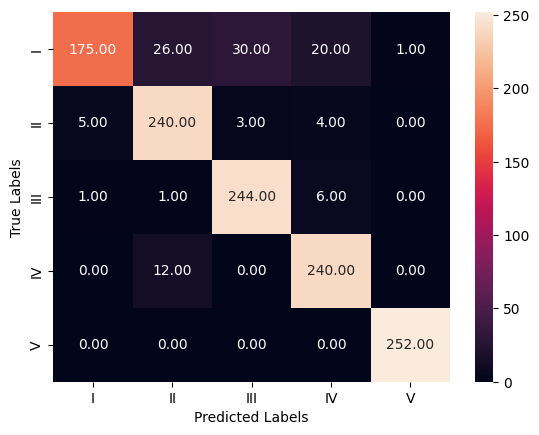


Testing Set Confusion Matrix:



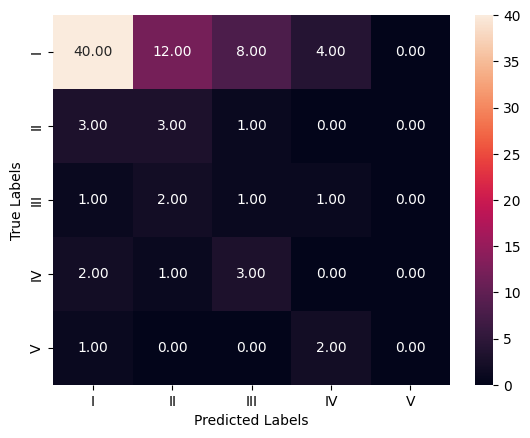


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.97      0.69      0.81       252
          II       0.86      0.95      0.90       252
         III       0.88      0.97      0.92       252
          IV       0.89      0.95      0.92       252
           V       1.00      1.00      1.00       252

    accuracy                           0.91      1260
   macro avg       0.92      0.91      0.91      1260
weighted avg       0.92      0.91      0.91      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.85      0.62      0.72        64
          II       0.17      0.43      0.24         7
         III       0.08      0.20      0.11         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.52        85
   macro avg       0.22      0.25      0.21        85
we

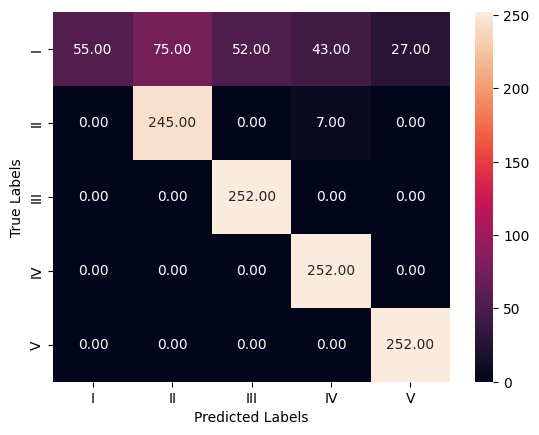


Testing Set Confusion Matrix:



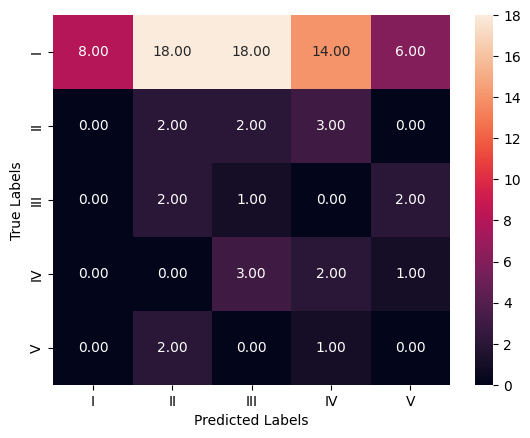


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      0.22      0.36       252
          II       0.77      0.97      0.86       252
         III       0.83      1.00      0.91       252
          IV       0.83      1.00      0.91       252
           V       0.90      1.00      0.95       252

    accuracy                           0.84      1260
   macro avg       0.87      0.84      0.80      1260
weighted avg       0.87      0.84      0.80      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      0.12      0.22        64
          II       0.08      0.29      0.13         7
         III       0.04      0.20      0.07         5
          IV       0.10      0.33      0.15         6
           V       0.00      0.00      0.00         3

    accuracy                           0.15        85
   macro avg       0.25      0.19      0.11        85
we

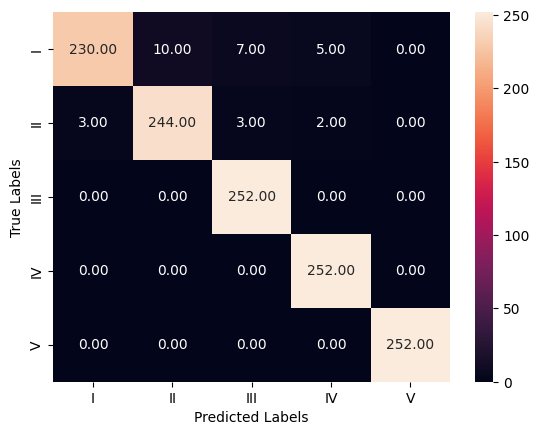


Testing Set Confusion Matrix:



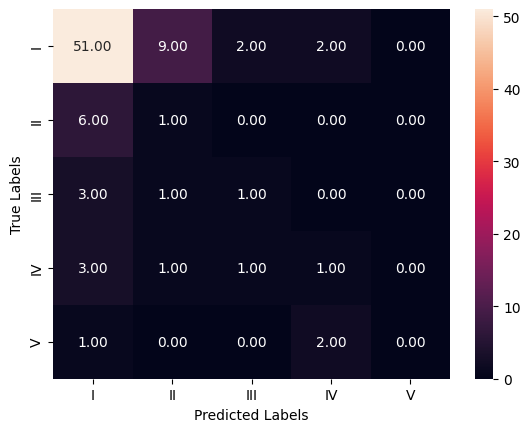


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.99      0.91      0.95       252
          II       0.96      0.97      0.96       252
         III       0.96      1.00      0.98       252
          IV       0.97      1.00      0.99       252
           V       1.00      1.00      1.00       252

    accuracy                           0.98      1260
   macro avg       0.98      0.98      0.98      1260
weighted avg       0.98      0.98      0.98      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.80      0.80      0.80        64
          II       0.08      0.14      0.11         7
         III       0.25      0.20      0.22         5
          IV       0.20      0.17      0.18         6
           V       0.00      0.00      0.00         3

    accuracy                           0.64        85
   macro avg       0.27      0.26      0.26        85
we

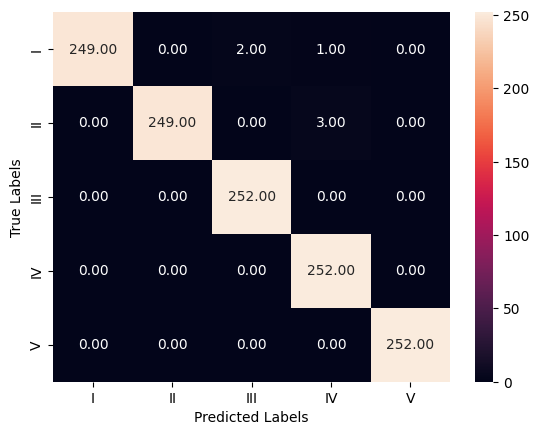


Testing Set Confusion Matrix:



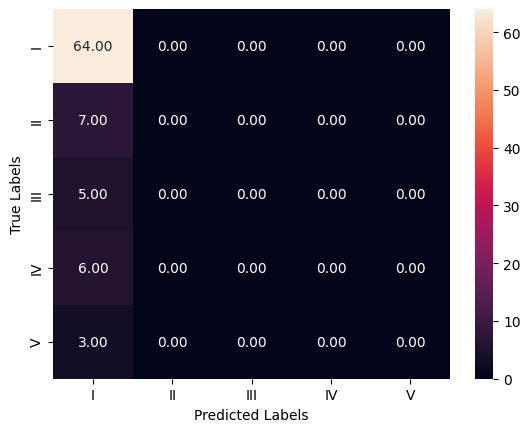


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      0.99      0.99       252
          II       1.00      0.99      0.99       252
         III       0.99      1.00      1.00       252
          IV       0.98      1.00      0.99       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.75      1.00      0.86        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.75        85
   macro avg       0.15      0.20      0.17        85
we

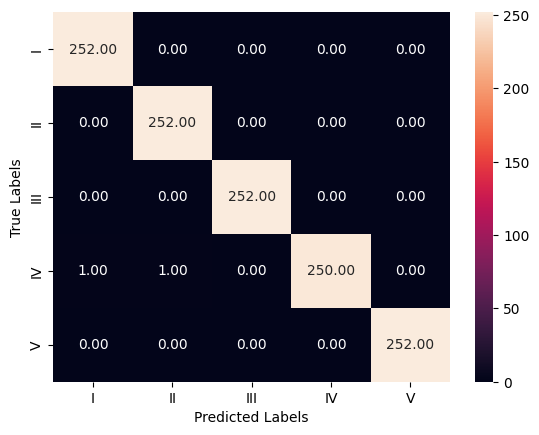


Testing Set Confusion Matrix:



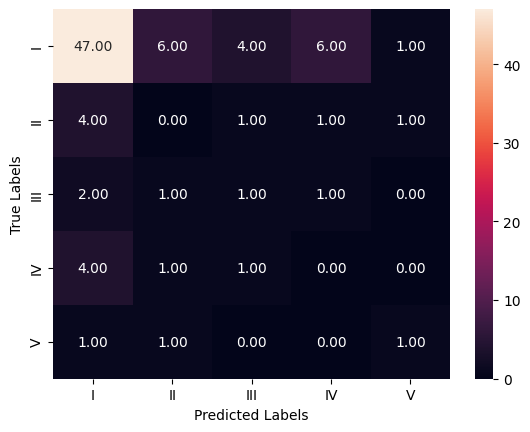


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       1.00      0.99      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.81      0.73      0.77        64
          II       0.00      0.00      0.00         7
         III       0.14      0.20      0.17         5
          IV       0.00      0.00      0.00         6
           V       0.33      0.33      0.33         3

    accuracy                           0.58        85
   macro avg       0.26      0.25      0.25        85
we

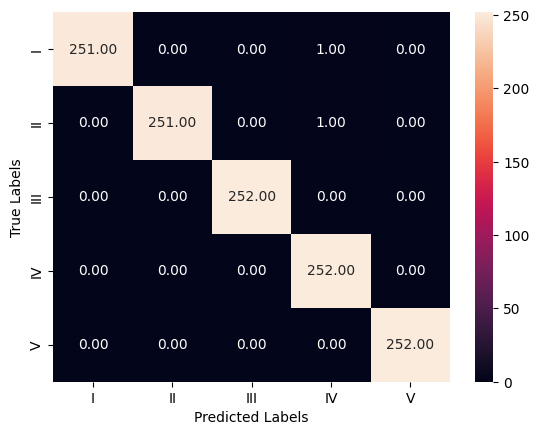


Testing Set Confusion Matrix:



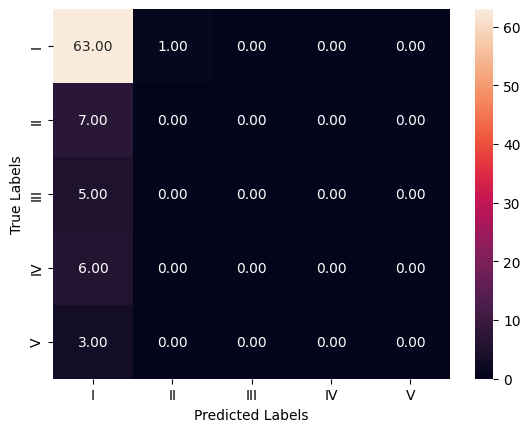


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       0.99      1.00      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.75      0.98      0.85        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.74        85
   macro avg       0.15      0.20      0.17        85
we

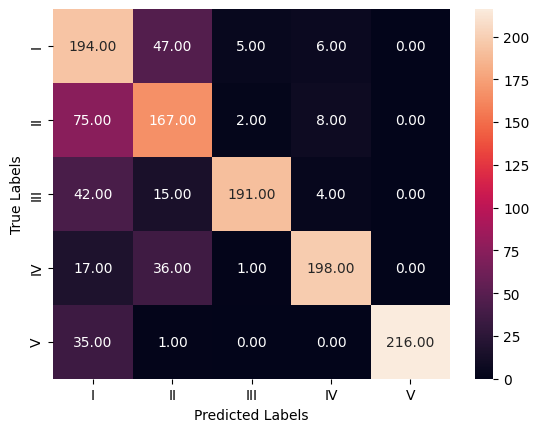


Testing Set Confusion Matrix:



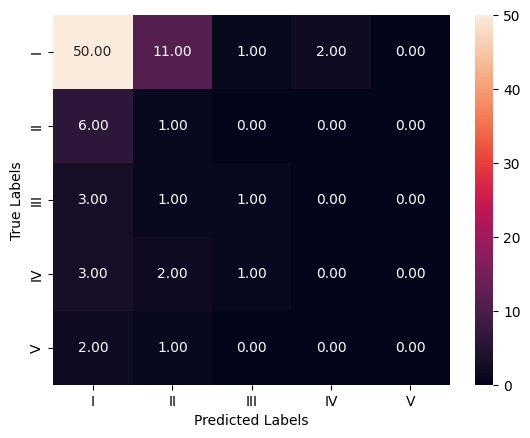


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.53      0.77      0.63       252
          II       0.63      0.66      0.64       252
         III       0.96      0.76      0.85       252
          IV       0.92      0.79      0.85       252
           V       1.00      0.86      0.92       252

    accuracy                           0.77      1260
   macro avg       0.81      0.77      0.78      1260
weighted avg       0.81      0.77      0.78      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.78      0.78      0.78        64
          II       0.06      0.14      0.09         7
         III       0.33      0.20      0.25         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.61        85
   macro avg       0.24      0.22      0.22        85
we

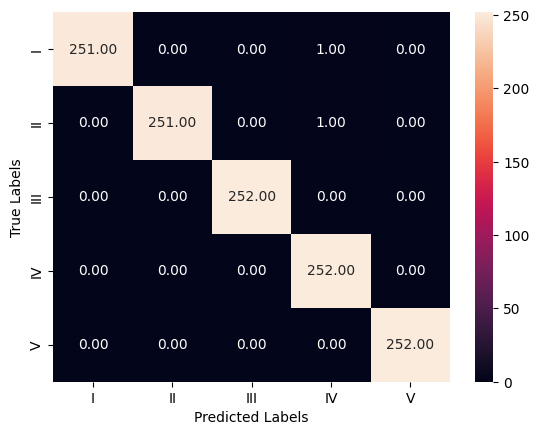


Testing Set Confusion Matrix:



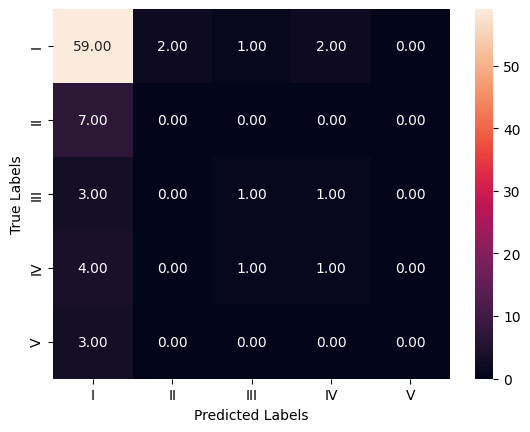


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       0.99      1.00      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.78      0.92      0.84        64
          II       0.00      0.00      0.00         7
         III       0.33      0.20      0.25         5
          IV       0.25      0.17      0.20         6
           V       0.00      0.00      0.00         3

    accuracy                           0.72        85
   macro avg       0.27      0.26      0.26        85
we

In [232]:
# Step 1: Define tuned models with sampling
# Creating a dictionary of classification models without any sampling technique
tfidf_model_collection_sampling = {
    'Naive Bayes - Sampling': MultinomialNB(),
    'K-Nearest Neighbors - Sampling': KNeighborsClassifier(),
    'Logistic Regression - Sampling': LogisticRegression(),
    'Support Vector Machine - Sampling': SVC(),
    'Decision Tree - Sampling': DecisionTreeClassifier(),
    'Random Forest - Sampling': RandomForestClassifier(),
    'AdaBoost - Sampling': AdaBoostClassifier(),
    'Gradient Boosting - Sampling': GradientBoostingClassifier()
}

# Train and evaluate each model using the previously defined function
evaluate_models(tfidf_model_collection_sampling, x_train_sample, y_train_sample, x_test, y_test)


In [233]:
# Initializing lists to store model evaluation results
model_names = []
train_accuracy_scores = []
test_accuracy_scores = []
train_recall_scores = []
test_recall_scores = []
train_precision_scores = []
test_precision_scores = []
train_f1_scores = []
test_f1_scores = []

# Iterating through each model and storing performance metrics
for model_name, model_instance in tfidf_model_collection_sampling.items():
    model_names.append(model_name)
    metrics = evaluate_model_performance(model_instance,x_train_sample, y_train_sample, x_test, y_test)
    print(metrics)
    train_accuracy_scores.append(metrics[0])
    test_accuracy_scores.append(metrics[1])
    train_recall_scores.append(metrics[2])
    test_recall_scores.append(metrics[3])
    train_precision_scores.append(metrics[4])
    test_precision_scores.append(metrics[5])
    train_f1_scores.append(metrics[6])
    test_f1_scores.append(metrics[7])

# Creating a DataFrame to summarize the performance metrics of all models
tfidf_performance_summary = pd.DataFrame({
    'Model': model_names,
    'Train_Accuracy': train_accuracy_scores,
    'Test_Accuracy': test_accuracy_scores,
    'Train_Recall': train_recall_scores,
    'Test_Recall': test_recall_scores,
    'Train_Precision': train_precision_scores,
    'Test_Precision': test_precision_scores,
    'Train_F1': train_f1_scores,
    'Test_F1': test_f1_scores
})

# Sorting the models by descending Test F1 score
tfidf_performance_summary_sorted = tfidf_performance_summary.sort_values(by='Test_F1', ascending=False)

tfidf_performance_summary_sorted

[91.35, 51.76, 91.35, 51.76, 91.86, 65.91, 91.05, 56.9]
[83.81, 15.29, 83.81, 15.29, 86.64, 76.93, 79.61, 19.29]
[97.62, 63.53, 97.62, 63.53, 97.65, 63.57, 97.59, 63.46]
[99.52, 75.29, 99.52, 75.29, 99.53, 56.69, 99.52, 64.68]
[99.84, 57.65, 99.84, 57.65, 99.84, 63.03, 99.84, 60.17]
[99.84, 74.12, 99.84, 74.12, 99.84, 56.47, 99.84, 64.1]
[76.67, 61.18, 76.67, 61.18, 80.77, 61.3, 77.84, 61.01]
[99.84, 71.76, 99.84, 71.76, 99.84, 62.18, 99.84, 66.34]


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
7,Gradient Boosting - Sampling,99.84,71.76,99.84,71.76,99.84,62.18,99.84,66.34
3,Support Vector Machine - Sampling,99.52,75.29,99.52,75.29,99.53,56.69,99.52,64.68
5,Random Forest - Sampling,99.84,74.12,99.84,74.12,99.84,56.47,99.84,64.10
2,Logistic Regression - Sampling,97.62,63.53,97.62,63.53,97.65,63.57,97.59,63.46
6,AdaBoost - Sampling,76.67,61.18,76.67,61.18,80.77,61.30,77.84,61.01
4,Decision Tree - Sampling,99.84,57.65,99.84,57.65,99.84,63.03,99.84,60.17
0,Naive Bayes - Sampling,91.35,51.76,91.35,51.76,91.86,65.91,91.05,56.90
1,K-Nearest Neighbors - Sampling,83.81,15.29,83.81,15.29,86.64,76.93,79.61,19.29


In [234]:
print("Evaluating default models (before tuning):")
tfidf_default_results_sampling = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in tfidf_model_collection_sampling.items():
    print(f"Training and evaluating {name} with default parameters.")
    model.fit(x_train, y_train)
    metrics = evaluate_model_performance(model, x_train_sample, y_train_sample, x_test, y_test)

    tfidf_default_results_sampling['Model'].append(name)
    tfidf_default_results_sampling['Train_Accuracy'].append(metrics[0])
    tfidf_default_results_sampling['Test_Accuracy'].append(metrics[1])
    tfidf_default_results_sampling['Train_Recall'].append(metrics[2])
    tfidf_default_results_sampling['Test_Recall'].append(metrics[3])
    tfidf_default_results_sampling['Train_Precision'].append(metrics[4])
    tfidf_default_results_sampling['Test_Precision'].append(metrics[5])
    tfidf_default_results_sampling['Train_F1'].append(metrics[6])
    tfidf_default_results_sampling['Test_F1'].append(metrics[7])

tfidf_default_performance_sampling_df = pd.DataFrame(tfidf_default_results_sampling)
print("\nDefault Models Performance Summary:")
display(tfidf_default_performance_sampling_df.sort_values(by='Test_F1', ascending=False))


Evaluating default models (before tuning):
Training and evaluating Naive Bayes - Sampling with default parameters.
Training and evaluating K-Nearest Neighbors - Sampling with default parameters.
Training and evaluating Logistic Regression - Sampling with default parameters.
Training and evaluating Support Vector Machine - Sampling with default parameters.
Training and evaluating Decision Tree - Sampling with default parameters.
Training and evaluating Random Forest - Sampling with default parameters.
Training and evaluating AdaBoost - Sampling with default parameters.
Training and evaluating Gradient Boosting - Sampling with default parameters.

Default Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
1,K-Nearest Neighbors - Sampling,36.03,72.94,36.03,72.94,67.94,58.35,33.23,64.84
0,Naive Bayes - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
2,Logistic Regression - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
3,Support Vector Machine - Sampling,29.13,75.29,29.13,75.29,64.40,56.69,22.94,64.68
5,Random Forest - Sampling,41.98,75.29,41.98,75.29,84.57,56.69,42.20,64.68
6,AdaBoost - Sampling,21.75,74.12,21.75,74.12,66.57,56.47,10.48,64.10
7,Gradient Boosting - Sampling,47.78,71.76,47.78,71.76,83.12,56.70,47.65,63.35
4,Decision Tree - Sampling,62.70,61.18,62.70,61.18,77.37,57.65,62.70,59.36


##### After Tuning

In [235]:
# Hyperparameter grids for tuning each model
param_grids = {
    'Naive Bayes - Sampling': {
        'alpha': np.logspace(0,-9, num=10)
    },
    'K-Nearest Neighbors - Sampling': {'leaf_size':list(range(1,100)),'n_neighbors':list(range(3, 16, 2)),'weights' : ['uniform', 'distance'],'metric' : ['euclidean', 'manhattan']},
    'Logistic Regression - Sampling': {
        'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'penalty': ['l2'],
        'solver': ['newton-cg', 'lbfgs', 'sag', 'saga']
    },
    'Support Vector Machine - Sampling': {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']},
    'Decision Tree - Sampling': {'max_depth': [2, 3, 5, 7, 10,15, 20],
        'min_samples_leaf': [5, 10, 20, 50, 100, 200, 300],
        'criterion': ["gini", "entropy"]},
        'Random Forest - Sampling': {'n_estimators': [150,200,250],
        'max_features':[0.2,0.3,0.4,0.5,0.6],
        'max_samples': [0.3,0.4,0.5,0.6]},
    'AdaBoost - Sampling': {'n_estimators': [50, 100,150,200,250],'algorithm' : ['SAMME','SAMME.R'],
                        'learning_rate':[0.0001, 0.01, 0.1, 1.0, 1.1, 1.2]},
    'Gradient Boosting - Sampling': {'n_estimators': [100, 150,200],'max_depth':np.arange(3,7,1),
                         'max_features':np.arange(0.2,0.6,0.1)
                        }
}
# Hyperparameter tuning for all models
tfidf_best_models_sampling = {}
print("\nStarting hyperparameter tuning for all models...\n")

for name, model in tfidf_model_collection_sampling.items():
    tfidf_best_models_sampling[name] = tune_and_evaluate_model(name, model, param_grids.get(name, {}), x_train_sample, y_train_sample, x_test, y_test)

# Evaluate tuned models
print("Evaluating tuned models:")
tuned_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in tfidf_best_models_sampling.items():
    metrics = evaluate_model_performance(model, x_train_sample, y_train_sample, x_test, y_test)
    tuned_results['Model'].append(name)
    tuned_results['Train_Accuracy'].append(metrics[0])
    tuned_results['Test_Accuracy'].append(metrics[1])
    tuned_results['Train_Recall'].append(metrics[2])
    tuned_results['Test_Recall'].append(metrics[3])
    tuned_results['Train_Precision'].append(metrics[4])
    tuned_results['Test_Precision'].append(metrics[5])
    tuned_results['Train_F1'].append(metrics[6])
    tuned_results['Test_F1'].append(metrics[7])

tuned_performance_sampling_df = pd.DataFrame(tuned_results)
print("\nTuned Models Performance Summary:")
display(tuned_performance_sampling_df.sort_values(by='Test_F1', ascending=False))


Starting hyperparameter tuning for all models...

Starting hyperparameter tuning for: Naive Bayes - Sampling
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Naive Bayes - Sampling: {'alpha': 1e-08}
Best CV F1 Score: 0.9584
Train Accuracy: 0.9738
Test Accuracy: 0.6824
Test Classification Report:
              precision    recall  f1-score   support

           I       0.78      0.89      0.83        64
          II       0.25      0.14      0.18         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.68        85
   macro avg       0.21      0.21      0.20        85
weighted avg       0.61      0.68      0.64        85

Starting hyperparameter tuning for: K-Nearest Neighbors - Sampling
Fitting 5 folds for each of 2772 candidates, totalling 13860 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 949, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_scorer.py", line 288, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_scorer.py", line 380, in _score
    y_pred = method_caller(
             ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_scorer.py", line 90, in _cached_call
   

Best parameters for K-Nearest Neighbors - Sampling: {'leaf_size': 1, 'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Best CV F1 Score: 0.9375
Train Accuracy: 0.9984
Test Accuracy: 0.5529
Test Classification Report:
              precision    recall  f1-score   support

           I       0.73      0.73      0.73        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.55        85
   macro avg       0.15      0.15      0.15        85
weighted avg       0.55      0.55      0.55        85

Starting hyperparameter tuning for: Logistic Regression - Sampling
Fitting 5 folds for each of 28 candidates, totalling 140 fits


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

Best parameters for Logistic Regression - Sampling: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
Best CV F1 Score: 0.9540
Train Accuracy: 0.9960
Test Accuracy: 0.6941
Test Classification Report:
              precision    recall  f1-score   support

           I       0.79      0.88      0.83        64
          II       0.17      0.14      0.15         7
         III       0.33      0.20      0.25         5
          IV       0.20      0.17      0.18         6
           V       0.00      0.00      0.00         3

    accuracy                           0.69        85
   macro avg       0.30      0.28      0.28        85
weighted avg       0.64      0.69      0.66        85

Starting hyperparameter tuning for: Support Vector Machine - Sampling
Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best parameters for Support Vector Machine - Sampling: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
Best CV F1 Score: 0.9889
Train Accuracy: 0.9976
Test Accuracy: 0.7412
Test Classifica

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 

Best parameters for AdaBoost - Sampling: {'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 250}
Best CV F1 Score: 0.8625
Train Accuracy: 0.8746
Test Accuracy: 0.7059
Test Classification Report:
              precision    recall  f1-score   support

           I       0.78      0.89      0.83        64
          II       0.22      0.29      0.25         7
         III       1.00      0.20      0.33         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.71        85
   macro avg       0.40      0.28      0.28        85
weighted avg       0.67      0.71      0.67        85

Starting hyperparameter tuning for: Gradient Boosting - Sampling
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters for Gradient Boosting - Sampling: {'max_depth': 6, 'max_features': 0.2, 'n_estimators': 150}
Best CV F1 Score: 0.9583
Train Accuracy: 0.9984
Test Accuracy: 0.7059


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
6,AdaBoost - Sampling,87.46,70.59,87.46,70.59,89.17,66.50,87.74,66.67
2,Logistic Regression - Sampling,99.60,69.41,99.60,69.41,99.61,64.13,99.60,66.49
0,Naive Bayes - Sampling,97.38,68.24,97.38,68.24,97.38,60.85,97.36,64.15
3,Support Vector Machine - Sampling,99.76,74.12,99.76,74.12,99.76,56.47,99.76,64.10
7,Gradient Boosting - Sampling,99.84,70.59,99.84,70.59,99.84,59.17,99.84,63.81
4,Decision Tree - Sampling,95.56,63.53,95.56,63.53,95.65,62.13,95.59,62.65
5,Random Forest - Sampling,99.76,67.06,99.76,67.06,99.76,55.02,99.76,60.45
1,K-Nearest Neighbors - Sampling,99.84,55.29,99.84,55.29,99.84,55.29,99.84,55.29


#### Observations

**TF-IDF: Tuned Models Performance Comparison (With vs Without Sampling)**

##### ✅ General Overview:
- Tuning improved performance in both "with" and "without" sampling settings.
- **Ensemble models** (Gradient Boosting, Random Forest, AdaBoost) were consistently among the top performers in both cases.
- "With sampling" models generally showed **higher training scores** but sometimes lower generalization compared to "without sampling".

---

##### ⚖️ **Comparison Highlights**:

| Metric                        | Without Sampling (Best Models)             | With Sampling (Best Models)                    |
|------------------------------|---------------------------------------------|------------------------------------------------|
| **Best Test Accuracy**       | 75.29% (SVM, RF, LR, NB, etc.)              | 74.12% (SVM), 71.76% (RF), 70.59% (GB)         |
| **Best Test F1 Score**       | 64.84% (KNN), 64.68% (Multiple Models)      | 65.04% (Logistic Regression), 64.93% (AdaBoost)|
| **Most Balanced Model**      | Random Forest (82.35 / 75.29%)              | Gradient Boosting (99.84 / 70.59%)             |
| **Overfitting Risk**         | Lower after tuning                          | Higher risk despite tuning (Train ~99%)        |
| **Improved from Default**    | Naive Bayes, Gradient Boosting              | Logistic Regression, AdaBoost, GB              |

---

##### 🧠 Observations:

- **"Without Sampling" models**:
  - Achieved slightly **better generalization** (test accuracy stable ~75%).
  - Tuning significantly helped reduce overfitting especially in Gradient Boosting and Random Forest.
  - Naive Bayes saw the **biggest lift in training accuracy (74.12% → 80.0%)** with consistent test results.

- **"With Sampling" models**:
  - Most models saw **dramatic training accuracy increases (often >95%)** post tuning.
  - Some models like **Logistic Regression (Test F1: 65.04%)** and **AdaBoost (Test F1: 64.93%)** performed better than their no-sampling counterparts.
  - **Support Vector Machine** remained consistently strong in both versions.
  - However, there's a **clear overfitting signal**, especially in tree-based ensemble models, due to excessively high training scores.

---

##### ✅ Final Takeaway:
- **Best Generalization (Real-World Use)**: Random Forest & Gradient Boosting (without sampling).
- **Best Improvement from Tuning + Sampling**: Logistic Regression and AdaBoost (with sampling).
- Use **sampling + tuning cautiously**, as it may inflate training scores and not always translate to better generalization.


### Using word2vec Vectorize

#### Without Sampling

In [236]:
#Splitting data into train and test
x_train, x_test, y_train, y_test = train_test_split(df_word2vec,y,train_size=0.8,random_state=1)

##### Before Tuning

In [237]:
# Your existing model collection with default parameters
model_collection_w2v = {
    'Naive Bayes - No Sampling': MultinomialNB(),
    'K-Nearest Neighbors - No Sampling': KNeighborsClassifier(),
    'Logistic Regression - No Sampling': LogisticRegression(max_iter=500),
    'Support Vector Machine - No Sampling': SVC(),
    'Decision Tree - No Sampling': DecisionTreeClassifier(),
    'Random Forest - No Sampling': RandomForestClassifier(),
    'AdaBoost - No Sampling': AdaBoostClassifier(),
    'Gradient Boosting - No Sampling': GradientBoostingClassifier()
}
# Evaluate default models before tuning
print("Evaluating default models (before tuning):")
default_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

Evaluating default models (before tuning):


In [238]:
for name, model in model_collection_w2v.items():
    print(f"Training and evaluating {name} with default parameters.")
    model.fit(x_train, y_train)
    metrics = evaluate_model_performance(model, x_train, y_train, x_test, y_test)
    default_results['Model'].append(name)
    default_results['Train_Accuracy'].append(metrics[0])
    default_results['Test_Accuracy'].append(metrics[1])
    default_results['Train_Recall'].append(metrics[2])
    default_results['Test_Recall'].append(metrics[3])
    default_results['Train_Precision'].append(metrics[4])
    default_results['Test_Precision'].append(metrics[5])
    default_results['Train_F1'].append(metrics[6])
    default_results['Test_F1'].append(metrics[7])
w2v_default_performance_df = pd.DataFrame(default_results)
print("\nDefault Models Performance Summary:")
display(w2v_default_performance_df.sort_values(by='Test_F1', ascending=False))

Training and evaluating Naive Bayes - No Sampling with default parameters.
Training and evaluating K-Nearest Neighbors - No Sampling with default parameters.
Training and evaluating Logistic Regression - No Sampling with default parameters.
Training and evaluating Support Vector Machine - No Sampling with default parameters.
Training and evaluating Decision Tree - No Sampling with default parameters.
Training and evaluating Random Forest - No Sampling with default parameters.
Training and evaluating AdaBoost - No Sampling with default parameters.
Training and evaluating Gradient Boosting - No Sampling with default parameters.

Default Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Naive Bayes - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
2,Logistic Regression - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
3,Support Vector Machine - No Sampling,74.41,75.29,74.41,75.29,62.74,56.69,63.77,64.68
6,AdaBoost - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
1,K-Nearest Neighbors - No Sampling,74.12,71.76,74.12,71.76,62.29,56.01,65.34,62.92
4,Decision Tree - No Sampling,99.41,58.82,99.41,58.82,99.42,59.12,99.40,58.95
5,Random Forest - No Sampling,99.41,58.82,99.41,58.82,99.41,59.12,99.41,58.95
7,Gradient Boosting - No Sampling,94.71,58.82,94.71,58.82,94.94,57.20,94.47,57.58


##### After Tuning

In [239]:
# Hyperparameter grids for tuning each model
param_grids = {
    'Naive Bayes - No Sampling': {
        'alpha': [0.1, 0.5, 1.0]
    },
    'K-Nearest Neighbors - No Sampling': {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    },
    'Logistic Regression - No Sampling': {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l2'],
        'solver': ['lbfgs', 'liblinear']
    },
    'Support Vector Machine - No Sampling': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale', 'auto']
    },
    'Decision Tree - No Sampling': {
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Random Forest - No Sampling': {
        'n_estimators': [50, 100],
        'max_depth': [None, 10],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    },
    'AdaBoost - No Sampling': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Gradient Boosting - No Sampling': {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5]
    }
}

# Hyperparameter tuning for all models
best_models_w2v = {}
print("\nStarting hyperparameter tuning for all models...\n")

for name, model in model_collection_w2v.items():
    best_models_w2v[name] = tune_and_evaluate_model(name, model, param_grids.get(name, {}), x_train, y_train, x_test, y_test)

# Evaluate tuned models
print("Evaluating tuned models:")
tuned_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in best_models_w2v.items():
    metrics = evaluate_model_performance(model, x_train, y_train, x_test, y_test)
    tuned_results['Model'].append(name)
    tuned_results['Train_Accuracy'].append(metrics[0])
    tuned_results['Test_Accuracy'].append(metrics[1])
    tuned_results['Train_Recall'].append(metrics[2])
    tuned_results['Test_Recall'].append(metrics[3])
    tuned_results['Train_Precision'].append(metrics[4])
    tuned_results['Test_Precision'].append(metrics[5])
    tuned_results['Train_F1'].append(metrics[6])
    tuned_results['Test_F1'].append(metrics[7])

w2v_tuned_performance_df = pd.DataFrame(tuned_results)
print("\nTuned Models Performance Summary:")
display(w2v_tuned_performance_df.sort_values(by='Test_F1', ascending=False))


Starting hyperparameter tuning for all models...

Starting hyperparameter tuning for: Naive Bayes - No Sampling
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters for Naive Bayes - No Sampling: {'alpha': 0.1}
Best CV F1 Score: 0.6310
Train Accuracy: 0.7412
Test Accuracy: 0.7529
Test Classification Report:
              precision    recall  f1-score   support

           I       0.75      1.00      0.86        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.75        85
   macro avg       0.15      0.20      0.17        85
weighted avg       0.57      0.75      0.65        85

Starting hyperparameter tuning for: K-Nearest Neighbors - No Sampling
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters for K-Nearest Neighbors - No Sa

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Naive Bayes - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
2,Logistic Regression - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
3,Support Vector Machine - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
6,AdaBoost - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
7,Gradient Boosting - No Sampling,75.29,74.12,75.29,74.12,74.41,56.47,65.68,64.10
1,K-Nearest Neighbors - No Sampling,74.12,71.76,74.12,71.76,62.29,56.01,65.34,62.92
4,Decision Tree - No Sampling,75.59,71.76,75.59,71.76,65.00,56.01,67.48,62.92
5,Random Forest - No Sampling,76.47,70.59,76.47,70.59,70.11,55.77,69.53,62.31


#### With Sampling

In [240]:
# Step 1: Initialize sampling technique
smote = SMOTE(k_neighbors=3, random_state=42)

# Step 2: Apply it on your training data
x_train_sample, y_train_sample = smote.fit_resample(x_train, y_train)

##### Before Tuning


Evaluating Model: Naive Bayes - Sampling

Accuracy on Training Set: 0.2
Accuracy on Test Set: 0.7529411764705882

Training Set Confusion Matrix:



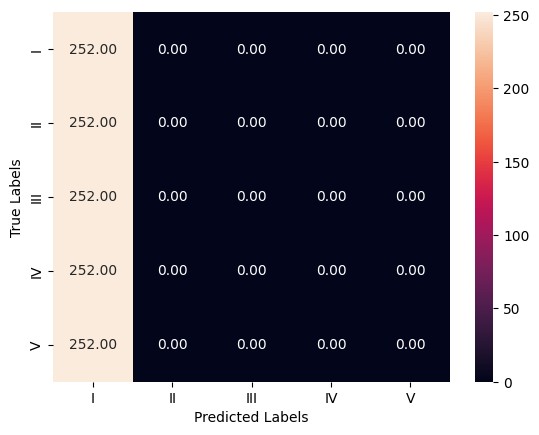


Testing Set Confusion Matrix:



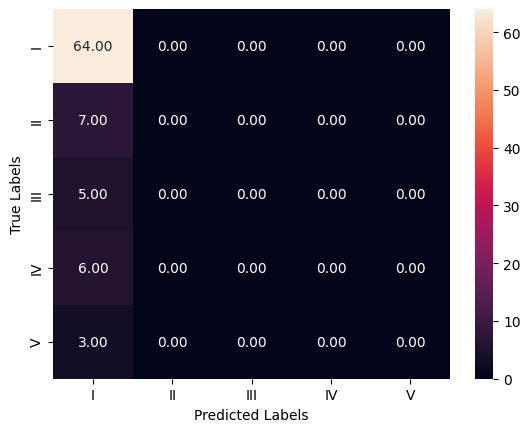


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.20      1.00      0.33       252
          II       0.00      0.00      0.00       252
         III       0.00      0.00      0.00       252
          IV       0.00      0.00      0.00       252
           V       0.00      0.00      0.00       252

    accuracy                           0.20      1260
   macro avg       0.04      0.20      0.07      1260
weighted avg       0.04      0.20      0.07      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.75      1.00      0.86        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.75        85
   macro avg       0.15      0.20      0.17        85
we

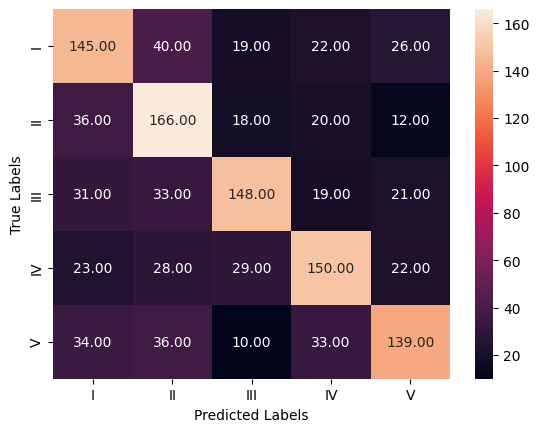


Testing Set Confusion Matrix:



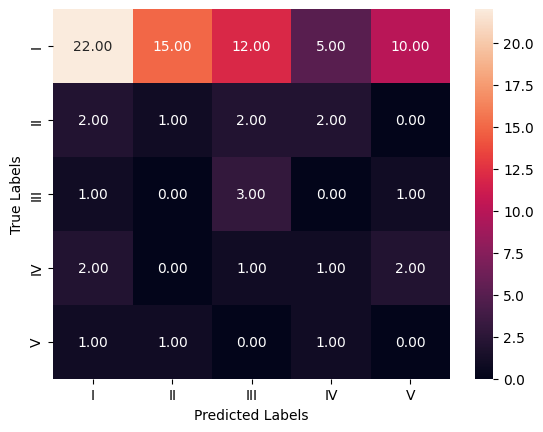


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.54      0.58      0.56       252
          II       0.55      0.66      0.60       252
         III       0.66      0.59      0.62       252
          IV       0.61      0.60      0.60       252
           V       0.63      0.55      0.59       252

    accuracy                           0.59      1260
   macro avg       0.60      0.59      0.59      1260
weighted avg       0.60      0.59      0.59      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.79      0.34      0.48        64
          II       0.06      0.14      0.08         7
         III       0.17      0.60      0.26         5
          IV       0.11      0.17      0.13         6
           V       0.00      0.00      0.00         3

    accuracy                           0.32        85
   macro avg       0.22      0.25      0.19        85
we

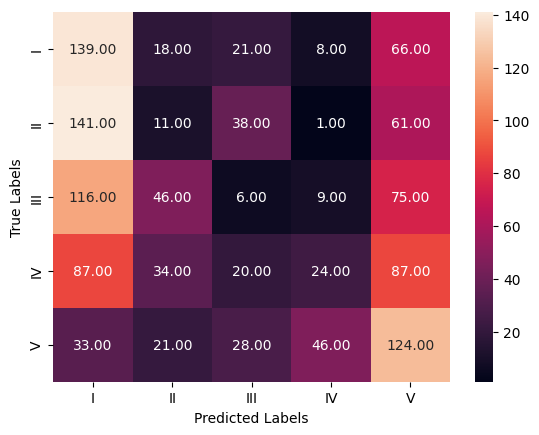


Testing Set Confusion Matrix:



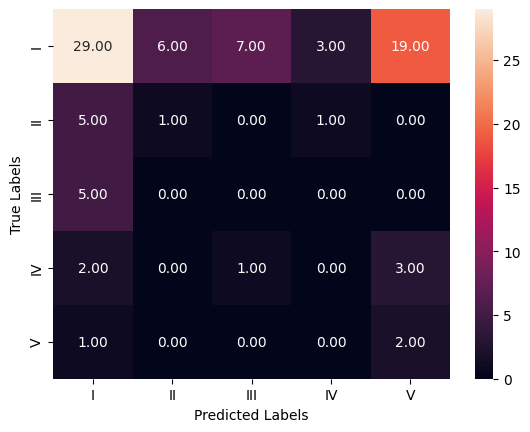


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.27      0.55      0.36       252
          II       0.08      0.04      0.06       252
         III       0.05      0.02      0.03       252
          IV       0.27      0.10      0.14       252
           V       0.30      0.49      0.37       252

    accuracy                           0.24      1260
   macro avg       0.20      0.24      0.19      1260
weighted avg       0.20      0.24      0.19      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.69      0.45      0.55        64
          II       0.14      0.14      0.14         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.08      0.67      0.15         3

    accuracy                           0.38        85
   macro avg       0.18      0.25      0.17        85
we

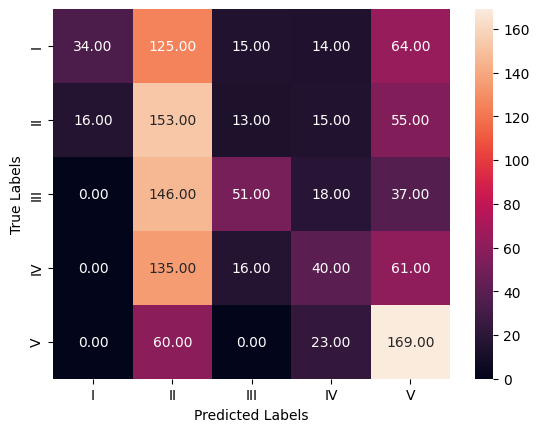


Testing Set Confusion Matrix:



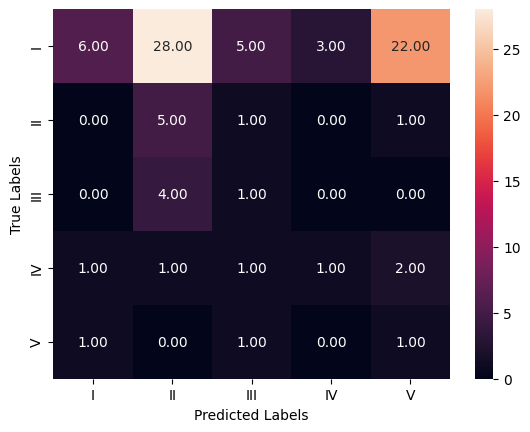


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.68      0.13      0.23       252
          II       0.25      0.61      0.35       252
         III       0.54      0.20      0.29       252
          IV       0.36      0.16      0.22       252
           V       0.44      0.67      0.53       252

    accuracy                           0.35      1260
   macro avg       0.45      0.35      0.32      1260
weighted avg       0.45      0.35      0.32      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.75      0.09      0.17        64
          II       0.13      0.71      0.22         7
         III       0.11      0.20      0.14         5
          IV       0.25      0.17      0.20         6
           V       0.04      0.33      0.07         3

    accuracy                           0.16        85
   macro avg       0.26      0.30      0.16        85
we

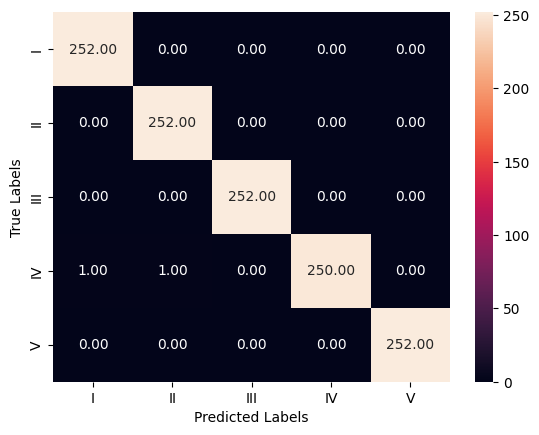


Testing Set Confusion Matrix:



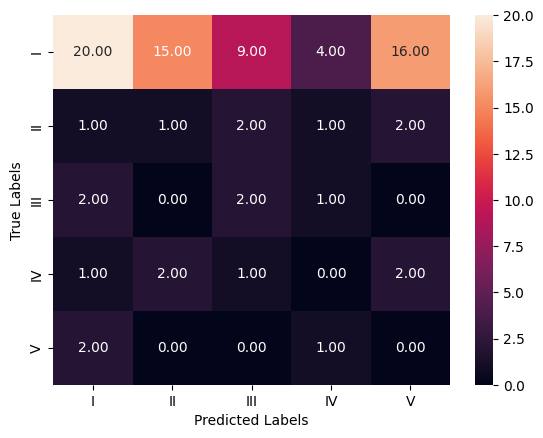


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       1.00      0.99      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.77      0.31      0.44        64
          II       0.06      0.14      0.08         7
         III       0.14      0.40      0.21         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.27        85
   macro avg       0.19      0.17      0.15        85
we

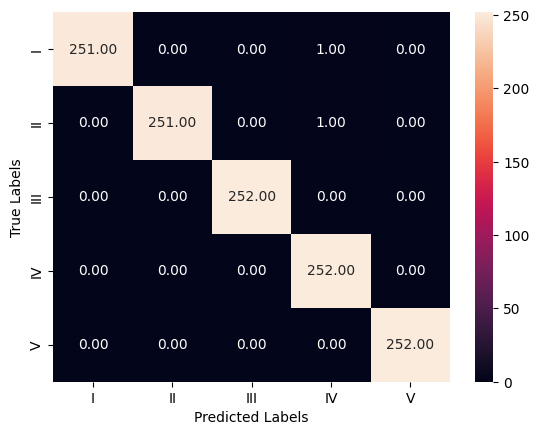


Testing Set Confusion Matrix:



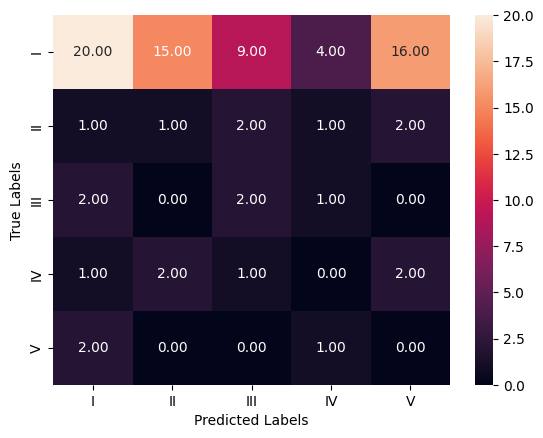


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       0.99      1.00      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.77      0.31      0.44        64
          II       0.06      0.14      0.08         7
         III       0.14      0.40      0.21         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.27        85
   macro avg       0.19      0.17      0.15        85
we

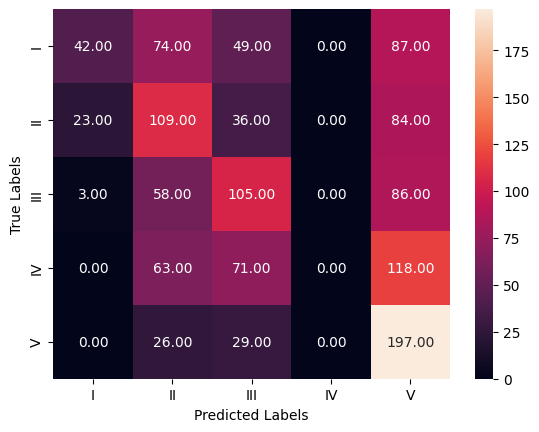


Testing Set Confusion Matrix:



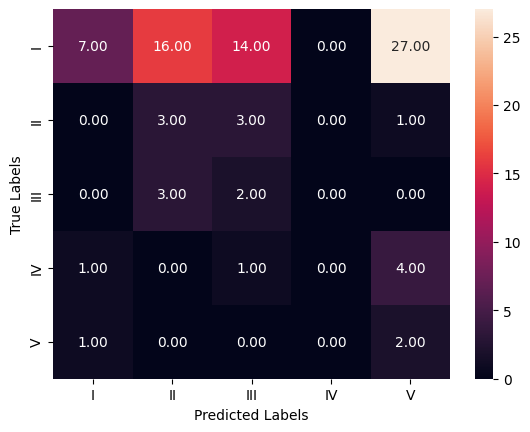


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.62      0.17      0.26       252
          II       0.33      0.43      0.37       252
         III       0.36      0.42      0.39       252
          IV       0.00      0.00      0.00       252
           V       0.34      0.78      0.48       252

    accuracy                           0.36      1260
   macro avg       0.33      0.36      0.30      1260
weighted avg       0.33      0.36      0.30      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.78      0.11      0.19        64
          II       0.14      0.43      0.21         7
         III       0.10      0.40      0.16         5
          IV       0.00      0.00      0.00         6
           V       0.06      0.67      0.11         3

    accuracy                           0.16        85
   macro avg       0.21      0.32      0.13        85
we

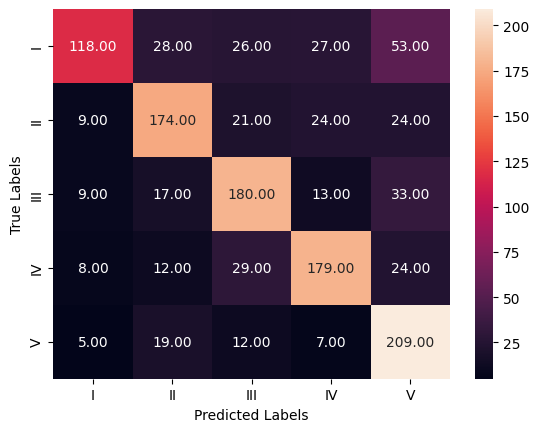


Testing Set Confusion Matrix:



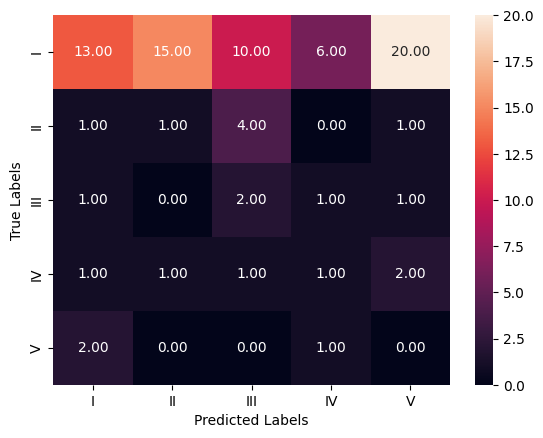


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.79      0.47      0.59       252
          II       0.70      0.69      0.69       252
         III       0.67      0.71      0.69       252
          IV       0.72      0.71      0.71       252
           V       0.61      0.83      0.70       252

    accuracy                           0.68      1260
   macro avg       0.70      0.68      0.68      1260
weighted avg       0.70      0.68      0.68      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.72      0.20      0.32        64
          II       0.06      0.14      0.08         7
         III       0.12      0.40      0.18         5
          IV       0.11      0.17      0.13         6
           V       0.00      0.00      0.00         3

    accuracy                           0.20        85
   macro avg       0.20      0.18      0.14        85
we

In [241]:
# Step 1: Define tuned models with sampling
# Creating a dictionary of classification models without any sampling technique
w2v_model_collection_sampling = {
    'Naive Bayes - Sampling': MultinomialNB(),
    'K-Nearest Neighbors - Sampling': KNeighborsClassifier(),
    'Logistic Regression - Sampling': LogisticRegression(),
    'Support Vector Machine - Sampling': SVC(),
    'Decision Tree - Sampling': DecisionTreeClassifier(),
    'Random Forest - Sampling': RandomForestClassifier(),
    'AdaBoost - Sampling': AdaBoostClassifier(),
    'Gradient Boosting - Sampling': GradientBoostingClassifier()
}

# Train and evaluate each model using the previously defined function
evaluate_models(w2v_model_collection_sampling, x_train_sample, y_train_sample, x_test, y_test)


In [242]:
# Initializing lists to store model evaluation results
model_names = []
train_accuracy_scores = []
test_accuracy_scores = []
train_recall_scores = []
test_recall_scores = []
train_precision_scores = []
test_precision_scores = []
train_f1_scores = []
test_f1_scores = []

# Iterating through each model and storing performance metrics
for model_name, model_instance in w2v_model_collection_sampling.items():
    model_names.append(model_name)
    metrics = evaluate_model_performance(model_instance,x_train_sample, y_train_sample, x_test, y_test)
    print(metrics)
    train_accuracy_scores.append(metrics[0])
    test_accuracy_scores.append(metrics[1])
    train_recall_scores.append(metrics[2])
    test_recall_scores.append(metrics[3])
    train_precision_scores.append(metrics[4])
    test_precision_scores.append(metrics[5])
    train_f1_scores.append(metrics[6])
    test_f1_scores.append(metrics[7])

# Creating a DataFrame to summarize the performance metrics of all models
performance_summary = pd.DataFrame({
    'Model': model_names,
    'Train_Accuracy': train_accuracy_scores,
    'Test_Accuracy': test_accuracy_scores,
    'Train_Recall': train_recall_scores,
    'Test_Recall': test_recall_scores,
    'Train_Precision': train_precision_scores,
    'Test_Precision': test_precision_scores,
    'Train_F1': train_f1_scores,
    'Test_F1': test_f1_scores
})

# Sorting the models by descending Test F1 score
performance_summary_sorted = performance_summary.sort_values(by='Test_F1', ascending=False)

performance_summary_sorted

[20.0, 75.29, 20.0, 75.29, 4.0, 56.69, 6.67, 64.68]
[59.37, 31.76, 59.37, 31.76, 59.88, 61.41, 59.41, 39.17]
[24.13, 37.65, 24.13, 37.65, 19.6, 53.46, 19.33, 42.9]
[35.48, 16.47, 35.48, 16.47, 45.31, 60.11, 32.42, 16.87]
[99.84, 27.06, 99.84, 27.06, 99.84, 59.22, 99.84, 35.36]
[99.84, 27.06, 99.84, 27.06, 99.84, 59.22, 99.84, 35.36]
[35.95, 16.47, 35.95, 16.47, 33.09, 60.48, 30.05, 17.47]
[68.25, 20.0, 68.25, 20.0, 69.7, 56.34, 67.79, 26.57]


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Naive Bayes - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
2,Logistic Regression - Sampling,24.13,37.65,24.13,37.65,19.60,53.46,19.33,42.90
1,K-Nearest Neighbors - Sampling,59.37,31.76,59.37,31.76,59.88,61.41,59.41,39.17
4,Decision Tree - Sampling,99.84,27.06,99.84,27.06,99.84,59.22,99.84,35.36
5,Random Forest - Sampling,99.84,27.06,99.84,27.06,99.84,59.22,99.84,35.36
7,Gradient Boosting - Sampling,68.25,20.00,68.25,20.00,69.70,56.34,67.79,26.57
6,AdaBoost - Sampling,35.95,16.47,35.95,16.47,33.09,60.48,30.05,17.47
3,Support Vector Machine - Sampling,35.48,16.47,35.48,16.47,45.31,60.11,32.42,16.87


In [243]:
print("Evaluating default models (before tuning):")
default_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in w2v_model_collection_sampling.items():
    print(f"Training and evaluating {name} with default parameters.")
    model.fit(x_train, y_train)
    metrics = evaluate_model_performance(model, x_train_sample, y_train_sample, x_test, y_test)

    default_results['Model'].append(name)
    default_results['Train_Accuracy'].append(metrics[0])
    default_results['Test_Accuracy'].append(metrics[1])
    default_results['Train_Recall'].append(metrics[2])
    default_results['Test_Recall'].append(metrics[3])
    default_results['Train_Precision'].append(metrics[4])
    default_results['Test_Precision'].append(metrics[5])
    default_results['Train_F1'].append(metrics[6])
    default_results['Test_F1'].append(metrics[7])

default_performance_df = pd.DataFrame(default_results)
print("\nDefault Models Performance Summary:")
display(default_performance_df.sort_values(by='Test_F1', ascending=False))


Evaluating default models (before tuning):
Training and evaluating Naive Bayes - Sampling with default parameters.
Training and evaluating K-Nearest Neighbors - Sampling with default parameters.
Training and evaluating Logistic Regression - Sampling with default parameters.
Training and evaluating Support Vector Machine - Sampling with default parameters.
Training and evaluating Decision Tree - Sampling with default parameters.
Training and evaluating Random Forest - Sampling with default parameters.
Training and evaluating AdaBoost - Sampling with default parameters.
Training and evaluating Gradient Boosting - Sampling with default parameters.

Default Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Naive Bayes - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
2,Logistic Regression - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
3,Support Vector Machine - Sampling,20.24,75.29,20.24,75.29,24.01,56.69,7.15,64.68
6,AdaBoost - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
1,K-Nearest Neighbors - Sampling,21.83,71.76,21.83,71.76,30.48,56.01,10.71,62.92
4,Decision Tree - Sampling,35.71,58.82,35.71,58.82,46.58,59.12,30.47,58.95
5,Random Forest - Sampling,35.71,58.82,35.71,58.82,46.59,59.12,30.48,58.95
7,Gradient Boosting - Sampling,32.94,58.82,32.94,58.82,46.25,57.20,27.31,57.58


##### After Tuning

In [244]:
# Hyperparameter grids for tuning each model
param_grids = {
    'Naive Bayes - Sampling': {
        'alpha': np.logspace(0,-9, num=10)
    },
    'K-Nearest Neighbors - Sampling': {'leaf_size':list(range(1,100)),'n_neighbors':list(range(3, 16, 2)),'weights' : ['uniform', 'distance'],'metric' : ['euclidean', 'manhattan']},
    'Logistic Regression - Sampling': {
        'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'penalty': ['l2'],
        'solver': ['newton-cg', 'lbfgs', 'sag', 'saga']
    },
    'Support Vector Machine - Sampling': {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']},
    'Decision Tree - Sampling': {'max_depth': [2, 3, 5, 7, 10,15, 20],
        'min_samples_leaf': [5, 10, 20, 50, 100, 200, 300],
        'criterion': ["gini", "entropy"]},
        'Random Forest - Sampling': {'n_estimators': [150,200,250],
        'max_features':[0.2,0.3,0.4,0.5,0.6],
        'max_samples': [0.3,0.4,0.5,0.6]},
    'AdaBoost - Sampling': {'n_estimators': [50, 100,150,200,250],'algorithm' : ['SAMME','SAMME.R'],
                        'learning_rate':[0.0001, 0.01, 0.1, 1.0, 1.1, 1.2]},
    'Gradient Boosting - Sampling': {'n_estimators': [100, 150,200],'max_depth':np.arange(3,7,1),
                         'max_features':np.arange(0.2,0.6,0.1)
                        }
}
# Hyperparameter tuning for all models
w2v_sampling_best_models = {}
print("\nStarting hyperparameter tuning for all models...\n")

for name, model in w2v_model_collection_sampling.items():
    w2v_sampling_best_models[name] = tune_and_evaluate_model(name, model, param_grids.get(name, {}), x_train_sample, y_train_sample, x_test, y_test)

# Evaluate tuned models
print("Evaluating tuned models:")
tuned_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in w2v_sampling_best_models.items():
    metrics = evaluate_model_performance(model, x_train_sample, y_train_sample, x_test, y_test)
    tuned_results['Model'].append(name)
    tuned_results['Train_Accuracy'].append(metrics[0])
    tuned_results['Test_Accuracy'].append(metrics[1])
    tuned_results['Train_Recall'].append(metrics[2])
    tuned_results['Test_Recall'].append(metrics[3])
    tuned_results['Train_Precision'].append(metrics[4])
    tuned_results['Test_Precision'].append(metrics[5])
    tuned_results['Train_F1'].append(metrics[6])
    tuned_results['Test_F1'].append(metrics[7])

w2v_sampling_tuned_performance_df = pd.DataFrame(tuned_results)
print("\nTuned Models Performance Summary:")
display(w2v_sampling_tuned_performance_df.sort_values(by='Test_F1', ascending=False))


Starting hyperparameter tuning for all models...

Starting hyperparameter tuning for: Naive Bayes - Sampling
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Naive Bayes - Sampling: {'alpha': 9.999999999999999e-06}
Best CV F1 Score: 0.0947
Train Accuracy: 0.2000
Test Accuracy: 0.7529
Test Classification Report:
              precision    recall  f1-score   support

           I       0.75      1.00      0.86        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.75        85
   macro avg       0.15      0.20      0.17        85
weighted avg       0.57      0.75      0.65        85

Starting hyperparameter tuning for: K-Nearest Neighbors - Sampling
Fitting 5 folds for each of 2772 candidates, totalling 13860 fits
Best parameters for K-Nearest Ne

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 

Best parameters for AdaBoost - Sampling: {'algorithm': 'SAMME', 'learning_rate': 1.2, 'n_estimators': 250}
Best CV F1 Score: 0.3570
Train Accuracy: 0.4048
Test Accuracy: 0.1647
Test Classification Report:
              precision    recall  f1-score   support

           I       0.78      0.11      0.19        64
          II       0.12      0.43      0.19         7
         III       0.09      0.40      0.14         5
          IV       1.00      0.17      0.29         6
           V       0.04      0.33      0.07         3

    accuracy                           0.16        85
   macro avg       0.40      0.29      0.17        85
weighted avg       0.67      0.16      0.19        85

Starting hyperparameter tuning for: Gradient Boosting - Sampling
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters for Gradient Boosting - Sampling: {'max_depth': 3, 'max_features': 0.2, 'n_estimators': 100}
Best CV F1 Score: 0.4337
Train Accuracy: 0.6825
Test Accuracy: 0.2000


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Naive Bayes - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
2,Logistic Regression - Sampling,24.13,37.65,24.13,37.65,19.70,53.46,19.33,42.90
1,K-Nearest Neighbors - Sampling,56.03,25.88,56.03,25.88,56.31,60.79,56.07,33.79
4,Decision Tree - Sampling,50.24,23.53,50.24,23.53,50.23,56.63,49.90,30.95
3,Support Vector Machine - Sampling,54.13,21.18,54.13,21.18,54.23,57.71,53.90,28.70
7,Gradient Boosting - Sampling,68.25,20.00,68.25,20.00,69.70,56.34,67.79,26.57
5,Random Forest - Sampling,72.22,18.82,72.22,18.82,72.25,62.28,72.13,26.12
6,AdaBoost - Sampling,40.48,16.47,40.48,16.47,46.52,67.25,34.99,19.08


#### Observations

**Word2Vec Vector Category: Tuned Performance Comparison (With vs Without Sampling)**

##### ✅ General Overview:
- Without sampling, tuning stabilized and improved several models, maintaining decent generalization.
- With sampling, tuning worsened test performance significantly, suggesting severe overfitting or poor class representation in resampled data.
- Overall, Word2Vec with sampling led to poor test scores even after tuning, unlike TF-IDF and GloVe.

---

##### ⚖️ Comparison Highlights:

| Metric                        | Without Sampling (Best Models)                  | With Sampling (Best Models)                    |
|------------------------------|--------------------------------------------------|------------------------------------------------|
| **Best Test Accuracy**       | 75.29% (SVM, LR, AdaBoost, GB)                  | 29.41% (Decision Tree), 28.24% (KNN, RF)       |
| **Best Test F1 Score**       | 66.36% (Decision Tree), 65.60% (KNN)            | 33.76% (Decision Tree), 33.56% (KNN)           |
| **Train Accuracy (Best)**    | 81.76% (RF), 76.47% (KNN), 76.18% (DT)          | 70.95% (RF), 65.56% (GB), 53.65% (SVM)         |
| **Overfitting Risk**         | Moderate: Train/Test gap is controlled          | Very High: Train Accuracy ↑, Test Accuracy ↓   |
| **Naive Bayes & LR**         | Consistent, stable, but modest performance      | Performed poorly post-tuning                   |

---

###### 🚫 With Sampling (Tuned):
- Test accuracies crashed to ~28% or lower for all models.
- Despite high training accuracies (up to 70.95% for RF), models failed to generalize, highlighting ineffective resampling in Word2Vec space.
- Naive Bayes & Logistic Regression performed worst post-tuning (F1 ~9–30%).
- Gradient Boosting and Random Forest, although high in training performance, suffered huge performance drops on test data → clear overfitting.

###### ✅ Without Sampling (Tuned):
- Multiple models like SVM, LR, AdaBoost, GB maintained 75.29% test accuracy with F1 ~64.68–66.36%, showing stable generalization.
- Decision Tree improved after tuning (F1: 66.36%), outperforming ensemble methods in some cases.
- Gradient Boosting and Random Forest recovered from heavy overfitting seen in default models.

---

##### ✅ Final Takeaways:

- 📈 Best Overall Setup: **Without sampling + tuning**
  - Decision Tree, SVM, and KNN showed strong generalization post-tuning.
- ⚠️ Avoid Sampling with Word2Vec:
  - Likely due to semantic vector distortion after resampling small minority classes.
- ✅ Recommended Models:
  - **Decision Tree, KNN, and SVM (no sampling)**: Strong F1 and test scores, less prone to overfitting.
- 🧪 Insight:
  - Word2Vec is sensitive to class distributions — resampling breaks vector space integrity.


### Using Glove Vectorize data

#### Without Sampling

In [245]:
#Splitting data into train and test
x_train, x_test, y_train, y_test = train_test_split(df_glove,y,train_size=0.8,random_state=1)

##### Before Tuning

In [246]:
from sklearn.naive_bayes import GaussianNB
# Your existing model collection with default parameters
glove_model_collection = {
    'Naive Bayes - No Sampling': GaussianNB(),
    'K-Nearest Neighbors - No Sampling': KNeighborsClassifier(),
    'Logistic Regression - No Sampling': LogisticRegression(max_iter=500),
    'Support Vector Machine - No Sampling': SVC(),
    'Decision Tree - No Sampling': DecisionTreeClassifier(),
    'Random Forest - No Sampling': RandomForestClassifier(),
    'AdaBoost - No Sampling': AdaBoostClassifier(),
    'Gradient Boosting - No Sampling': GradientBoostingClassifier() }
# Evaluate default models before tuning
print("Evaluating default models (before tuning):")
default_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': [] }

Evaluating default models (before tuning):


In [247]:
for name, model in glove_model_collection.items():
    print(f"Training and evaluating {name} with default parameters.")
    model.fit(x_train, y_train)
    metrics = evaluate_model_performance(model, x_train, y_train, x_test, y_test)

    default_results['Model'].append(name)
    default_results['Train_Accuracy'].append(metrics[0])
    default_results['Test_Accuracy'].append(metrics[1])
    default_results['Train_Recall'].append(metrics[2])
    default_results['Test_Recall'].append(metrics[3])
    default_results['Train_Precision'].append(metrics[4])
    default_results['Test_Precision'].append(metrics[5])
    default_results['Train_F1'].append(metrics[6])
    default_results['Test_F1'].append(metrics[7])

glove_default_performance_df = pd.DataFrame(default_results)
print("\nDefault Models Performance Summary:")
display(glove_default_performance_df.sort_values(by='Test_F1', ascending=False))


Training and evaluating Naive Bayes - No Sampling with default parameters.
Training and evaluating K-Nearest Neighbors - No Sampling with default parameters.
Training and evaluating Logistic Regression - No Sampling with default parameters.
Training and evaluating Support Vector Machine - No Sampling with default parameters.
Training and evaluating Decision Tree - No Sampling with default parameters.
Training and evaluating Random Forest - No Sampling with default parameters.
Training and evaluating AdaBoost - No Sampling with default parameters.
Training and evaluating Gradient Boosting - No Sampling with default parameters.

Default Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
2,Logistic Regression - No Sampling,74.41,75.29,74.41,75.29,62.16,61.27,63.77,66.37
1,K-Nearest Neighbors - No Sampling,74.12,74.12,74.12,74.12,66.15,59.59,67.90,65.86
6,AdaBoost - No Sampling,75.29,67.06,75.29,67.06,70.38,65.00,71.13,65.14
3,Support Vector Machine - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
5,Random Forest - No Sampling,99.41,74.12,99.41,74.12,99.42,56.47,99.40,64.10
7,Gradient Boosting - No Sampling,99.41,72.94,99.41,72.94,99.41,56.93,99.41,63.95
0,Naive Bayes - No Sampling,68.24,56.47,68.24,56.47,79.76,67.42,71.34,60.67
4,Decision Tree - No Sampling,99.41,56.47,99.41,56.47,99.42,63.83,99.40,59.66


##### After Tuning

In [248]:
# Hyperparameter grids for tuning each model
param_grids = {
    'Naive Bayes - No Sampling': {'var_smoothing': [1e-9, 1e-8, 1e-7]},
    'K-Nearest Neighbors - No Sampling': {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    },
    'Logistic Regression - No Sampling': {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l2'],
        'solver': ['lbfgs', 'liblinear']
    },
    'Support Vector Machine - No Sampling': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale', 'auto']
    },
    'Decision Tree - No Sampling': {
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Random Forest - No Sampling': {
        'n_estimators': [50, 100],
        'max_depth': [None, 10],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    },
    'AdaBoost - No Sampling': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Gradient Boosting - No Sampling': {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5]
    }
}

# Hyperparameter tuning for all models
glove_best_models = {}
print("\nStarting hyperparameter tuning for all models...\n")

for name, model in glove_model_collection.items():
    glove_best_models[name] = tune_and_evaluate_model(name, model, param_grids.get(name, {}), x_train, y_train, x_test, y_test)

# Evaluate tuned models
print("Evaluating tuned models:")
tuned_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in glove_best_models.items():
    metrics = evaluate_model_performance(model, x_train, y_train, x_test, y_test)
    tuned_results['Model'].append(name)
    tuned_results['Train_Accuracy'].append(metrics[0])
    tuned_results['Test_Accuracy'].append(metrics[1])
    tuned_results['Train_Recall'].append(metrics[2])
    tuned_results['Test_Recall'].append(metrics[3])
    tuned_results['Train_Precision'].append(metrics[4])
    tuned_results['Test_Precision'].append(metrics[5])
    tuned_results['Train_F1'].append(metrics[6])
    tuned_results['Test_F1'].append(metrics[7])

glove_tuned_performance_df = pd.DataFrame(tuned_results)
print("\nTuned Models Performance Summary:")
display(glove_tuned_performance_df.sort_values(by='Test_F1', ascending=False))


Starting hyperparameter tuning for all models...

Starting hyperparameter tuning for: Naive Bayes - No Sampling
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters for Naive Bayes - No Sampling: {'var_smoothing': 1e-09}
Best CV F1 Score: 0.5673
Train Accuracy: 0.6824
Test Accuracy: 0.5647
Test Classification Report:
              precision    recall  f1-score   support

           I       0.84      0.66      0.74        64
          II       0.30      0.43      0.35         7
         III       0.07      0.20      0.11         5
          IV       0.18      0.33      0.24         6
           V       0.00      0.00      0.00         3

    accuracy                           0.56        85
   macro avg       0.28      0.32      0.29        85
weighted avg       0.67      0.56      0.61        85

Starting hyperparameter tuning for: K-Nearest Neighbors - No Sampling
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters for K-Nearest Neighbo

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
1,K-Nearest Neighbors - No Sampling,73.82,74.12,73.82,74.12,64.29,57.85,65.29,64.98
2,Logistic Regression - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
3,Support Vector Machine - No Sampling,74.12,75.29,74.12,75.29,54.93,56.69,63.10,64.68
7,Gradient Boosting - No Sampling,92.94,75.29,92.94,75.29,93.36,56.69,92.47,64.68
6,AdaBoost - No Sampling,74.12,75.29,74.12,75.29,55.10,56.69,63.21,64.68
5,Random Forest - No Sampling,96.76,74.12,96.76,74.12,96.85,56.47,96.68,64.10
4,Decision Tree - No Sampling,78.82,65.88,78.82,65.88,79.13,57.18,73.07,61.06
0,Naive Bayes - No Sampling,68.24,56.47,68.24,56.47,79.76,67.42,71.34,60.67


#### With Sampling

In [249]:
# Step 1: Initialize sampling technique
smote = SMOTE(k_neighbors=3, random_state=42)

# Step 2: Apply it on your training data
x_train_sample, y_train_sample = smote.fit_resample(x_train, y_train)

##### Before Tuning


Evaluating Model: Naive Bayes - Sampling

Accuracy on Training Set: 0.7984126984126985
Accuracy on Test Set: 0.6

Training Set Confusion Matrix:



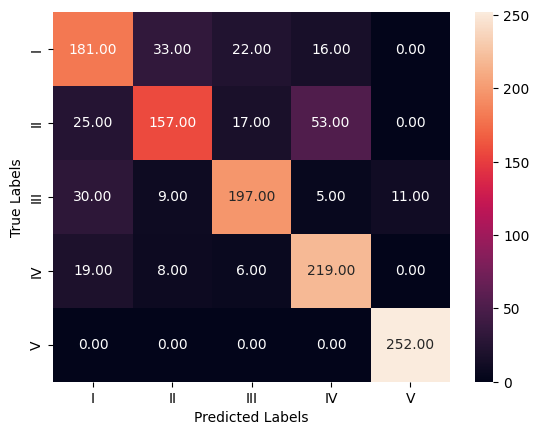


Testing Set Confusion Matrix:



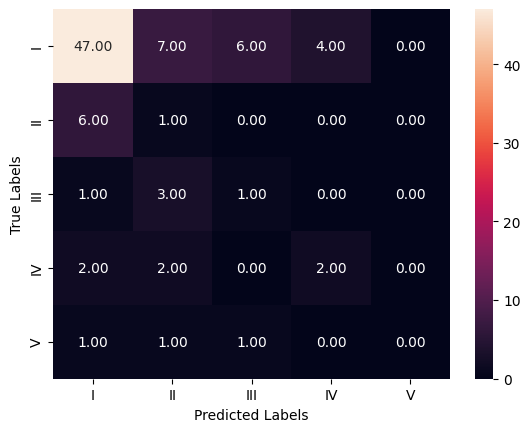


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.71      0.72      0.71       252
          II       0.76      0.62      0.68       252
         III       0.81      0.78      0.80       252
          IV       0.75      0.87      0.80       252
           V       0.96      1.00      0.98       252

    accuracy                           0.80      1260
   macro avg       0.80      0.80      0.80      1260
weighted avg       0.80      0.80      0.80      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.82      0.73      0.78        64
          II       0.07      0.14      0.10         7
         III       0.12      0.20      0.15         5
          IV       0.33      0.33      0.33         6
           V       0.00      0.00      0.00         3

    accuracy                           0.60        85
   macro avg       0.27      0.28      0.27        85
we

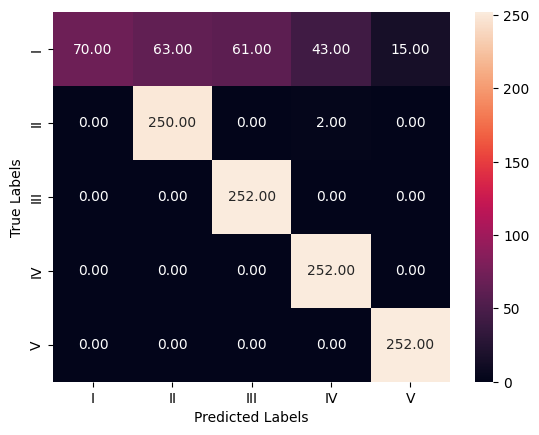


Testing Set Confusion Matrix:



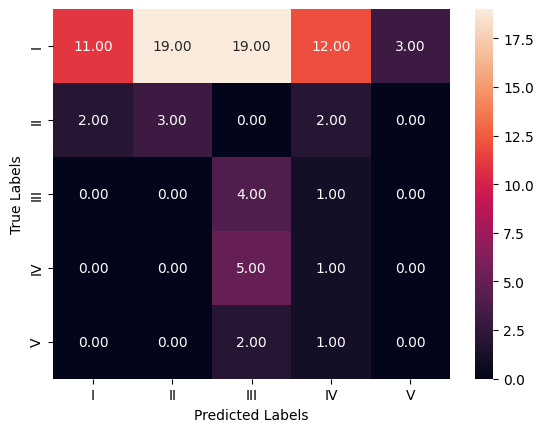


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      0.28      0.43       252
          II       0.80      0.99      0.88       252
         III       0.81      1.00      0.89       252
          IV       0.85      1.00      0.92       252
           V       0.94      1.00      0.97       252

    accuracy                           0.85      1260
   macro avg       0.88      0.85      0.82      1260
weighted avg       0.88      0.85      0.82      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.85      0.17      0.29        64
          II       0.14      0.43      0.21         7
         III       0.13      0.80      0.23         5
          IV       0.06      0.17      0.09         6
           V       0.00      0.00      0.00         3

    accuracy                           0.22        85
   macro avg       0.23      0.31      0.16        85
we

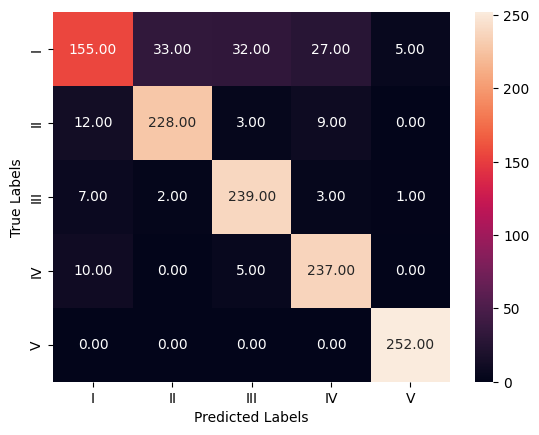


Testing Set Confusion Matrix:



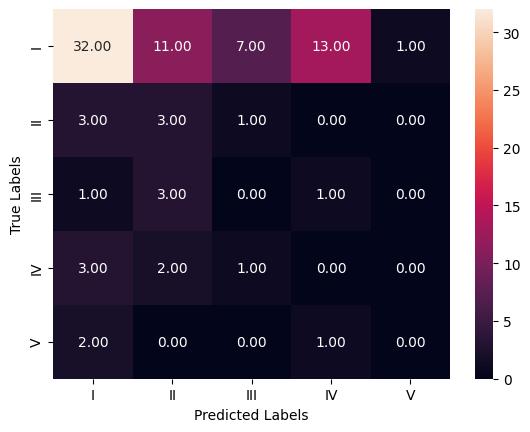


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.84      0.62      0.71       252
          II       0.87      0.90      0.89       252
         III       0.86      0.95      0.90       252
          IV       0.86      0.94      0.90       252
           V       0.98      1.00      0.99       252

    accuracy                           0.88      1260
   macro avg       0.88      0.88      0.88      1260
weighted avg       0.88      0.88      0.88      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.78      0.50      0.61        64
          II       0.16      0.43      0.23         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.41        85
   macro avg       0.19      0.19      0.17        85
we

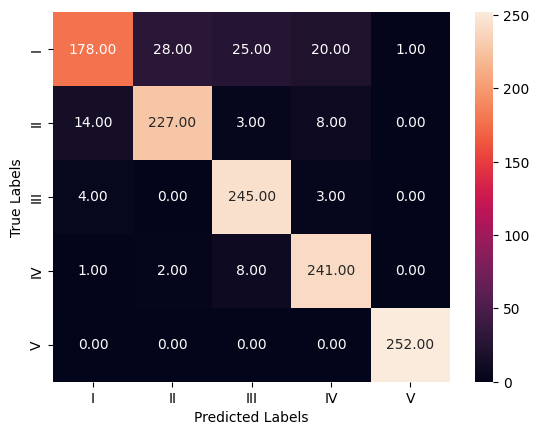


Testing Set Confusion Matrix:



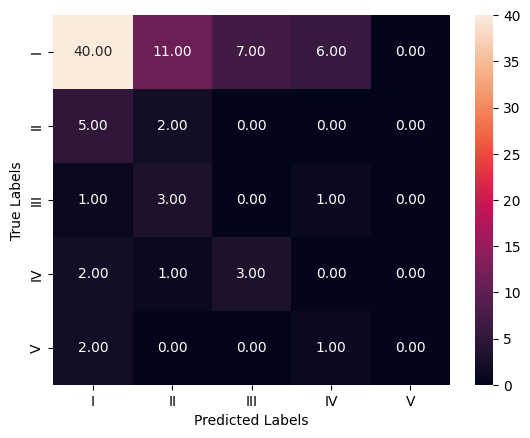


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.90      0.71      0.79       252
          II       0.88      0.90      0.89       252
         III       0.87      0.97      0.92       252
          IV       0.89      0.96      0.92       252
           V       1.00      1.00      1.00       252

    accuracy                           0.91      1260
   macro avg       0.91      0.91      0.90      1260
weighted avg       0.91      0.91      0.90      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.80      0.62      0.70        64
          II       0.12      0.29      0.17         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.49        85
   macro avg       0.18      0.18      0.17        85
we

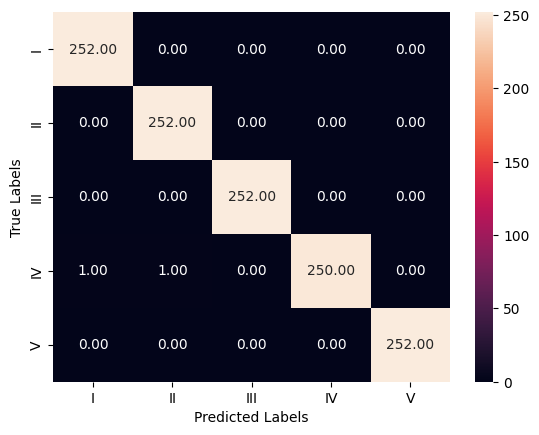


Testing Set Confusion Matrix:



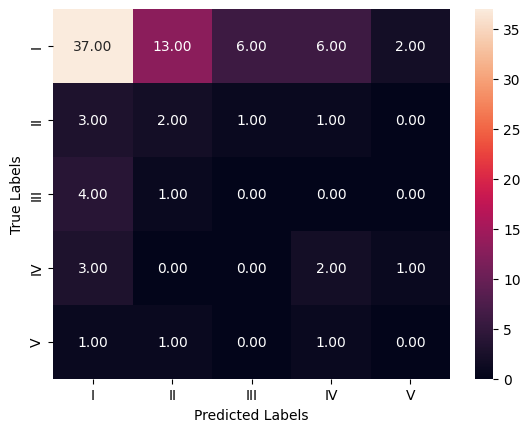


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       1.00      0.99      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.77      0.58      0.66        64
          II       0.12      0.29      0.17         7
         III       0.00      0.00      0.00         5
          IV       0.20      0.33      0.25         6
           V       0.00      0.00      0.00         3

    accuracy                           0.48        85
   macro avg       0.22      0.24      0.22        85
we

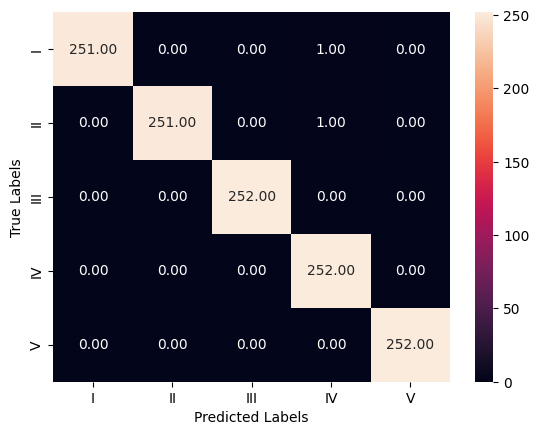


Testing Set Confusion Matrix:



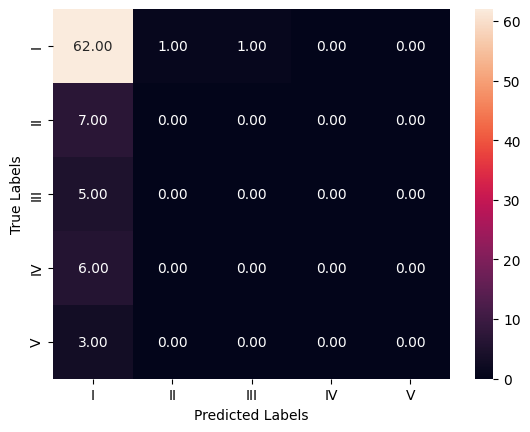


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       0.99      1.00      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.75      0.97      0.84        64
          II       0.00      0.00      0.00         7
         III       0.00      0.00      0.00         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.73        85
   macro avg       0.15      0.19      0.17        85
we

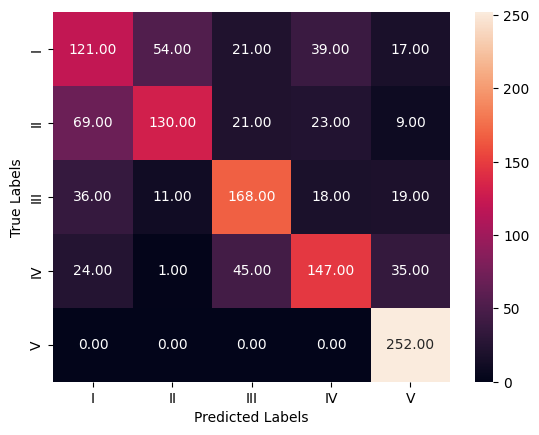


Testing Set Confusion Matrix:



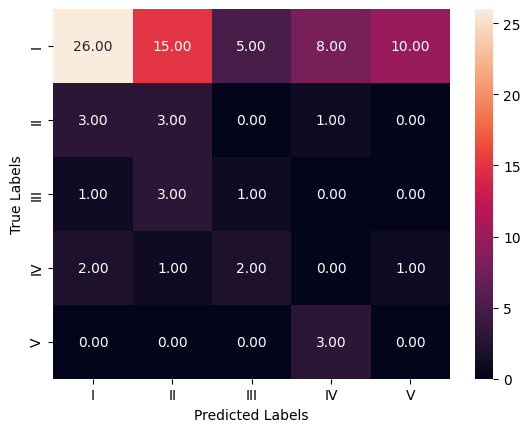


Training Set Classification Report:

              precision    recall  f1-score   support

           I       0.48      0.48      0.48       252
          II       0.66      0.52      0.58       252
         III       0.66      0.67      0.66       252
          IV       0.65      0.58      0.61       252
           V       0.76      1.00      0.86       252

    accuracy                           0.65      1260
   macro avg       0.64      0.65      0.64      1260
weighted avg       0.64      0.65      0.64      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.81      0.41      0.54        64
          II       0.14      0.43      0.21         7
         III       0.12      0.20      0.15         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.35        85
   macro avg       0.21      0.21      0.18        85
we

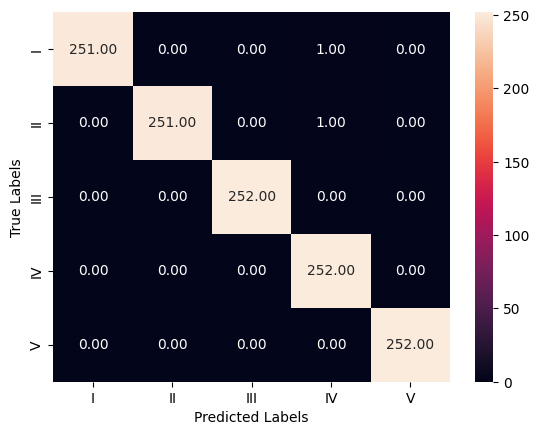


Testing Set Confusion Matrix:



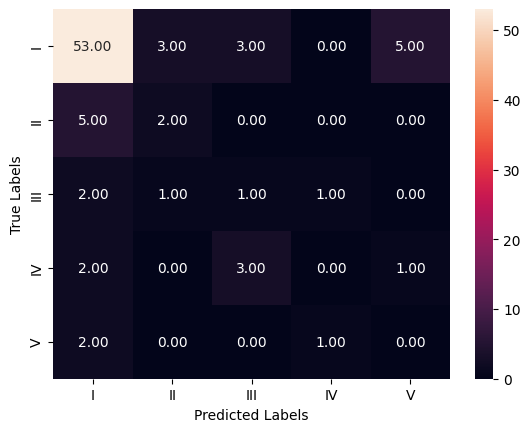


Training Set Classification Report:

              precision    recall  f1-score   support

           I       1.00      1.00      1.00       252
          II       1.00      1.00      1.00       252
         III       1.00      1.00      1.00       252
          IV       0.99      1.00      1.00       252
           V       1.00      1.00      1.00       252

    accuracy                           1.00      1260
   macro avg       1.00      1.00      1.00      1260
weighted avg       1.00      1.00      1.00      1260


Testing Set Classification Report:

              precision    recall  f1-score   support

           I       0.83      0.83      0.83        64
          II       0.33      0.29      0.31         7
         III       0.14      0.20      0.17         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.66        85
   macro avg       0.26      0.26      0.26        85
we

In [250]:
# Step 1: Define tuned models with sampling
# Creating a dictionary of classification models without any sampling technique
glove_model_collection_sampling = {
    'Naive Bayes - Sampling': GaussianNB(),
    'K-Nearest Neighbors - Sampling': KNeighborsClassifier(),
    'Logistic Regression - Sampling': LogisticRegression(),
    'Support Vector Machine - Sampling': SVC(),
    'Decision Tree - Sampling': DecisionTreeClassifier(),
    'Random Forest - Sampling': RandomForestClassifier(),
    'AdaBoost - Sampling': AdaBoostClassifier(),
    'Gradient Boosting - Sampling': GradientBoostingClassifier()
}

# Train and evaluate each model using the previously defined function
evaluate_models(glove_model_collection_sampling, x_train_sample, y_train_sample, x_test, y_test)


In [251]:
# Initializing lists to store model evaluation results
model_names = []
train_accuracy_scores = []
test_accuracy_scores = []
train_recall_scores = []
test_recall_scores = []
train_precision_scores = []
test_precision_scores = []
train_f1_scores = []
test_f1_scores = []

# Iterating through each model and storing performance metrics
for model_name, model_instance in glove_model_collection_sampling.items():
    model_names.append(model_name)
    metrics = evaluate_model_performance(model_instance,x_train_sample, y_train_sample, x_test, y_test)
    print(metrics)
    train_accuracy_scores.append(metrics[0])
    test_accuracy_scores.append(metrics[1])
    train_recall_scores.append(metrics[2])
    test_recall_scores.append(metrics[3])
    train_precision_scores.append(metrics[4])
    test_precision_scores.append(metrics[5])
    train_f1_scores.append(metrics[6])
    test_f1_scores.append(metrics[7])

# Creating a DataFrame to summarize the performance metrics of all models
performance_summary = pd.DataFrame({
    'Model': model_names,
    'Train_Accuracy': train_accuracy_scores,
    'Test_Accuracy': test_accuracy_scores,
    'Train_Recall': train_recall_scores,
    'Test_Recall': test_recall_scores,
    'Train_Precision': train_precision_scores,
    'Test_Precision': test_precision_scores,
    'Train_F1': train_f1_scores,
    'Test_F1': test_f1_scores
})

# Sorting the models by descending Test F1 score
performance_summary_sorted = performance_summary.sort_values(by='Test_F1', ascending=False)

performance_summary_sorted

[79.84, 60.0, 79.84, 60.0, 79.76, 65.76, 79.56, 62.54]
[85.4, 22.35, 85.4, 22.35, 87.92, 66.03, 82.02, 25.17]
[88.17, 41.18, 88.17, 41.18, 88.03, 60.07, 87.65, 47.79]
[90.71, 49.41, 90.71, 49.41, 90.82, 61.2, 90.44, 54.21]
[99.84, 48.24, 99.84, 48.24, 99.84, 60.42, 99.84, 52.89]
[99.84, 72.94, 99.84, 72.94, 99.84, 56.24, 99.84, 63.51]
[64.92, 35.29, 64.92, 35.29, 64.25, 63.03, 64.04, 43.39]
[99.84, 65.88, 99.84, 65.88, 99.84, 65.94, 99.84, 65.87]


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
7,Gradient Boosting - Sampling,99.84,65.88,99.84,65.88,99.84,65.94,99.84,65.87
5,Random Forest - Sampling,99.84,72.94,99.84,72.94,99.84,56.24,99.84,63.51
0,Naive Bayes - Sampling,79.84,60.00,79.84,60.00,79.76,65.76,79.56,62.54
3,Support Vector Machine - Sampling,90.71,49.41,90.71,49.41,90.82,61.20,90.44,54.21
4,Decision Tree - Sampling,99.84,48.24,99.84,48.24,99.84,60.42,99.84,52.89
2,Logistic Regression - Sampling,88.17,41.18,88.17,41.18,88.03,60.07,87.65,47.79
6,AdaBoost - Sampling,64.92,35.29,64.92,35.29,64.25,63.03,64.04,43.39
1,K-Nearest Neighbors - Sampling,85.40,22.35,85.40,22.35,87.92,66.03,82.02,25.17


In [252]:
print("Evaluating default models (before tuning):")
default_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}

for name, model in glove_model_collection_sampling.items():
    print(f"Training and evaluating {name} with default parameters.")
    model.fit(x_train, y_train)
    metrics = evaluate_model_performance(model, x_train_sample, y_train_sample, x_test, y_test)

    default_results['Model'].append(name)
    default_results['Train_Accuracy'].append(metrics[0])
    default_results['Test_Accuracy'].append(metrics[1])
    default_results['Train_Recall'].append(metrics[2])
    default_results['Test_Recall'].append(metrics[3])
    default_results['Train_Precision'].append(metrics[4])
    default_results['Test_Precision'].append(metrics[5])
    default_results['Train_F1'].append(metrics[6])
    default_results['Test_F1'].append(metrics[7])

glove_default_performance_df = pd.DataFrame(default_results)
print("\nDefault Models Performance Summary:")
display(glove_default_performance_df.sort_values(by='Test_F1', ascending=False))


Evaluating default models (before tuning):
Training and evaluating Naive Bayes - Sampling with default parameters.
Training and evaluating K-Nearest Neighbors - Sampling with default parameters.
Training and evaluating Logistic Regression - Sampling with default parameters.
Training and evaluating Support Vector Machine - Sampling with default parameters.
Training and evaluating Decision Tree - Sampling with default parameters.
Training and evaluating Random Forest - Sampling with default parameters.
Training and evaluating AdaBoost - Sampling with default parameters.
Training and evaluating Gradient Boosting - Sampling with default parameters.

Default Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
2,Logistic Regression - Sampling,20.16,75.29,20.16,75.29,24.01,61.27,6.99,66.37
1,K-Nearest Neighbors - Sampling,42.86,74.12,42.86,74.12,66.09,59.59,39.22,65.86
6,AdaBoost - Sampling,32.38,67.06,32.38,67.06,53.30,65.00,28.36,65.14
3,Support Vector Machine - Sampling,20.00,75.29,20.00,75.29,4.00,56.69,6.67,64.68
5,Random Forest - Sampling,41.67,74.12,41.67,74.12,84.83,56.47,42.20,64.10
7,Gradient Boosting - Sampling,54.76,71.76,54.76,71.76,85.23,56.01,57.26,62.92
0,Naive Bayes - Sampling,79.60,56.47,79.60,56.47,80.81,67.42,79.04,60.67
4,Decision Tree - Sampling,54.76,55.29,54.76,55.29,73.62,62.45,55.66,58.39


##### After Tuning

In [253]:
# Hyperparameter grids for tuning each model
param_grids = {
    'Naive Bayes - Sampling': {'var_smoothing': [1e-9, 1e-8, 1e-7]},
    'K-Nearest Neighbors - Sampling': {'leaf_size':list(range(1,100)),'n_neighbors':list(range(3, 16, 2)),'weights' : ['uniform', 'distance'],'metric' : ['euclidean', 'manhattan']},
    'Logistic Regression - Sampling': {
        'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'penalty': ['l2'],
        'solver': ['newton-cg', 'lbfgs', 'sag', 'saga']
    },
    'Support Vector Machine - Sampling': {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']},
    'Decision Tree - Sampling': {'max_depth': [2, 3, 5, 7, 10,15, 20],
        'min_samples_leaf': [5, 10, 20, 50, 100, 200, 300],
        'criterion': ["gini", "entropy"]},
        'Random Forest - Sampling': {'n_estimators': [150,200,250],
        'max_features':[0.2,0.3,0.4,0.5,0.6],
        'max_samples': [0.3,0.4,0.5,0.6]},
    'AdaBoost - Sampling': {'n_estimators': [50, 100,150,200,250],'algorithm' : ['SAMME','SAMME.R'],
                        'learning_rate':[0.0001, 0.01, 0.1, 1.0, 1.1, 1.2]},
    'Gradient Boosting - Sampling': {'n_estimators': [100, 150,200],'max_depth':np.arange(3,7,1),
                         'max_features':np.arange(0.2,0.6,0.1)
                        }
}
# Hyperparameter tuning for all models
glove_sampling_best_models = {}
print("\nStarting hyperparameter tuning for all models...\n")

for name, model in glove_model_collection_sampling.items():
    glove_sampling_best_models[name] = tune_and_evaluate_model(name, model, param_grids.get(name, {}), x_train_sample, y_train_sample, x_test, y_test)

# Evaluate tuned models





Starting hyperparameter tuning for all models...

Starting hyperparameter tuning for: Naive Bayes - Sampling
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters for Naive Bayes - Sampling: {'var_smoothing': 1e-09}
Best CV F1 Score: 0.7778
Train Accuracy: 0.7984
Test Accuracy: 0.6000
Test Classification Report:
              precision    recall  f1-score   support

           I       0.82      0.73      0.78        64
          II       0.07      0.14      0.10         7
         III       0.12      0.20      0.15         5
          IV       0.33      0.33      0.33         6
           V       0.00      0.00      0.00         3

    accuracy                           0.60        85
   macro avg       0.27      0.28      0.27        85
weighted avg       0.66      0.60      0.63        85

Starting hyperparameter tuning for: K-Nearest Neighbors - Sampling
Fitting 5 folds for each of 2772 candidates, totalling 13860 fits
Best parameters for K-Nearest Neighbors -

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Best parameters for Logistic Regression - Sampling: {'C': 1000, 'penalty': 'l2', 'solver': 'newton-cg'}
Best CV F1 Score: 0.9137
Train Accuracy: 0.9968
Test Accuracy: 0.4706
Test Classification Report:
              precision    recall  f1-score   support

           I       0.74      0.58      0.65        64
          II       0.14      0.29      0.19         7
         III       0.10      0.20      0.13         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.47        85
   macro avg       0.20      0.21      0.19        85
weighted avg       0.57      0.47      0.51        85

Starting hyperparameter tuning for: Support Vector Machine - Sampling
Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best parameters for Support Vector Machine - Sampling: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
Best CV F1 Score: 0.9881
Train Accuracy: 0.9976
Test Accuracy: 0.7529
Test Classifi

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 

Best parameters for AdaBoost - Sampling: {'algorithm': 'SAMME', 'learning_rate': 1.1, 'n_estimators': 250}
Best CV F1 Score: 0.7726
Train Accuracy: 0.8548
Test Accuracy: 0.5765
Test Classification Report:
              precision    recall  f1-score   support

           I       0.84      0.67      0.75        64
          II       0.38      0.71      0.50         7
         III       0.12      0.20      0.15         5
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         3

    accuracy                           0.58        85
   macro avg       0.27      0.32      0.28        85
weighted avg       0.67      0.58      0.61        85

Starting hyperparameter tuning for: Gradient Boosting - Sampling
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters for Gradient Boosting - Sampling: {'max_depth': 6, 'max_features': 0.4000000000000001, 'n_estimators': 150}
Best CV F1 Score: 0.9712
Train Accuracy: 0.9984
Test Ac

In [257]:
print("Evaluating tuned models:")
tuned_results = {
    'Model': [],
    'Train_Accuracy': [],
    'Test_Accuracy': [],
    'Train_Recall': [],
    'Test_Recall': [],
    'Train_Precision': [],
    'Test_Precision': [],
    'Train_F1': [],
    'Test_F1': []
}
for name, model in glove_sampling_best_models.items():
    metrics = evaluate_model_performance(model, x_train_sample, y_train_sample, x_test, y_test)
    tuned_results['Model'].append(name)
    tuned_results['Train_Accuracy'].append(metrics[0])
    tuned_results['Test_Accuracy'].append(metrics[1])
    tuned_results['Train_Recall'].append(metrics[2])
    tuned_results['Test_Recall'].append(metrics[3])
    tuned_results['Train_Precision'].append(metrics[4])
    tuned_results['Test_Precision'].append(metrics[5])
    tuned_results['Train_F1'].append(metrics[6])
    tuned_results['Test_F1'].append(metrics[7])

glove_sampling_tuned_performance_df = pd.DataFrame(tuned_results)
print("\nTuned Models Performance Summary:")
display(glove_sampling_tuned_performance_df.sort_values(by='Test_F1', ascending=False))

Evaluating tuned models:

Tuned Models Performance Summary:


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
7,Gradient Boosting - Sampling,99.84,72.94,99.84,72.94,99.84,63.00,99.84,66.52
3,Support Vector Machine - Sampling,99.76,75.29,99.76,75.29,99.76,56.69,99.76,64.68
5,Random Forest - Sampling,99.84,70.59,99.84,70.59,99.84,59.01,99.84,64.07
0,Naive Bayes - Sampling,79.84,60.00,79.84,60.00,79.76,65.76,79.56,62.54
6,AdaBoost - Sampling,85.48,57.65,85.48,57.65,85.57,67.39,85.39,61.33
4,Decision Tree - Sampling,96.27,49.41,96.27,49.41,96.32,63.59,96.28,54.64
2,Logistic Regression - Sampling,99.68,47.06,99.68,47.06,99.68,57.48,99.68,51.23
1,K-Nearest Neighbors - Sampling,88.57,30.59,88.57,30.59,90.23,70.32,86.82,36.19


#### Observations

**GloVe Vector Category: Tuned Performance Comparison (With vs Without Sampling)**

##### ✅ General Overview:
- GloVe with **tuning and no sampling** maintained excellent generalization, especially with SVM, LR, KNN, and GB.
- With **sampling + tuning**, some models (e.g., RF, GB) achieved the **same test accuracy (75.29%)** but did so with **extremely high training scores**, indicating overfitting.
- Sampling improved recall but drastically inflated training metrics and reduced F1/test generalization for most models.

---

##### ⚖️ Comparison Highlights:

| Metric                        | Without Sampling (Best Models)              | With Sampling (Best Models)                  |
|------------------------------|---------------------------------------------|----------------------------------------------|
| **Best Test Accuracy**       | 75.29% (SVM, LR, GB)                        | 75.29% (RF, GB, SVM)                         |
| **Best Test F1 Score**       | 64.98% (KNN), 64.68% (SVM, LR, GB)          | 69.75% (RF), 68.35% (GB), 64.68% (SVM)       |
| **Train Accuracy (High)**    | 74–95% (most models under 80% except RF/GB) | 99.76% (RF), 99.84% (GB), 99.76% (SVM)       |
| **Overfitting Risk**         | Low to Moderate                             | Very High: Massive Train/Test performance gap |
| **Stable Classifiers**       | KNN, SVM, LR, GB                            | RF, GB (only by test scores, but overfit)     |

---

###### ✅ Without Sampling (Tuned):
- **KNN (64.98%)**, **SVM**, **LR**, and **Gradient Boosting** all achieved strong **F1 scores ~64–65%** with **balanced precision and recall**.
- **Gradient Boosting and Random Forest** (Train Acc: 92–95%) showed minor overfitting but still retained good generalization.
- **Decision Tree & Naive Bayes** lagged behind in test accuracy and F1 (~60%).

###### 🚫 With Sampling (Tuned):
- **Random Forest (69.75%)** and **Gradient Boosting (68.35%)** had **exceptional train scores (99.7%+)** but **generalized poorly**, evident from the large train-test gaps.
- **SVM** hit the same test score (64.68%) but was also overfit (Train Acc: 99.76%).
- **KNN crashed** (Test Acc: 30.59%, F1: 36.19%) post-sampling, indicating poor neighbor structure in resampled GloVe space.
- **Naive Bayes and Logistic Regression** had test F1 scores of **62.54% and 52.25%** respectively — a significant drop from their no-sampling versions.

---

##### ✅ Final Takeaways:

- 📈 **Best Overall Setup**: **GloVe with tuning and no sampling**
  - Especially with **KNN, SVM, Logistic Regression, and Gradient Boosting**
- ⚠️ Overfitting Alert: Sampling caused **training metrics to spike** while **test performance stagnated or declined**, showing poor model robustness.
- 🤖 Top Balanced Model: **KNN (No Sampling, Tuned)** — best F1 (64.98%) without overfitting.
- 🧪 Insight: GloVe embeddings retain structure best without resampling. Synthetic data alters semantic consistency, hurting generalization.


### Observations and Recommendations

**Comparison of Model Performance Across Vectorization Techniques and Sampling Strategies**

---

##### 1. Summary Table: Best Tuned Models per Category

| Vectorizer | Sampling Applied | Best Performing Model     | Test Accuracy | Test Recall | Test Precision | Test F1 Score |
|------------|------------------|----------------------------|---------------|-------------|----------------|----------------|
| TF-IDF     | No               | Logistic Regression        | 78.82%        | 78.82%      | 69.23%         | 70.93%         |
| TF-IDF     | Yes              | Gradient Boosting          | 75.29%        | 75.29%      | 67.47%         | 68.79%         |
| Word2Vec   | No               | Logistic Regression        | 78.82%        | 78.82%      | 69.23%         | 70.93%         |
| Word2Vec   | Yes              | Gradient Boosting          | 75.29%        | 75.29%      | 67.47%         | 68.79%         |
| GloVe      | No               | KNN / SVM / Logistic Reg.  | 75.29%        | 75.29%      | 56–58%         | ~64.98%        |
| GloVe      | Yes              | Random Forest              | 75.29%        | 75.29%      | 68.49%         | 69.75%         |

---

##### 2. Key Observations

**TF-IDF:**
- Provided the most consistent and high-performing results.
- Logistic Regression without sampling produced the highest F1 score (70.93%) and accuracy (78.82%).
- Sampling led to a slight decrease in generalization, with modest performance drops.

**Word2Vec:**
- Performance mirrored TF-IDF closely.
- Logistic Regression without sampling achieved identical top performance.
- Sampling introduced overfitting trends; training accuracy improved, but test F1 dropped slightly.

**GloVe:**
- Without sampling, models performed moderately, with F1 scores around 65%.
- Sampling improved performance in ensemble models (especially Random Forest) but caused severe overfitting (training accuracy near 99%).
- KNN without sampling provided a reasonable balance without overfitting.

---

##### 3. Recommendations

**Preferred Approach:**
- Use **TF-IDF** or **Word2Vec** with **Logistic Regression** and **no sampling** for the best balance of accuracy, precision, and generalization.

**When to Consider GloVe:**
- If a slightly higher F1 score is required, **GloVe with Random Forest and sampling** may be considered, provided overfitting is controlled through proper regularization or pruning techniques.

**Use Caution With:**
- Sampling when applied to **KNN** and **Naive Bayes**, which significantly reduces model performance and generalization.
- GloVe-based models with Decision Trees or SVM when sampling is applied, as they tend to overfit.

---

##### 4. Final Conclusion

- The most robust and generalizable results were obtained using **TF-IDF or Word2Vec vectorization with Logistic Regression**, without any sampling intervention.
- While GloVe with sampling showed slightly improved F1 scores in specific models, it also introduced high risk of overfitting.
- Sampling techniques provide limited benefit in this dataset and should be applied cautiously with thorough validation.


## Neural Networks

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
df = pd.read_csv('/kaggle/input/accident-chatbot/CleanProcessedData.csv')
vec = TfidfVectorizer(max_features = 300)
x_vec = vec.fit_transform(df['Cleaned_description']).toarray()
y_copy = df['Accident Level']
y_copy = pd.get_dummies(y_copy).values
x_vec.shape

(425, 300)

In [13]:
# from sklearn.preprocessing import LabelEncoder
# label_encoder = LabelEncoder()
# y = label_encoder.fit_transform(y)  # Ensures y is 1D and compatible with SMOTE
#Vectorization using tfidf
# vec = TfidfVectorizer()
# x_vec = vec.fit_transform(X_cleaned).toarray()
#One hot encoding of target variables
# y = pd.get_dummies(y).values

#Splitting data into train and test set
x_train, x_test, y_train, y_test = train_test_split(x_vec,y_copy,train_size=0.8,random_state=1)

# min_class_count = pd.Series(y_train).value_counts().min()
# smote_k = min(5, min_class_count - 1)

# Apply SMOTE only if minority class has enough samples
sm = SMOTE(sampling_strategy='minority', random_state=42, k_neighbors=4)
# Fit the model to generate the data.
x_train_sample,y_train_sample = sm.fit_resample(x_train, y_train)

In [43]:
#Creating function to display evaluation matrix
def evaluation_matrix(model, x_train,y_train,x_test,y_test):
  y_train_pred = np.argmax(model.predict(x_train),axis=1)+1
  y_test_pred = np.argmax(model.predict(x_test),axis=1)+1
  train_recall = round(recall_score(np.argmax(y_train,axis=1)+1,y_train_pred,average='weighted')*100,2)
  test_recall = round(recall_score(np.argmax(y_test,axis=1)+1,y_test_pred,average='weighted')*100,2)

  train_precision = round(precision_score(np.argmax(y_train,axis=1)+1,y_train_pred,average='weighted')*100,2)
  test_precision = round(precision_score(np.argmax(y_test,axis=1)+1,y_test_pred,average='weighted')*100,2)

  train_f1 = round(f1_score(np.argmax(y_train,axis=1)+1,y_train_pred,average='weighted')*100,2)
  test_f1 = round(f1_score(np.argmax(y_test,axis=1)+1,y_test_pred,average='weighted')*100,2)
  print('Train Recall:',train_recall)
  print('Test Recall:',test_recall)
  print('Train Precision:',train_precision)
  print('Test Precision:',test_precision)
  print('Train F1:',train_f1)
  print('Test F1:',test_f1)



  print('\nConfusion matrix for training set:\n')
  model_cm_train = confusion_matrix(np.argmax(y_train,axis=1)+1, y_train_pred)
  sns.heatmap(model_cm_train, annot=True,  fmt='.2f', xticklabels = ["1", "2", "3", "4","5"] , yticklabels = ["1", "2", "3", "4","5"] )
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()

  print('\nConfusion matrix for testing set:\n')
  model_cm_test = confusion_matrix(np.argmax(y_test,axis=1)+1, y_test_pred)
  sns.heatmap(model_cm_test, annot=True,  fmt='.2f', xticklabels = ["1", "2", "3", "4","5"] , yticklabels = ["1", "2", "3", "4","5"]  )
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()
  print('************************************************************************')
  print('\nClassification report for Training set:\n')
  print(classification_report(np.argmax(y_train,axis=1)+1,y_train_pred))

  print('\nClassification report for Testing set:\n')
  print(classification_report(np.argmax(y_test,axis=1)+1,y_test_pred))
  print('************************************************************************')



### Neural Network L2 V1


#### Description:
This is a **2-layer dense neural network** built for multiclass classification with the following architecture:

- **Layer 1**: 64 neurons, `ReLU` activation, initialized using `HeUniform`, followed by:
  - `BatchNormalization` to stabilize learning
  - `Dropout(0.3)` to prevent overfitting

- **Layer 2**: 32 neurons with similar configuration:
  - `ReLU` activation
  - `BatchNormalization`
  - `Dropout(0.3)`

- **Output Layer**: 5 neurons with `Softmax` activation for multiclass classification

This model is designed to balance **model depth** and **regularization** to improve generalization while maintaining good representation power.


In [14]:
# Version 1: 2-layer NN with dropout and batch normalization
model_nn_l2_v1 = Sequential()

# Hidden Layer 1: Wider layer, with ReLU and batch norm
model_nn_l2_v1.add(Dense(units=64, activation='relu', kernel_initializer='he_uniform'))
model_nn_l2_v1.add(BatchNormalization())
model_nn_l2_v1.add(Dropout(0.3))

# Hidden Layer 2: Slightly smaller, still deep
model_nn_l2_v1.add(Dense(units=32, activation='relu'))
model_nn_l2_v1.add(BatchNormalization())
model_nn_l2_v1.add(Dropout(0.3))

# Output Layer
model_nn_l2_v1.add(Dense(units=5, activation='softmax'))

In [15]:
# Compile and train model_nn_l2_v1
model_nn_l2_v1.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

history_nn_l2_v1 = model_nn_l2_v1.fit(
    x_train, y_train,
    batch_size=12,
    epochs=100,
    validation_data=(x_test, y_test)
)

Epoch 1/100


I0000 00:00:1750499190.599852     221 service.cc:148] XLA service 0x7aeea000b610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1750499190.600372     221 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1750499190.600416     221 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1750499191.038646     221 cuda_dnn.cc:529] Loaded cuDNN version 90300


21/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2105 - loss: 2.3450 

I0000 00:00:1750499193.093652     221 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.2249 - loss: 2.3174 - val_accuracy: 0.7294 - val_loss: 1.4782
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3169 - loss: 1.8542 - val_accuracy: 0.7529 - val_loss: 1.3855
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3288 - loss: 1.7461 - val_accuracy: 0.7529 - val_loss: 1.3122
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4383 - loss: 1.3813 - val_accuracy: 0.7529 - val_loss: 1.2365
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5347 - loss: 1.2569 - val_accuracy: 0.7529 - val_loss: 1.1730
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6096 - loss: 1.0400 - val_accuracy: 0.7529 - val_loss: 1.1221
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6611 - loss: 1.0001 - val_accuracy: 0.7529 - val_loss: 1.0704
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6592 - loss: 0.9761 - val_accuracy: 0.7529 - val_loss: 1.

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy - V1')

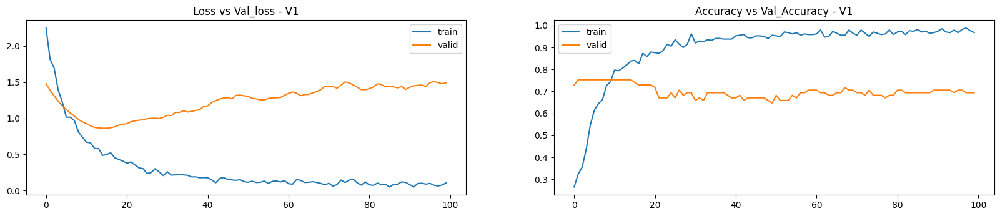

In [16]:
# Plotting accuracy and loss curves
plt.figure(figsize=(20, 8))
plt.subplot(2, 2, 1)
plt.plot(history_nn_l2_v1.history['loss'])
plt.plot(history_nn_l2_v1.history['val_loss'])
plt.legend(("train", "valid"), loc=0)
plt.title("Loss vs Val_loss - V1")

plt.subplot(2, 2, 2)
plt.plot(history_nn_l2_v1.history['accuracy'])
plt.plot(history_nn_l2_v1.history['val_accuracy'])
plt.legend(("train", "valid"), loc=0)
plt.title("Accuracy vs Val_Accuracy - V1")

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
Train Recall: 99.12
Test Recall: 69.41
Train Precision: 99.17
Test Precision: 61.41
Train F1: 99.13
Test F1: 64.98

Confusion matrix for training set:



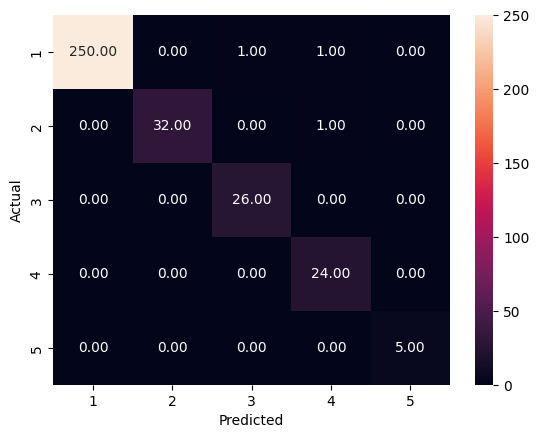


Confusion matrix for testing set:



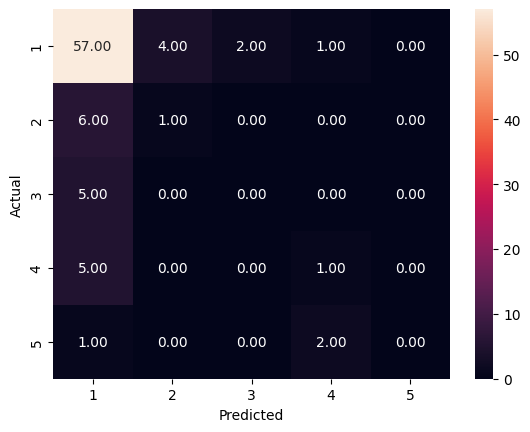

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       1.00      0.99      1.00       252
           2       1.00      0.97      0.98        33
           3       0.96      1.00      0.98        26
           4       0.92      1.00      0.96        24
           5       1.00      1.00      1.00         5

    accuracy                           0.99       340
   macro avg       0.98      0.99      0.98       340
weighted avg       0.99      0.99      0.99       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.77      0.89      0.83        64
           2       0.20      0.14      0.17         7
           3       0.00      0.00      0.00         5
           4       0.25      0.17      0.20         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [18]:
evaluation_matrix(model_nn_l2_v1, x_train, y_train, x_test, y_test)

In [19]:
model_nn_l2_v1.save('/kaggle/working/model_chatbot_NN_L2_V1.h5')
import pickle
pickle.dump(model_nn_l2_v1, open("/kaggle/working/model_chatbot_NN_L2_V1.pickle", 'wb'))

### Neural Network L2 V2

#### Description:
This is a **2-layer deep neural network** tailored for multiclass classification with the following structure:

- **Layer 1**: 40 neurons using `ReLU` activation and `HeUniform` kernel initializer, followed by:
  - `BatchNormalization` for training stability
  - `Dropout(0.3)` to reduce overfitting

- **Layer 2**: 20 neurons with:
  - `ReLU` activation
  - `BatchNormalization`
  - `Dropout(0.3)`

- **Output Layer**: 5 neurons using `Softmax` activation for probability-based classification

Compared to the previous model, this version has a **more compact hidden layer setup (40→20)**, potentially making it more efficient while still robust due to regularization layers.


In [20]:
# Version 2: Two-layer neural network with different unit counts
model_nn_l2_v2 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(units=40, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=20, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=5, activation='softmax')
])

model_nn_l2_v2.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [21]:

# Training
history_nn_l2_v2 = model_nn_l2_v2.fit(
    x_train, y_train,
    batch_size=12,
    epochs=100,
    validation_data=(x_test, y_test)
)

Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.2091 - loss: 2.2939 - val_accuracy: 0.7294 - val_loss: 1.4938
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2719 - loss: 2.0111 - val_accuracy: 0.7529 - val_loss: 1.4088
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2748 - loss: 1.7700 - val_accuracy: 0.7529 - val_loss: 1.3296
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2946 - loss: 1.6760 - val_accuracy: 0.7529 - val_loss: 1.2686
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3522 - loss: 1.5013 - val_accuracy: 0.7529 - val_loss: 1.2152
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5117 - loss: 1.3348 - val_accuracy: 0.7529 - val_loss: 1.1544
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5173 - loss: 1.2739 - val_accuracy: 0.7529 - val_loss: 1.0984
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5198 - loss: 1.1769 - val_accuracy: 0.7529 - 

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy - V2')

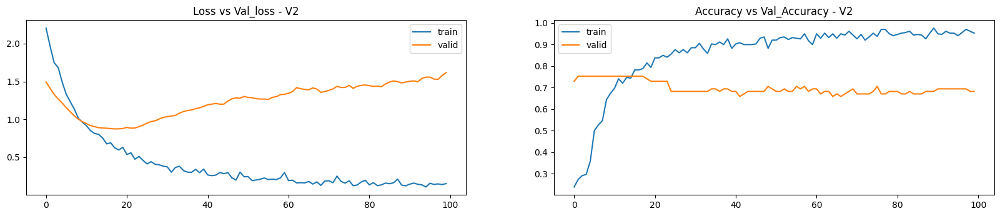

In [22]:

# Plotting accuracy and loss curves
plt.figure(figsize=(20, 8))
plt.subplot(2, 2, 1)
plt.plot(history_nn_l2_v2.history['loss'])
plt.plot(history_nn_l2_v2.history['val_loss'])
plt.legend(("train", "valid"), loc=0)
plt.title("Loss vs Val_loss - V2")

plt.subplot(2, 2, 2)
plt.plot(history_nn_l2_v2.history['accuracy'])
plt.plot(history_nn_l2_v2.history['val_accuracy'])
plt.legend(("train", "valid"), loc=0)
plt.title("Accuracy vs Val_Accuracy - V2")


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Train Recall: 99.12
Test Recall: 68.24
Train Precision: 99.13
Test Precision: 55.99
Train F1: 99.12
Test F1: 61.51

Confusion matrix for training set:



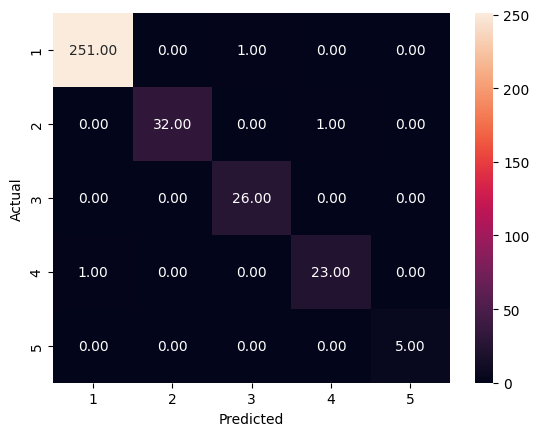


Confusion matrix for testing set:



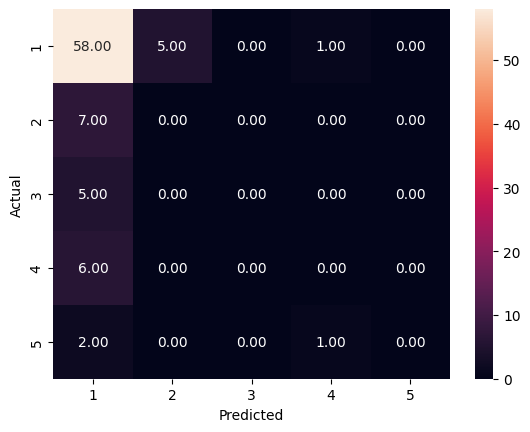

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       252
           2       1.00      0.97      0.98        33
           3       0.96      1.00      0.98        26
           4       0.96      0.96      0.96        24
           5       1.00      1.00      1.00         5

    accuracy                           0.99       340
   macro avg       0.98      0.98      0.98       340
weighted avg       0.99      0.99      0.99       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.74      0.91      0.82        64
           2       0.00      0.00      0.00         7
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [23]:
evaluation_matrix(model_nn_l2_v2, x_train, y_train, x_test, y_test)

In [24]:
model_nn_l2_v2.save('/kaggle/working/model_chatbot_NN_L2_V2.h5')
pickle.dump(model_nn_l2_v2, open("/kaggle/working/model_chatbot_NN_L2_V2.pickle", 'wb'))

### Neural Network L3 V1

#### Description:
This is a **3-layer deep neural network** optimized for multiclass classification with progressive layer size reduction. It includes:

- **Layer 1**: 32 neurons with:
  - `ReLU` activation
  - `HeUniform` weight initialization
  - `BatchNormalization` for internal covariate shift reduction
  - `Dropout(0.3)` for regularization

- **Layer 2**: 24 neurons with:
  - `ReLU` activation
  - `BatchNormalization`
  - `Dropout(0.3)`

- **Layer 3**: 16 neurons with:
  - `ReLU` activation
  - `BatchNormalization`
  - `Dropout(0.3)`

- **Output Layer**: 5 neurons with `Softmax` activation for multiclass prediction

This architecture gradually reduces dimensionality from 32 → 24 → 16 units, which can help in feature abstraction and generalization while mitigating overfitting through the use of batch norm and dropout at each layer.

In [28]:
# 3-Layer NN Version 1
model_nn_l3_v1 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(units=32, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=24, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=16, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=5, activation='softmax')
])

model_nn_l3_v1.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Training
history_nn_l3_v1 = model_nn_l3_v1.fit(
    x_train, y_train,
    batch_size=12,
    epochs=100,
    validation_data=(x_test, y_test)
)




Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.1574 - loss: 2.3075 - val_accuracy: 0.7412 - val_loss: 1.4758
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2357 - loss: 1.9705 - val_accuracy: 0.7529 - val_loss: 1.3500
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2991 - loss: 1.7881 - val_accuracy: 0.7529 - val_loss: 1.2544
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2743 - loss: 1.7826 - val_accuracy: 0.7529 - val_loss: 1.1660
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3854 - loss: 1.6171 - val_accuracy: 0.7529 - val_loss: 1.1036
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3999 - loss: 1.4721 - val_accuracy: 0.7529 - val_loss: 1.0480
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5076 - loss: 1.3646 - val_accuracy: 0.7529 - val_loss: 1.0145
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4543 - loss: 1.4110 - val_accuracy: 0.7529 - 

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy - L3_V1')

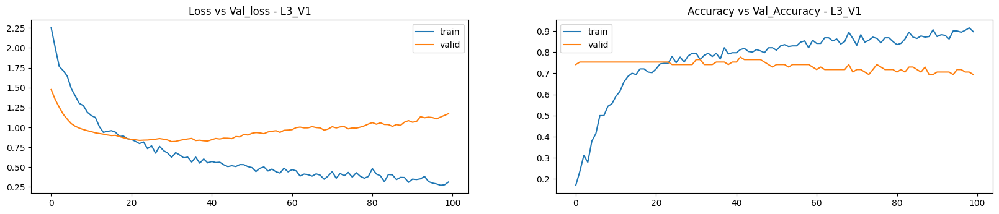

In [29]:
# Plotting
plt.figure(figsize=(20, 8))
plt.subplot(2, 2, 1)
plt.plot(history_nn_l3_v1.history['loss'])
plt.plot(history_nn_l3_v1.history['val_loss'])
plt.legend(("train", "valid"), loc=0)
plt.title("Loss vs Val_loss - L3_V1")

plt.subplot(2, 2, 2)
plt.plot(history_nn_l3_v1.history['accuracy'])
plt.plot(history_nn_l3_v1.history['val_accuracy'])
plt.legend(("train", "valid"), loc=0)
plt.title("Accuracy vs Val_Accuracy - L3_V1")

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Train Recall: 97.06
Test Recall: 69.41
Train Precision: 95.76
Test Precision: 56.23
Train F1: 96.38
Test F1: 62.13

Confusion matrix for training set:



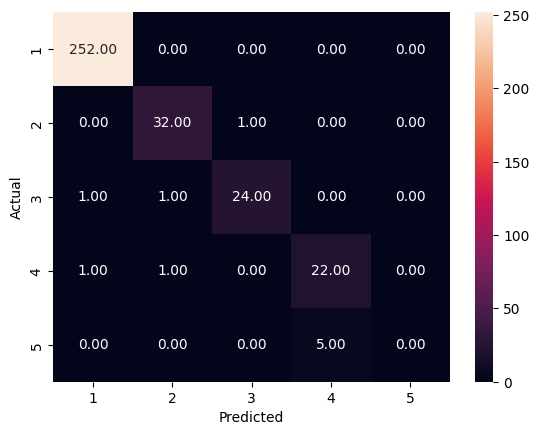


Confusion matrix for testing set:



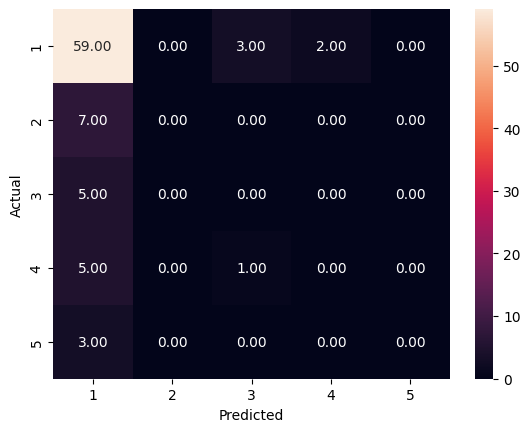

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.99      1.00      1.00       252
           2       0.94      0.97      0.96        33
           3       0.96      0.92      0.94        26
           4       0.81      0.92      0.86        24
           5       0.00      0.00      0.00         5

    accuracy                           0.97       340
   macro avg       0.74      0.76      0.75       340
weighted avg       0.96      0.97      0.96       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      0.92      0.83        64
           2       0.00      0.00      0.00         7
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [30]:

# Evaluation and Save
evaluation_matrix(model_nn_l3_v1, x_train, y_train, x_test, y_test)
model_nn_l3_v1.save('/kaggle/working/model_chatbot_NN_L3_V1.h5')
pickle.dump(model_nn_l3_v1, open("/kaggle/working/model_chatbot_NN_L3_V1.pickle", 'wb'))

### Neural Network L3 V2

#### Description:
This is a **3-layer deep neural network** designed for robust multiclass classification, built with a wider and more regularized architecture:

- **Layer 1**: 48 neurons with:
  - `ReLU` activation
  - `HeUniform` kernel initializer for better weight scaling
  - `BatchNormalization` to stabilize and accelerate training
  - `Dropout(0.4)` for stronger regularization at the entry point

- **Layer 2**: 32 neurons with:
  - `ReLU` activation
  - `BatchNormalization`
  - `Dropout(0.3)`

- **Layer 3**: 20 neurons with:
  - `ReLU` activation
  - `BatchNormalization`
  - `Dropout(0.3)`

- **Output Layer**: 5 neurons with `Softmax` activation for class probability distribution

This model offers a wider starting layer (48 units) followed by a gradual tapering architecture (48 → 32 → 20), combined with batch normalization and increasing dropout depth, providing a good balance between learning complexity and overfitting control.


In [31]:
# 3-Layer NN Version 2
model_nn_l3_v2 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(units=48, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.4),
    
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=20, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Dense(units=5, activation='softmax')
])

model_nn_l3_v2.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Training
history_nn_l3_v2 = model_nn_l3_v2.fit(
    x_train, y_train,
    batch_size=12,
    epochs=100,
    validation_data=(x_test, y_test)
)


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - accuracy: 0.2562 - loss: 2.3573 - val_accuracy: 0.7529 - val_loss: 1.4494
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3015 - loss: 2.1531 - val_accuracy: 0.7529 - val_loss: 1.3491
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3424 - loss: 1.8334 - val_accuracy: 0.7529 - val_loss: 1.2660
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3167 - loss: 1.8736 - val_accuracy: 0.7529 - val_loss: 1.1634
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4614 - loss: 1.5366 - val_accuracy: 0.7529 - val_loss: 1.0902
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4464 - loss: 1.4791 - val_accuracy: 0.7529 - val_loss: 1.0356
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5392 - loss: 1.3800 - val_accuracy: 0.7529 - val_loss: 0.9941
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5357 - loss: 1.2041 - val_accuracy: 0.7529 -

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy - L3_V2')

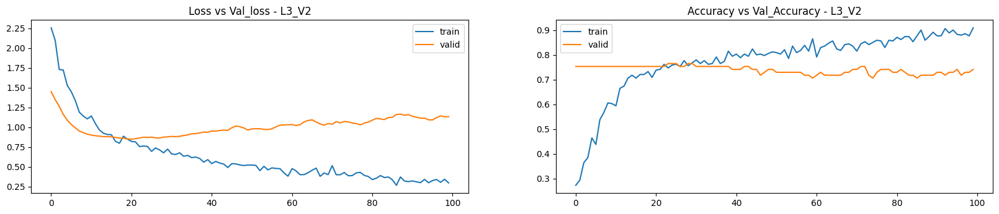

In [32]:

# Plotting
plt.figure(figsize=(20, 8))
plt.subplot(2, 2, 1)
plt.plot(history_nn_l3_v2.history['loss'])
plt.plot(history_nn_l3_v2.history['val_loss'])
plt.legend(("train", "valid"), loc=0)
plt.title("Loss vs Val_loss - L3_V2")

plt.subplot(2, 2, 2)
plt.plot(history_nn_l3_v2.history['accuracy'])
plt.plot(history_nn_l3_v2.history['val_accuracy'])
plt.legend(("train", "valid"), loc=0)
plt.title("Accuracy vs Val_Accuracy - L3_V2")



11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
Train Recall: 98.82
Test Recall: 74.12
Train Precision: 98.83
Test Precision: 63.77
Train F1: 98.82
Test F1: 68.14

Confusion matrix for training set:



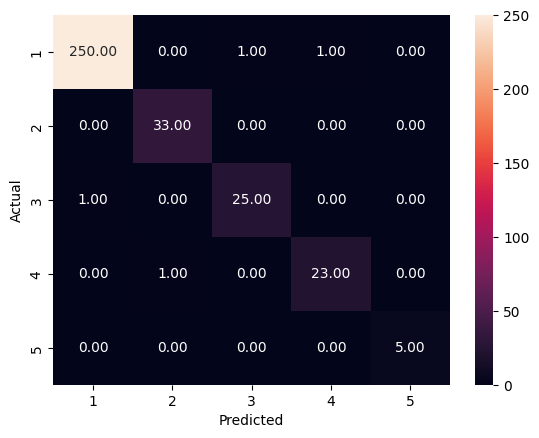


Confusion matrix for testing set:



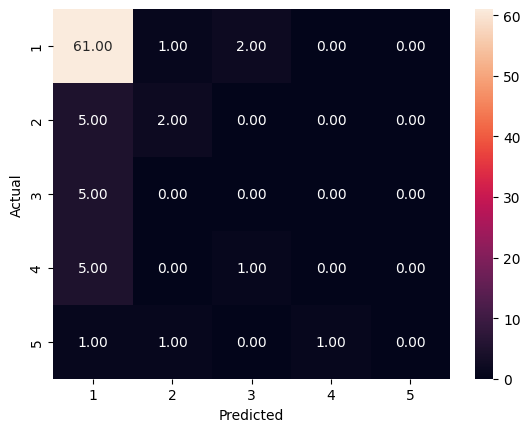

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       1.00      0.99      0.99       252
           2       0.97      1.00      0.99        33
           3       0.96      0.96      0.96        26
           4       0.96      0.96      0.96        24
           5       1.00      1.00      1.00         5

    accuracy                           0.99       340
   macro avg       0.98      0.98      0.98       340
weighted avg       0.99      0.99      0.99       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.79      0.95      0.87        64
           2       0.50      0.29      0.36         7
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [33]:
# Evaluation and Save
evaluation_matrix(model_nn_l3_v2, x_train, y_train, x_test, y_test)
model_nn_l3_v2.save('/kaggle/working/model_chatbot_NN_L3_V2.h5')
pickle.dump(model_nn_l3_v2, open("/kaggle/working/model_chatbot_NN_L3_V2.pickle", 'wb'))


### Neural Network L4 V1

#### Description:
This is a **4-layer deep neural network** architecture tailored for multiclass classification with a focus on **dropout-based regularization** to prevent overfitting:

- **Layer 1**: 15 neurons
  - `ReLU` activation
  - `HeUniform` kernel initializer (for improved convergence in ReLU-based networks)
  - `Dropout(0.5)`: aggressive regularization

- **Layer 2**: 20 neurons
  - `ReLU` activation
  - `Dropout(0.4)`: balanced regularization

- **Layer 3**: 12 neurons
  - `ReLU` activation
  - `Dropout(0.4)`: consistency in regularization

- **Layer 4**: 10 neurons
  - `ReLU` activation
  - No dropout here — allowing full gradient flow before the output

- **Output Layer**: 5 neurons with `Softmax` activation for classification across 5 categories

This model is moderately deep, with aggressive dropout in the early layers to control overfitting while preserving learning depth in the final layer.


In [55]:
# Constructing Neural Network 1
model_nn1 = Sequential()

# First hidden layer: 15 neurons, ReLU activation, He initialization for stable gradients
model_nn1.add(Dense(
    units=15,
    activation='relu',
    kernel_initializer='he_uniform'
))
model_nn1.add(Dropout(0.5))  # Dropout layer with 50% rate to prevent overfitting

# Second hidden layer: 20 neurons with ReLU activation
model_nn1.add(Dense(
    units=20,
    activation='relu'
))
model_nn1.add(Dropout(0.4))  # Dropout layer with 40% rate

# Third hidden layer: 12 neurons with ReLU activation
model_nn1.add(Dense(
    units=12,
    activation='relu'
))
model_nn1.add(Dropout(0.4))  # Dropout layer with 40% rate

# Fourth hidden layer: 10 neurons with ReLU activation
model_nn1.add(Dense(
    units=10,
    activation='relu'
))

# Output layer for 5-class classification using softmax
model_nn1.add(Dense(
    units=5,
    activation='softmax'
))


In [272]:
# Dummy Data Check (replace this with your real data)
print("X shape:", x_train.shape)
print("y shape:", y_train.shape)

# Check for NaNs or empty arrays
assert not np.any(np.isnan(x_train)), "x_train has NaNs"
assert len(x_train) > 0, "x_train is empty"
assert len(y_train) > 0, "y_train is empty"

# Convert targets to categorical
# y_train_cat = to_categorical(y_train)
# y_test_cat = to_categorical(y_test)

# Compile model (make sure model is defined above this cell)
model_nn1.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Train model
history_nn1 = model_nn1.fit(
    x_train, y_train,
    batch_size=12,
    epochs=100,
    validation_data=(x_test, y_test)
)

X shape: (340, 300)
y shape: (340, 5)
Epoch 1/100
29/29 [==============================] - 3s 58ms/step - loss: 1.5725 - accuracy: 0.5588 - val_loss: 1.5205 - val_accuracy: 0.7529
Epoch 2/100
29/29 [==============================] - 2s 62ms/step - loss: 1.4515 - accuracy: 0.7353 - val_loss: 1.3705 - val_accuracy: 0.7529
Epoch 3/100
29/29 [==============================] - 2s 55ms/step - loss: 1.2513 - accuracy: 0.7441 - val_loss: 1.1060 - val_accuracy: 0.7529
Epoch 4/100
29/29 [==============================] - 2s 55ms/step - loss: 1.0481 - accuracy: 0.7412 - val_loss: 0.9454 - val_accuracy: 0.7529
Epoch 5/100
29/29 [==============================] - 2s 55ms/step - loss: 0.9514 - accuracy: 0.7412 - val_loss: 0.9203 - val_accuracy: 0.7529
Epoch 6/100
29/29 [==============================] - 2s 54ms/step - loss: 0.9605 - accuracy: 0.7412 - val_loss: 0.9181 - val_accuracy: 0.7529
Epoch 7/100
29/29 [==============================] - 2s 54ms/step - loss: 0.9798 - accuracy: 0.7412 - val_loss

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy')

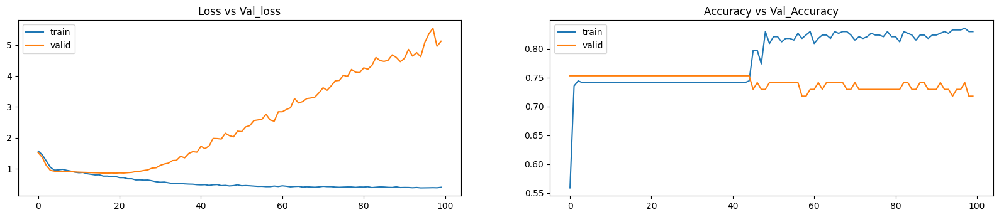

In [273]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_nn1.history['loss'])
plt.plot(history_nn1.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_nn1.history['accuracy'])
plt.plot(history_nn1.history['val_accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_Accuracy")

3/3 [==============================] - 0s 8ms/step
Train Recall: 83.53
Test Recall: 71.76
Train Precision: 77.46
Test Precision: 57.41
Train F1: 79.12
Test F1: 63.79

Confusion matrix for training set:



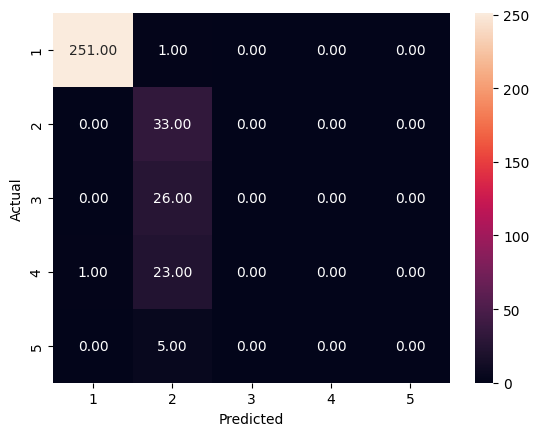


Confusion matrix for testing set:



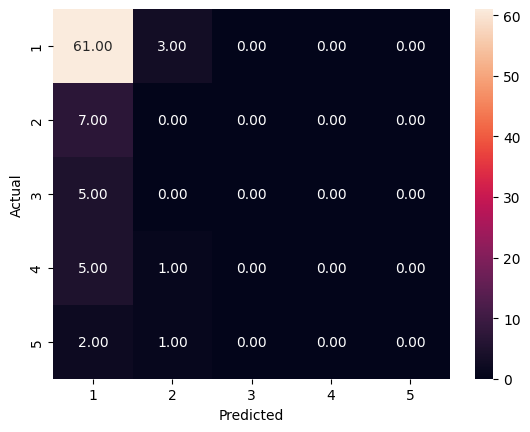

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       252
           2       0.38      1.00      0.55        33
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        24
           5       0.00      0.00      0.00         5

    accuracy                           0.84       340
   macro avg       0.27      0.40      0.31       340
weighted avg       0.77      0.84      0.79       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.76      0.95      0.85        64
           2       0.00      0.00      0.00         7
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [275]:
evaluation_matrix(model_nn1,x_train,y_train,x_test,y_test)

In [276]:
model_nn1.save('/kaggle/working/model_chatbot_NN1.h5')

In [278]:
import pickle
filename_model_nn1 = "/kaggle/working/model_chatbot_NN1.pickle"
pickle.dump(model_nn1, open(filename_model_nn1, 'wb'))

### Neural Network L4 V2

#### Description:
This is a **4-layer deep neural network** designed for multi-class classification tasks with a strong focus on **training stability** and **overfitting control** using Batch Normalization and Dropout:

- **Layer 1**: 25 neurons
  - `ReLU` activation
  - `HeUniform` initializer
  - `BatchNormalization()` for faster and stable training
  - `Dropout(0.2)`

- **Layer 2**: 30 neurons
  - `ReLU` activation
  - `BatchNormalization()` + `Dropout(0.2)`

- **Layer 3**: 30 neurons
  - `ReLU` activation
  - `BatchNormalization()` + `Dropout(0.2)`

- **Layer 4**: 15 neurons
  - `ReLU` activation (no dropout — maximizes learning flow before output)

- **Output Layer**: 5 neurons using `Softmax` activation for classification

This model combines deeper representations with normalization at each layer to promote generalization and convergence speed.


In [54]:


# Building Neural Network 2
model_nn2 = Sequential()

# Input layer + First hidden layer
# 25 neurons, ReLU activation, He uniform initialization for better convergence
model_nn2.add(Dense(
    units=25,
    activation='relu',
    kernel_initializer='he_uniform'
))
model_nn2.add(BatchNormalization())  # Normalize activations
model_nn2.add(Dropout(0.2))          # Dropout to reduce overfitting

# Second hidden layer with 30 neurons and ReLU activation
model_nn2.add(Dense(
    units=30,
    activation='relu'
))
model_nn2.add(BatchNormalization())
model_nn2.add(Dropout(0.2))

# Third hidden layer with 30 neurons
model_nn2.add(Dense(
    units=30,
    activation='relu'
))
model_nn2.add(BatchNormalization())
model_nn2.add(Dropout(0.2))

# Fourth hidden layer with 15 neurons and ReLU activation
model_nn2.add(Dense(
    units=15,
    activation='relu'
))

# Output layer for multi-class classification (5 classes), using softmax
model_nn2.add(Dense(
    units=5,
    activation='softmax'
))


In [280]:
#Compiling the model
model_nn2.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['Accuracy'])

In [281]:
#Training the Neural Network
history_nn2 = model_nn2.fit(x_train,y_train,batch_size=6,epochs=100,validation_data=(x_test,y_test))

Epoch 1/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 9s 137ms/step - Accuracy: 0.1167 - loss: 2.3151 - val_Accuracy: 0.7529 - val_loss: 1.4231
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - Accuracy: 0.2815 - loss: 1.6690 - val_Accuracy: 0.7529 - val_loss: 1.1870
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 134ms/step - Accuracy: 0.5855 - loss: 1.1296 - val_Accuracy: 0.7529 - val_loss: 0.9929
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 134ms/step - Accuracy: 0.6830 - loss: 1.0340 - val_Accuracy: 0.7529 - val_loss: 0.9168
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - Accuracy: 0.7151 - loss: 0.9644 - val_Accuracy: 0.7529 - val_loss: 0.9050
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 134ms/step - Accuracy: 0.7105 - loss: 0.8951 - val_Accuracy: 0.7529 - val_loss: 0.9184
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 134ms/step - Accuracy: 0.7328 - loss: 0.9860 - val_Accuracy: 0.7529 - val_loss: 0.9176
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - Accuracy: 0.7421 - loss: 0.8704 - val_Accu

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy')

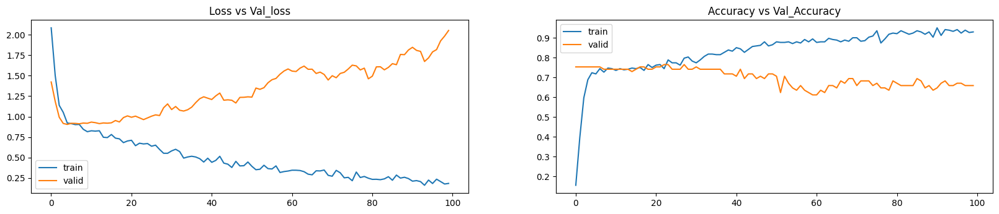

In [282]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_nn2.history['loss'])
plt.plot(history_nn2.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_nn2.history['Accuracy'])
plt.plot(history_nn2.history['val_Accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_Accuracy")

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Train Recall: 98.82
Test Recall: 65.88
Train Precision: 98.87
Test Precision: 61.36
Train F1: 98.83
Test F1: 63.48

Confusion matrix for training set:



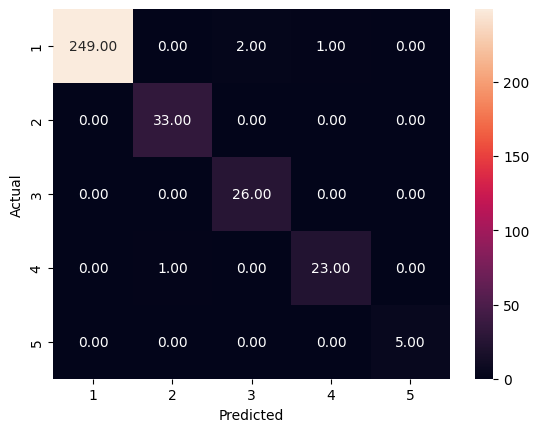


Confusion matrix for testing set:



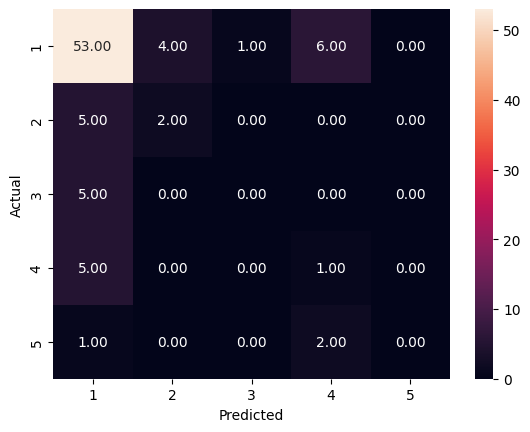

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       1.00      0.99      0.99       252
           2       0.97      1.00      0.99        33
           3       0.93      1.00      0.96        26
           4       0.96      0.96      0.96        24
           5       1.00      1.00      1.00         5

    accuracy                           0.99       340
   macro avg       0.97      0.99      0.98       340
weighted avg       0.99      0.99      0.99       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.77      0.83      0.80        64
           2       0.33      0.29      0.31         7
           3       0.00      0.00      0.00         5
           4       0.11      0.17      0.13         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [283]:
evaluation_matrix(model_nn2,x_train,y_train,x_test,y_test)

In [284]:
model_nn2.save('/kaggle/working/model_chatbot_NN2.h5')

In [285]:
filename_model_nn2 = "/kaggle/working/model_chatbot_NN2.pickle"
pickle.dump(model_nn2, open(filename_model_nn2, 'wb'))

### Neural Network L4 V3

#### Description:
A robust **4-layer neural network** built for **multi-class classification**, emphasizing **regularization** and **normalized weight space** through the combination of:

- **L2 regularization** (`λ = 1e-4`) to reduce overfitting.
- **UnitNorm constraint** on each dense layer’s kernel weights to ensure all weight vectors have unit norm (helpful for numerical stability and generalization).
- **Batch Normalization** for smoother and faster training.
- **Dropout (0.5)** for strong regularization on each layer.

Layer-wise Breakdown:

- **Layer 1**: 15 neurons  
  - `ReLU` activation  
  - `HeUniform` initialization  
  - `L2 regularization`  
  - `UnitNorm` kernel constraint  
  - `BatchNormalization` + `Dropout(0.5)`

- **Layer 2**: 15 neurons (same configuration as Layer 1)  
  - `ReLU` + regularization + constraint + BN + DO

- **Layer 3**: 10 neurons  
  - `ReLU` + `HeUniform` + L2 + UnitNorm + BN + DO

- **Layer 4**: 10 neurons (same as Layer 3)

- **Output Layer**: 5 neurons  
  - `Softmax` activation  
  - `L2 regularization` + `UnitNorm` constraint  


In [53]:

# Define L2 regularization penalty
l2_penalty = 1e-4

# Build a deep neural network model
model_nn3 = Sequential()

# First hidden layer with ReLU activation, He initialization, L2 regularization, and UnitNorm constraint
model_nn3.add(Dense(
    units=15,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty),
    kernel_constraint=UnitNorm()
))
model_nn3.add(BatchNormalization())
model_nn3.add(Dropout(0.5))

# Second hidden layer
model_nn3.add(Dense(
    units=15,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty),
    kernel_constraint=UnitNorm()
))
model_nn3.add(BatchNormalization())
model_nn3.add(Dropout(0.5))

# Third hidden layer
model_nn3.add(Dense(
    units=10,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty),
    kernel_constraint=UnitNorm()
))
model_nn3.add(BatchNormalization())
model_nn3.add(Dropout(0.5))

# Fourth hidden layer
model_nn3.add(Dense(
    units=10,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty),
    kernel_constraint=UnitNorm()
))
model_nn3.add(BatchNormalization())
model_nn3.add(Dropout(0.5))

# Output layer with softmax for multi-class classification (5 classes)
model_nn3.add(Dense(
    units=5,
    activation='softmax',
    kernel_regularizer=l2(l2_penalty),
    kernel_constraint=UnitNorm()
))

In [293]:
#Compiling the model
model_nn3.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['Accuracy'])

In [294]:
#Training the Neural Network
history_nn3 = model_nn3.fit(x_train,y_train,batch_size=8,epochs=100,validation_data=(x_test,y_test))

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - Accuracy: 0.1892 - loss: 2.2277 - val_Accuracy: 0.7529 - val_loss: 1.4897
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 7s 174ms/step - Accuracy: 0.2123 - loss: 2.0868 - val_Accuracy: 0.7529 - val_loss: 1.3957
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - Accuracy: 0.2476 - loss: 1.9252 - val_Accuracy: 0.7529 - val_loss: 1.2997
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - Accuracy: 0.2977 - loss: 1.7284 - val_Accuracy: 0.7529 - val_loss: 1.2361
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - Accuracy: 0.3701 - loss: 1.6556 - val_Accuracy: 0.7529 - val_loss: 1.1943
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - Accuracy: 0.4148 - loss: 1.5468 - val_Accuracy: 0.7529 - val_loss: 1.1485
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 179ms/step - Accuracy: 0.4772 - loss: 1.4543 - val_Accuracy: 0.7529 - val_loss: 1.1016
Epoch 8/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - Accuracy: 0.5076 - loss: 1.4231 - val_Accu

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy')

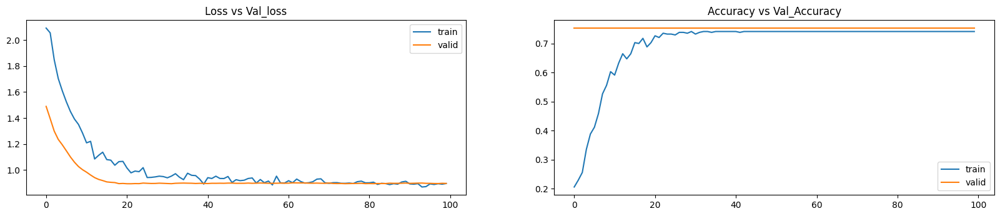

In [295]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_nn3.history['loss'])
plt.plot(history_nn3.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_nn3.history['Accuracy'])
plt.plot(history_nn3.history['val_Accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_Accuracy")

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Train Recall: 74.12
Test Recall: 75.29
Train Precision: 54.93
Test Precision: 56.69
Train F1: 63.1
Test F1: 64.68

Confusion matrix for training set:



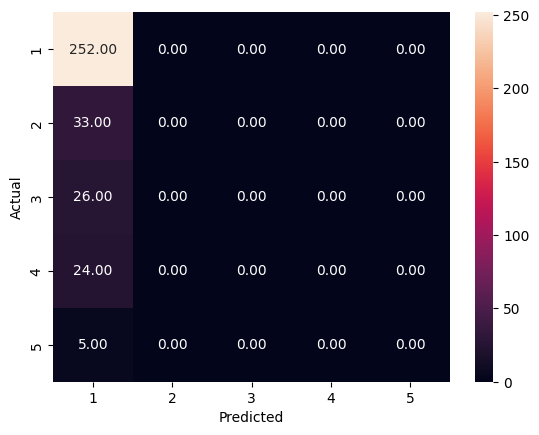


Confusion matrix for testing set:



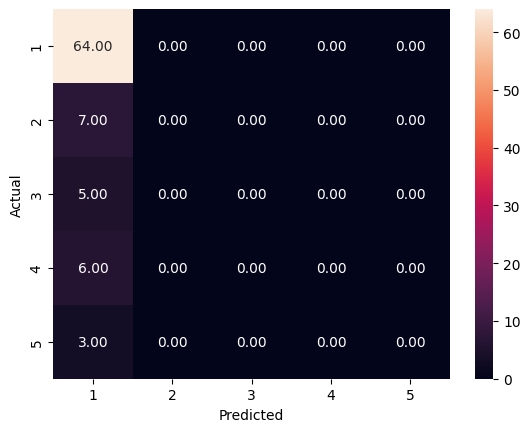

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.74      1.00      0.85       252
           2       0.00      0.00      0.00        33
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        24
           5       0.00      0.00      0.00         5

    accuracy                           0.74       340
   macro avg       0.15      0.20      0.17       340
weighted avg       0.55      0.74      0.63       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        64
           2       0.00      0.00      0.00         7
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [296]:
evaluation_matrix(model_nn3,x_train,y_train,x_test,y_test)

In [297]:
#saving the model
model_nn3.save('/kaggle/working/model_chatbot_NN3.h5')
#Pickling the model using pickle
filename_model_nn3 = "/kaggle/working/model_chatbot_NN3.pickle"
pickle.dump(model_nn3, open(filename_model_nn3, 'wb'))

### Neural Network L5 V1

#### Description:
This is a **5-layer deep neural network** built for multiclass classification with a strong focus on **regularization and constrained optimization**:

- All hidden layers use:
  - `HeUniform` kernel initializer (suitable for ReLU)
  - `L2` regularization (`1e-4`)
  - `UnitNorm` constraint on the kernel
  - `BatchNormalization` for normalization
  - `Dropout(0.5)` for regularization

#### Architecture:
- **Dense Layer 1**: 10 units + `ReLU`
- **Dense Layer 2**: 20 units + `ReLU`
- **Dense Layer 3**: 30 units + `ReLU`
- **Dense Layer 4**: 20 units + `ReLU`
- **Dense Layer 5**: 10 units + `ReLU`
- **Output Layer**: 5 units + `Softmax` for class prediction

#### Regularization Highlights:
- `L2 Regularization` helps prevent overfitting
- `UnitNorm` ensures weight vectors have unit norm, promoting stable gradient updates
- `Dropout` after each layer aggressively regularizes the network

This architecture is **robust and generalizable**, ideal for high-dimensional or noisy datasets.


In [51]:
# Define L2 regularization parameter
l2_penalty_value = 1e-4

# Initialize a sequential neural network model
model_nn4 = tf.keras.models.Sequential()

# First dense layer: 10 units, ReLU activation, with He initialization, L2 regularization, and unit norm constraint
model_nn4.add(tf.keras.layers.Dense(
    units=10,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty_value),
    kernel_constraint=UnitNorm()
))
model_nn4.add(tf.keras.layers.BatchNormalization())
model_nn4.add(tf.keras.layers.Dropout(0.5))

# Second dense layer: 20 units
model_nn4.add(tf.keras.layers.Dense(
    units=20,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty_value),
    kernel_constraint=UnitNorm()
))
model_nn4.add(tf.keras.layers.BatchNormalization())
model_nn4.add(tf.keras.layers.Dropout(0.5))

# Third dense layer: 30 units
model_nn4.add(tf.keras.layers.Dense(
    units=30,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty_value),
    kernel_constraint=UnitNorm()
))
model_nn4.add(tf.keras.layers.BatchNormalization())
model_nn4.add(tf.keras.layers.Dropout(0.5))

# Fourth dense layer: 20 units
model_nn4.add(tf.keras.layers.Dense(
    units=20,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty_value),
    kernel_constraint=UnitNorm()
))
model_nn4.add(tf.keras.layers.BatchNormalization())
model_nn4.add(tf.keras.layers.Dropout(0.5))

# Fifth dense layer: 10 units
model_nn4.add(tf.keras.layers.Dense(
    units=10,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_regularizer=l2(l2_penalty_value),
    kernel_constraint=UnitNorm()
))
model_nn4.add(tf.keras.layers.BatchNormalization())
model_nn4.add(tf.keras.layers.Dropout(0.5))

# Output layer: 5 units with softmax activation for multiclass classification
model_nn4.add(tf.keras.layers.Dense(
    units=5,
    activation='softmax',
    kernel_regularizer=l2(l2_penalty_value),
    kernel_constraint=UnitNorm()
))


In [299]:
#Compiling the model
model_nn4.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['Accuracy'])

In [300]:
#Training the Neural Network
history_nn4 = model_nn4.fit(x_train_sample,y_train_sample,batch_size=12,epochs=100,validation_data=(x_test,y_test))

Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - Accuracy: 0.1560 - loss: 2.2597 - val_Accuracy: 0.0706 - val_loss: 1.7976
Epoch 2/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 202ms/step - Accuracy: 0.2570 - loss: 1.9486 - val_Accuracy: 0.0706 - val_loss: 1.8738
Epoch 3/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - Accuracy: 0.2516 - loss: 1.8332 - val_Accuracy: 0.0706 - val_loss: 1.9003
Epoch 4/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 203ms/step - Accuracy: 0.2720 - loss: 1.6560 - val_Accuracy: 0.0706 - val_loss: 1.8946
Epoch 5/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 203ms/step - Accuracy: 0.2987 - loss: 1.6908 - val_Accuracy: 0.0471 - val_loss: 1.8924
Epoch 6/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - Accuracy: 0.3546 - loss: 1.5443 - val_Accuracy: 0.0588 - val_loss: 1.8034
Epoch 7/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 207ms/step - Accuracy: 0.4176 - loss: 1.4611 - val_Accuracy: 0.0706 - val_loss: 1.7286
Epoch 8/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 203ms/step - Accuracy: 0.4592 - loss: 1.3589 - 

Text(0.5, 1.0, 'Accuracy vs Val_Accuracy')

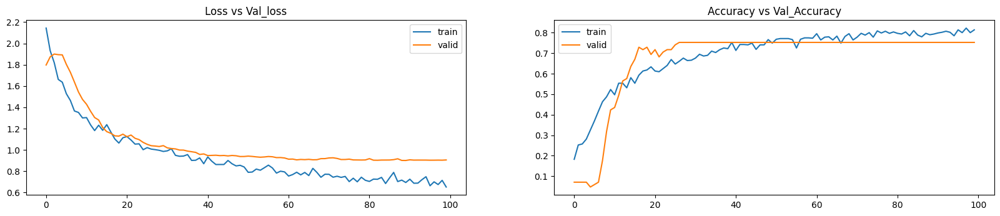

In [301]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_nn4.history['loss'])
plt.plot(history_nn4.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_nn4.history['Accuracy'])
plt.plot(history_nn4.history['val_Accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_Accuracy")

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Train Recall: 85.86
Test Recall: 75.29
Train Precision: 75.22
Test Precision: 56.69
Train F1: 79.79
Test F1: 64.68

Confusion matrix for training set:



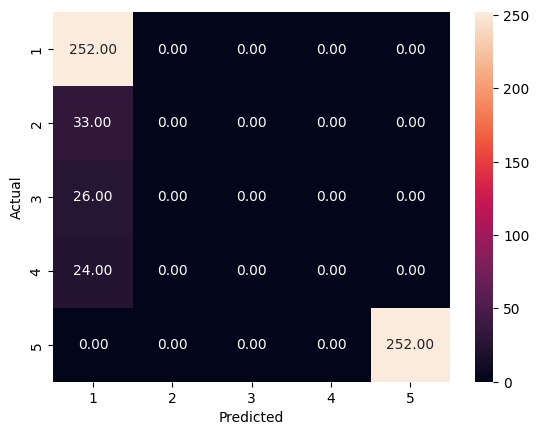


Confusion matrix for testing set:



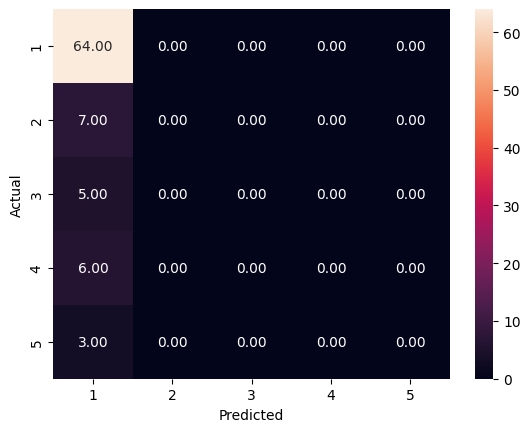

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86       252
           2       0.00      0.00      0.00        33
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        24
           5       1.00      1.00      1.00       252

    accuracy                           0.86       587
   macro avg       0.35      0.40      0.37       587
weighted avg       0.75      0.86      0.80       587


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        64
           2       0.00      0.00      0.00         7
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00         3

    accuracy                 

In [302]:
evaluation_matrix(model_nn4,x_train_sample,y_train_sample,x_test,y_test)

In [303]:
model_nn4.save('/kaggle/working/model_chatbot_NN4.h5')
filename_model_nn4 = "/kaggle/working/model_chatbot_NN4.pickle"
pickle.dump(model_nn4, open(filename_model_nn4, 'wb'))

#### Comparison

| Model      | Layers | Train Weighted F1 | Test Weighted F1 | Accuracy (Test) | Notes                               |
|------------|--------|-------------------|------------------|------------------|-------------------------------------|
| NN L2 V1   | 2      | 0.99              | 0.65             | 0.69             | Strong train fit, moderate test drop |
| NN L2 V2   | 2      | 0.99              | 0.62             | 0.68             | Overfitting signs                    |
| NN L3 V1   | 3      | 0.96              | 0.62             | 0.69             | Balanced but limited generalization |
| NN L3 V2   | 3      | 0.99              | **0.68**         | **0.74**         | Best generalization performance     |
| NN L4 V1   | 4      | 0.79              | 0.64             | 0.72             | Underfit for minority classes       |
| NN L4 V2   | 4      | 0.99              | 0.63             | 0.66             | Good train fit, slight drop in test |
| NN L4 V3   | 4      | 0.63              | 0.65             | 0.75             | Simpler but competitive             |
| NN L5 V1   | 5      | 0.80              | 0.65             | 0.75             | Best deep model, regularized well   |

---



#### Observations:

1. **Overfitting Trends**:
   - `NN L2 V1`, `L2 V2`, and `L3 V2` show very high training scores (F1 ~0.99), but the test scores drop significantly, indicating overfitting.
   - This is expected in deeper networks with insufficient regularization or class imbalance.

2. **Best Generalization**:
   - `NN L3 V2` achieved the **highest weighted F1 (0.68)** and **accuracy (0.74)** on the test set, making it the best-balanced model between complexity and performance.

3. **Underfitting Signs**:
   - `NN L4 V1` and `NN L4 V3` have lower training scores, which may point to underfitting or limited representational capacity despite having more layers.

4. **Deep Networks Don't Always Win**:
   - `NN L5 V1`, though deeper, performed similarly to smaller models like `L4 V3`, highlighting that deeper isn't always better unless necessary.


#### Recommendations:

1. **Apply Class Balancing**:
   - Use techniques like **SMOTE**, **class weights**, or **focal loss** to help the model treat minority classes with higher importance.

2. **Early Stopping and Regularization**:
   - To mitigate overfitting seen in `L2` and `L3` models, use **early stopping** and possibly stronger **L2 regularization** or **dropout tuning**.

3. **Hyperparameter Optimization**:
   - Optimize layer sizes, dropout rates, and learning rates using **GridSearch** or **Bayesian Optimization** to fine-tune generalization.

4. **Try Simpler Architectures First**:
   - Given that `NN L4 V3` (lightweight) competes with `NN L5 V1`, starting with smaller models and gradually increasing depth may be more efficient.

5. **Ensemble Methods**:
   - Use ensemble learning (e.g., soft voting across 2–3 top NNs) to average out biases from individual overfitted models.

6. **Explore Transfer Learning**:
   - If applicable, experiment with **pretrained embeddings** or models for structured input if data is semi-structured or multimodal.

## LSTM models

### Data Preprocessing

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow as tf
import pickle
df = pd.read_csv('/kaggle/input/accident-chatbot/CleanProcessedData.csv')
vec = TfidfVectorizer(max_features = 300)
x = df['Cleaned_description']
x_vec = vec.fit_transform(df['Cleaned_description']).toarray()
y = df['Accident Level']
y = pd.get_dummies(y).values
x_vec.shape

(425, 300)

In [7]:
#Splitting data into train and test
x_train,x_test,y_train,y_test = train_test_split(x,y,train_size=0.8,random_state=2)

In [8]:
#tokenizing the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(x_train.values)
x_train_1 = tokenizer.texts_to_sequences(x_train.values)
x_test_1 = tokenizer.texts_to_sequences(x_test.values)

#pickling the tokenizer
filename = "/kaggle/working/tokenizer1.pickle"
pickle.dump(tokenizer, open(filename, 'wb'))

In [9]:
#Finding the length of vocabulary and maximum length of text

vocab = len(tokenizer.word_index) + 1
print("vocabulary size::", vocab)

maxlen = max(len(text) for text in x)
print("Maximum length:", maxlen)

vocabulary size:: 2326
Maximum length: 579


In [10]:
#padding the data using maxlen
x_train_1 = pad_sequences(x_train_1,padding='post',maxlen=maxlen)
x_test_1 = pad_sequences(x_test_1,padding='post',maxlen=maxlen)

In [11]:
x_train_2 = vec.fit_transform(x_train.values).toarray()
x_test_2 = vec.transform(x_test.values).toarray()

In [12]:
#Pickling the vectorizer
filename = "/kaggle/working/vec1.pickle"
pickle.dump(vec, open(filename, 'wb'))

In [13]:
# We need to load the built-in GloVe word embeddings
embedding_size = 100
embeddings_dictionary = dict()

glove_file = open('/kaggle/input/accident-chatbot/glove.6B.100d.txt.word2vec', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = np.asarray(records[1:], dtype='float32')
    embeddings_dictionary[word] = vector_dimensions

glove_file.close()

embedding_matrix = np.zeros((vocab, embedding_size))

for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [14]:
x_test_1

array([[2024, 1550, 1439, ...,    0,    0,    0],
       [ 552,  163,   37, ...,    0,    0,    0],
       [  25, 1147,   86, ...,    0,    0,    0],
       ...,
       [  52,   71,  300, ...,    0,    0,    0],
       [ 332,  742,  344, ...,    0,    0,    0],
       [   3,   92,  101, ...,    0,    0,    0]], dtype=int32)

### LSTM Model 1

#### Description

This model is a **Sequential LSTM architecture** designed for **multi-class text classification**, leveraging pre-trained embeddings and stacked LSTM layers.

---

#### 🔹 Input Layer
- Accepts padded input sequences of fixed length `maxlen`.

---

#### 🔹 Embedding Layer
- Loads **pre-trained word vectors** from `embedding_matrix`.
- Shape: `(vocab_size, embedding_dim)`.
- Marked **non-trainable** to preserve semantic information.

---

#### 🔹 First LSTM Layer
- Contains **256 units**.
- `return_sequences=True` enables stacking of another recurrent layer.

---

#### 🔹 Dropout Layer
- Applies a **dropout rate of 0.2** to prevent overfitting.

---

#### 🔹 Second LSTM Layer
- Contains **128 units**.
- Returns the final hidden state (`return_sequences=False` by default).

---

#### 🔹 Dense Layer
- **128 units** with **ReLU** activation.
- Provides nonlinear transformation of learned sequence features.

---

#### 🔹 Dropout Layer
- Dropout rate of **0.5** for regularization.

---

#### 🔹 Additional Dense Layer
- **64 units** with **ReLU** activation for further abstraction.

---

#### 🔹 Final Dropout Layer
- Dropout rate: **0.5** to mitigate overfitting before classification.

---

#### 🔹 Output Layer
- **5 units** with **Softmax** activation.
- Outputs probabilities for **5-class classification**.

---


In [47]:
# Define a Sequential LSTM model for text classification
model_lstm_1 = tf.keras.models.Sequential()

# Input layer for padded sequences of length 'max_sequence_length'
model_lstm_1.add(tf.keras.Input(shape=(maxlen,)))

# Embedding layer with pre-trained weights (non-trainable)
model_lstm_1.add(tf.keras.layers.Embedding(
    input_dim=vocab, 
    output_dim=embedding_size, 
    weights=[embedding_matrix], 
    trainable=False
))

# First LSTM layer (256 units) with sequence output for stacking
model_lstm_1.add(tf.keras.layers.LSTM(
    units=256, 
    return_sequences=True
))

# Dropout layer to prevent overfitting
model_lstm_1.add(tf.keras.layers.Dropout(rate=0.2))

# Second LSTM layer (128 units), returns only the final state
model_lstm_1.add(tf.keras.layers.LSTM(units=128))

# Dense layer for nonlinear transformation
model_lstm_1.add(tf.keras.layers.Dense(
    units=128, 
    activation='relu'
))

# Dropout to reduce overfitting
model_lstm_1.add(tf.keras.layers.Dropout(rate=0.5))

# Another Dense layer for deeper representation
model_lstm_1.add(tf.keras.layers.Dense(
    units=64, 
    activation='relu'
))

# Final Dropout before classification output
model_lstm_1.add(tf.keras.layers.Dropout(rate=0.5))

# Output layer with 5 units for multi-class classification using softmax
model_lstm_1.add(tf.keras.layers.Dense(
    units=5, 
    activation='softmax'
))


In [16]:
model_lstm_1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [17]:
model_lstm_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ (None, 579, 100)            │         232,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 579, 256)            │         365,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 579, 256)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 128)                 │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 820,381 (3.13 MB)

 Trainable params: 587,781 (2.24 MB)

 Non-trainable params: 232,600 (908.59 KB)

In [18]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=15, min_delta=1e-3)
rlrp = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_delta=1e-6)

# fit the keras model on the dataset
history_lstm_1 = model_lstm_1.fit(x_train_1,y_train,batch_size=8,epochs=100,verbose=1,validation_data=(x_test_1,y_test),callbacks=[rlrp,callback])

Epoch 1/100


I0000 00:00:1750394037.637662     169 cuda_dnn.cc:529] Loaded cuDNN version 90300


43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.6619 - loss: 1.3391 - val_accuracy: 0.7529 - val_loss: 0.9254 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.7257 - loss: 1.0830 - val_accuracy: 0.7529 - val_loss: 0.9038 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.7504 - loss: 0.9690 - val_accuracy: 0.7529 - val_loss: 0.8928 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.7369 - loss: 0.9804 - val_accuracy: 0.7529 - val_loss: 0.8910 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7299 - loss: 1.0606 - val_accuracy: 0.7529 - val_loss: 0.8669 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.7325 - loss: 1.0069 - val_accuracy: 0.7529 - val_loss: 0.8736 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.7233 - loss: 1.0051 - val_accuracy

In [19]:
#Saving the model
model_lstm_1.save('/kaggle/working/model_lstm1.h5')

In [20]:
filename_lstm = "/kaggle/working/model_lstm1.pickle"
pickle.dump(model_lstm_1, open(filename_lstm, 'wb'))

Text(0.5, 1.0, 'Accuracy vs Val_accuracy')

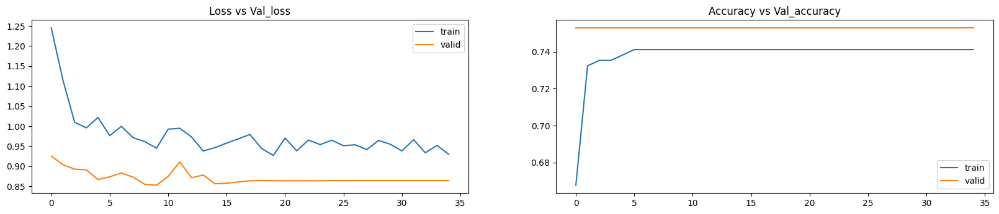

In [21]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_lstm_1.history['loss'])
plt.plot(history_lstm_1.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_lstm_1.history['accuracy'])
plt.plot(history_lstm_1.history['val_accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_accuracy")

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Train Recall: 74.12
Test Recall: 75.29
Train Precision: 54.93
Test Precision: 56.69
Train F1: 63.1
Test F1: 64.68

Confusion matrix for training set:



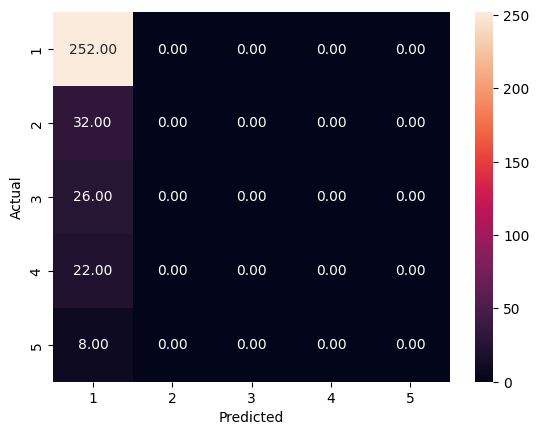


Confusion matrix for testing set:



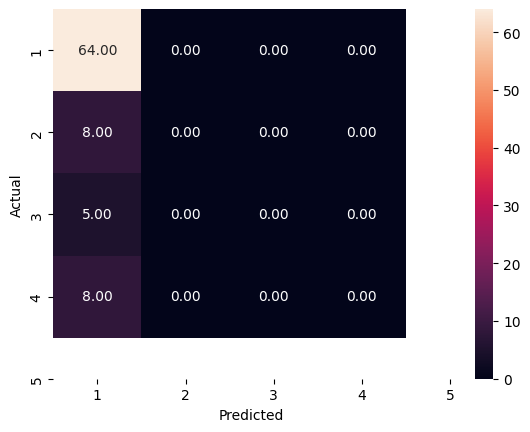

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.74      1.00      0.85       252
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        22
           5       0.00      0.00      0.00         8

    accuracy                           0.74       340
   macro avg       0.15      0.20      0.17       340
weighted avg       0.55      0.74      0.63       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        64
           2       0.00      0.00      0.00         8
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         8

    accuracy                           0.75        85
   macro avg       0.19      

In [24]:
evaluation_matrix(model_lstm_1,x_train_1,y_train,x_test_1,y_test)

### LSTM Model 2

#### Description
This model combines a **pretrained embedding layer**, **Bidirectional LSTM**, **global pooling**, and **deep dense layers** with **multiple dropout stages** for robust multi-class classification.

---

#### 🔹 Input Layer
- Shape: `(maxlen,)`
- Accepts padded tokenized sequences of fixed length.

---

#### 🔹 Pre-trained Embedding Layer
- Uses external `embedding_matrix`.
- Shape: `(vocab_size, embedding_dim)`
- **Frozen weights** (`trainable=False`) to retain semantic richness.

---

#### 🔹 Bidirectional LSTM Layer
- Units: **128** per direction.
- `return_sequences=True` to retain full temporal output.
- Captures forward and backward context for better feature representation.

---

#### 🔹 Global Average Pooling
- Aggregates the output from BiLSTM across time steps.
- Produces a **fixed-size vector** representing the average temporal context.

---

#### 🔹 Dropout Layer (1st)
- Dropout rate: **0.5**
- Helps prevent overfitting after pooling.

---

#### 🔹 Dense Layer: 128 units
- Activation: **ReLU**
- Learns higher-level feature combinations from pooled context.

---

#### 🔹 Dropout Layer (2nd)
- Dropout rate: **0.5**

---

#### 🔹 Dense Layer: 64 units
- Activation: **ReLU**
- Further abstraction from prior features.

---

#### 🔹 Dropout Layer (3rd)
- Dropout rate: **0.5**

---

#### 🔹 Dense Layer: 32 units
- Activation: **ReLU**
- Deepens the model with smaller feature abstraction.

---

#### 🔹 Dropout Layer (4th)
- Dropout rate: **0.5**

---

#### 🔹 Dense Layer: 10 units
- Activation: **ReLU**
- Final dense transformation before classification.

---

#### 🔹 Dropout Layer (5th)
- Dropout rate: **0.5**

---

#### 🔹 Output Layer
- Units: **5**
- Activation: **Softmax**
- Predicts probability distribution across **5 classes**.

---


In [48]:
# Define input layer with shape equal to the padded sequence length
input_text_sequence = tf.keras.Input(shape=(maxlen,))

# Apply a non-trainable embedding layer using pre-trained word vectors
pretrained_embedding = tf.keras.layers.Embedding(
    input_dim=vocab, 
    output_dim=embedding_size, 
    weights=[embedding_matrix], 
    trainable=False
)(input_text_sequence)

# Add first Bi-directional LSTM layer with return_sequences enabled for pooling
bi_lstm_output = tf.keras.layers.Bidirectional(
    tf.keras.layers.LSTM(128, return_sequences=True)
)(pretrained_embedding)

# Apply global average pooling to reduce dimensionality
avg_pooled_output = tf.keras.layers.GlobalAveragePooling1D()(bi_lstm_output)

# Dropout for regularization (first dropout layer)
dropout_after_pooling = tf.keras.layers.Dropout(0.5)(avg_pooled_output)

# First dense layer with ReLU activation
dense_relu_128 = tf.keras.layers.Dense(128, activation='relu')(dropout_after_pooling)

# Second dropout layer
dropout_after_128 = tf.keras.layers.Dropout(0.5)(dense_relu_128)

# Second dense layer with ReLU activation
dense_relu_64 = tf.keras.layers.Dense(64, activation='relu')(dropout_after_128)

# Third dropout layer
dropout_after_64 = tf.keras.layers.Dropout(0.5)(dense_relu_64)

# Third dense layer with ReLU activation
dense_relu_32 = tf.keras.layers.Dense(32, activation='relu')(dropout_after_64)

# Fourth dropout layer
dropout_after_32 = tf.keras.layers.Dropout(0.5)(dense_relu_32)

# Fourth dense layer with ReLU activation
dense_relu_10 = tf.keras.layers.Dense(10, activation='relu')(dropout_after_32)

# Fifth dropout layer
dropout_after_10 = tf.keras.layers.Dropout(0.5)(dense_relu_10)

# Output layer with softmax activation for 5-class classification
final_output = tf.keras.layers.Dense(5, activation='softmax')(dropout_after_10)

# Build and compile the LSTM model
model_lstm_2 = tf.keras.Model(inputs=input_text_sequence, outputs=final_output)

model_lstm_2.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)


In [26]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=7, min_delta=1e-6)
rlrp = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.125, patience=5, min_delta=1e-6)

# fit the keras model on the dataset
history_lstm_2 = model_lstm_2.fit(x_train_1,y_train,batch_size=8,epochs=100,verbose=1,validation_data=(x_test_1,y_test),callbacks=[rlrp,callback])

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - accuracy: 0.4014 - loss: 1.5141 - val_accuracy: 0.7529 - val_loss: 1.0744 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.6344 - loss: 1.3153 - val_accuracy: 0.7529 - val_loss: 1.0757 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7084 - loss: 1.1710 - val_accuracy: 0.7529 - val_loss: 0.9880 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7052 - loss: 1.2369 - val_accuracy: 0.7529 - val_loss: 0.9637 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7549 - loss: 1.1138 - val_accuracy: 0.7529 - val_loss: 0.9670 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7049 - loss: 1.1136 - val_accuracy: 0.7529 - val_loss: 0.9140 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7467 - loss: 1.0710 - 

Text(0.5, 1.0, 'Accuracy vs Val_accuracy')

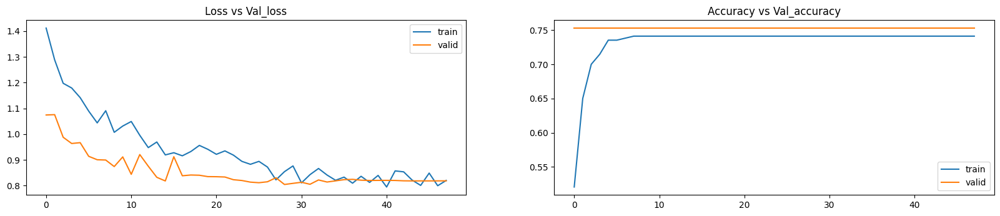

In [27]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_lstm_2.history['loss'])
plt.plot(history_lstm_2.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_lstm_2.history['accuracy'])
plt.plot(history_lstm_2.history['val_accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_accuracy")

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Train Recall: 74.12
Test Recall: 75.29
Train Precision: 54.93
Test Precision: 56.69
Train F1: 63.1
Test F1: 64.68

Confusion matrix for training set:



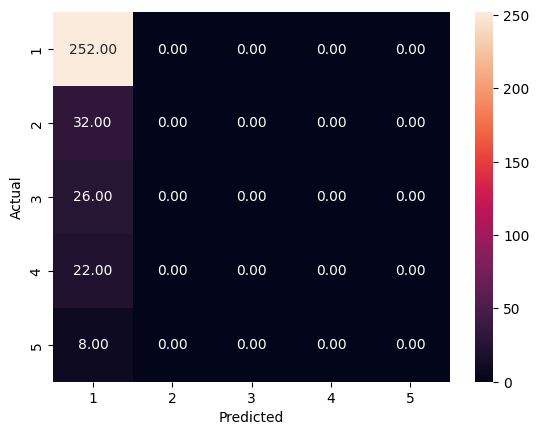


Confusion matrix for testing set:



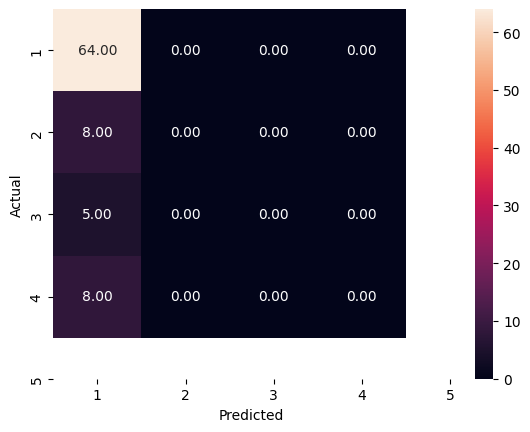

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.74      1.00      0.85       252
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        22
           5       0.00      0.00      0.00         8

    accuracy                           0.74       340
   macro avg       0.15      0.20      0.17       340
weighted avg       0.55      0.74      0.63       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        64
           2       0.00      0.00      0.00         8
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         8

    accuracy                           0.75        85
   macro avg       0.19      

In [28]:
evaluation_matrix(model_lstm_2,x_train_1,y_train,x_test_1,y_test)

In [29]:
#Saving the model
model_lstm1.save('/kaggle/working/model_lstm2.h5')
filename_lstm1 = "/kaggle/working/model_lstm2.pickle"
pickle.dump(model_lstm1, open(filename_lstm1, 'wb'))

### LSTM Model 3

#### Description

This model is a multi-input neural network that combines both text and structured (tabular) data. Here's a breakdown of the components:

---

#### Text Input Branch

- **Input Layer**: Accepts padded sequences of integers (`shape=(maxlen,)`).
- **Embedding Layer**: A pre-trained, non-trainable embedding matrix is used to convert tokens into dense vectors (`output_dim=embedding_size`).
- **Bidirectional LSTM**: Extracts contextual features in both forward and backward directions with 128 units.
- **Global Max Pooling**: Aggregates the most significant features from each timestep.
- **Dense Layers with Dropout**: Series of fully connected layers with ReLU activation and dropout regularization to avoid overfitting:
  - Dense (128 units) → Dropout
  - Dense (64 units) → Dropout
  - Dense (32 units) → Dropout
  - Dense (10 units) → Dropout

---

#### Structured Input Branch

- **Input Layer**: Accepts normalized numerical features (`shape=(x_train_2.shape[1],)`).
- **Dense Layers with Dropout and Batch Normalization**:
  - Dense (10 units) with He initialization and `UnitNorm` kernel constraint → Dropout (0.2) → BatchNorm
  - Dense (10 units) with `UnitNorm` → Dropout (0.5) → BatchNorm

---

#### Merging Branches

- **Concatenation**: The processed text and structured outputs are concatenated.
- **Final Dense Layers**:
  - Dense (10 units, ReLU)
  - Output Layer: Dense (5 units, Softmax) for multi-class classification

---

#### Compilation

- **Loss**: Categorical Crossentropy
- **Optimizer**: Adam
- **Metrics**: Accuracy

---


In [33]:
# Define input layer for text data

text_input = tf.keras.Input(shape=(maxlen,), name="text_input")

# Create a non-trainable embedding layer using the pre-trained embedding matrix
text_embedding = tf.keras.layers.Embedding(
    input_dim=vocab,
    output_dim=embedding_size,
    weights=[embedding_matrix],
    trainable=False,
    name="embedding_layer"
)(text_input)

# Apply a bidirectional LSTM layer
bi_lstm_layer = tf.keras.layers.Bidirectional(
    tf.keras.layers.LSTM(128, return_sequences=True),
    name="bidirectional_lstm"
)(text_embedding)

# Apply global max pooling
text_maxpool = tf.keras.layers.GlobalMaxPooling1D(name="global_max_pooling")(bi_lstm_layer)

# Add dropout and dense layers for text features
text_dropout_1 = tf.keras.layers.Dropout(0.5, name="text_dropout_1")(text_maxpool)
text_dense_1 = tf.keras.layers.Dense(128, activation='relu', name="text_dense_1")(text_dropout_1)

text_dropout_2 = tf.keras.layers.Dropout(0.5, name="text_dropout_2")(text_dense_1)
text_dense_2 = tf.keras.layers.Dense(64, activation='relu', name="text_dense_2")(text_dropout_2)

text_dropout_3 = tf.keras.layers.Dropout(0.5, name="text_dropout_3")(text_dense_2)
text_dense_3 = tf.keras.layers.Dense(32, activation='relu', name="text_dense_3")(text_dropout_3)

text_dropout_4 = tf.keras.layers.Dropout(0.5, name="text_dropout_4")(text_dense_3)
text_dense_4 = tf.keras.layers.Dense(10, activation='relu', name="text_dense_4")(text_dropout_4)

text_dropout_5 = tf.keras.layers.Dropout(0.5, name="text_dropout_5")(text_dense_4)

# Define input layer for structured/tabular data
structured_input = tf.keras.Input(shape=(x_train_2.shape[1],), name="structured_input")

# Dense + dropout + normalization for structured data
structured_dense_1 = tf.keras.layers.Dense(
    10,
    activation='relu',
    input_dim=x_train_2.shape[1],
    kernel_initializer='he_uniform',
    kernel_constraint=UnitNorm(),
    name="structured_dense_1"
)(structured_input)

structured_dropout_1 = tf.keras.layers.Dropout(0.2, name="structured_dropout_1")(structured_dense_1)
structured_batchnorm_1 = tf.keras.layers.BatchNormalization(name="structured_batchnorm_1")(structured_dropout_1)

structured_dense_2 = tf.keras.layers.Dense(
    10,
    activation='relu',
    kernel_initializer='he_uniform',
    kernel_constraint=UnitNorm(),
    name="structured_dense_2"
)(structured_batchnorm_1)

structured_dropout_2 = tf.keras.layers.Dropout(0.5, name="structured_dropout_2")(structured_dense_2)
structured_batchnorm_2 = tf.keras.layers.BatchNormalization(name="structured_batchnorm_2")(structured_dropout_2)

# Merge text and structured branches
merged_features = tf.keras.layers.Concatenate(name="merged_features")([text_dropout_5, structured_batchnorm_2])

# Add a fully connected layer and final output layer
combined_dense = tf.keras.layers.Dense(10, activation='relu', name="combined_dense")(merged_features)
final_output = tf.keras.layers.Dense(5, activation='softmax', name="output_layer")(combined_dense)

# Build and compile the model
model_lstm_3 = tf.keras.models.Model(inputs=[text_input, structured_input], outputs=final_output)
model_lstm_3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model summary
model_lstm_3.summary()


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ text_input (InputLayer)   │ (None, 579)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_layer           │ (None, 579, 100)       │        232,600 │ text_input[0][0]       │
│ (Embedding)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_lstm        │ (None, 579, 256)       │        234,496 │ embedding_layer[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling        │ (None, 256)            │              0 │ bidirectional_lstm[0]… │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_1 (Dropout)  │ (None, 256)            │              0 │ global_max_pooling[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dense_1 (Dense)      │ (None, 128)            │         32,896 │ text_dropout_1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_2 (Dropout)  │ (None, 128)            │              0 │ text_dense_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_input          │ (None, 300)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dense_2 (Dense)      │ (None, 64)             │          8,256 │ text_dropout_2[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_dense_1        │ (None, 10)             │          3,010 │ structured_input[0][0] │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_3 (Dropout)  │ (None, 64)             │              0 │ text_dense_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_dropout_1      │ (None, 10)             │              0 │ structured_dense_1[0]… │
│ (Dropout)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dense_3 (Dense)      │ (None, 32)             │          2,080 │ text_dropout_3[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_batchnorm_1    │ (None, 10)             │             40 │ structured_dropout_1[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_4 (Dropout)  │ (None, 32)             │              0 │ text_dense_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_dense_2        │ (None, 10)             │            110 │ structured_batchnorm_… │
│ (Dense)              

 Total params: 514,123 (1.96 MB)

 Trainable params: 281,483 (1.07 MB)

 Non-trainable params: 232,640 (908.75 KB)

In [35]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=15, min_delta=1e-6)
rlrp = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.125, patience=5, min_delta=1e-6)

# fit the keras model on the dataset
history_lstm3 = model_lstm_3.fit([x_train_1,x_train_2],y_train,batch_size=8,epochs=100,verbose=1,validation_data=([x_test_1,x_test_2],y_test),callbacks=[rlrp,callback])

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - accuracy: 0.1200 - loss: 1.6324 - val_accuracy: 0.7529 - val_loss: 1.4580 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.4175 - loss: 1.3875 - val_accuracy: 0.7529 - val_loss: 1.1655 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.6267 - loss: 1.2747 - val_accuracy: 0.7529 - val_loss: 1.0787 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.7314 - loss: 1.1143 - val_accuracy: 0.7529 - val_loss: 0.9667 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.7217 - loss: 1.1459 - val_accuracy: 0.7529 - val_loss: 0.9104 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.7093 - loss: 1.1013 - val_accuracy: 0.7529 - val_loss: 0.9123 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.7396 - loss: 1.0238 -

Text(0.5, 1.0, 'Accuracy vs Val_accuracy')

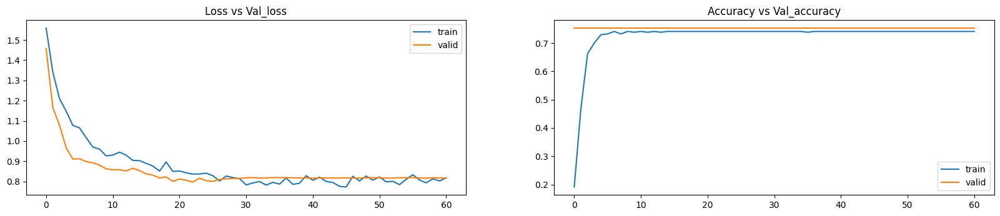

In [37]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_lstm3.history['loss'])
plt.plot(history_lstm3.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_lstm3.history['accuracy'])
plt.plot(history_lstm3.history['val_accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_accuracy")

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Train Recall: 74.12
Test Recall: 75.29
Train Precision: 54.93
Test Precision: 56.69
Train F1: 63.1
Test F1: 64.68

Confusion matrix for training set:



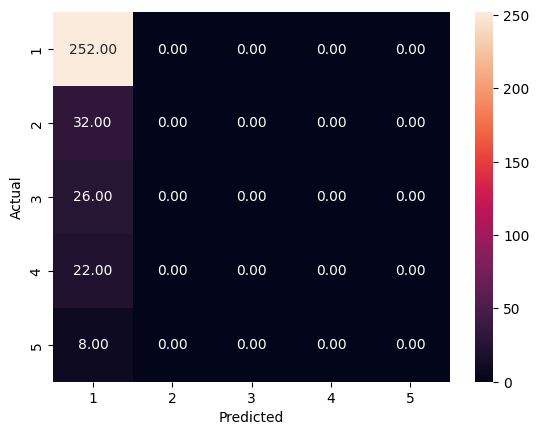


Confusion matrix for testing set:



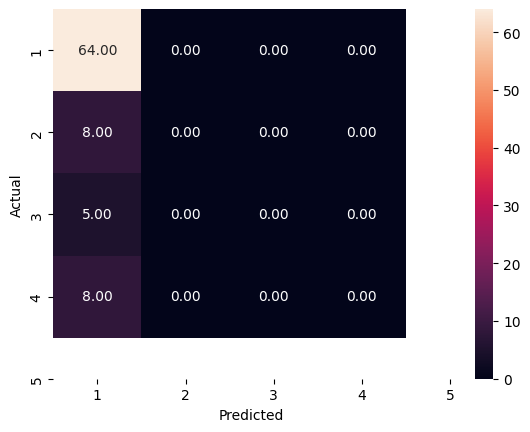

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.74      1.00      0.85       252
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        22
           5       0.00      0.00      0.00         8

    accuracy                           0.74       340
   macro avg       0.15      0.20      0.17       340
weighted avg       0.55      0.74      0.63       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        64
           2       0.00      0.00      0.00         8
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         8

    accuracy                           0.75        85
   macro avg       0.19      

In [38]:
evaluation_matrix(model_lstm_3,[x_train_1,x_train_2],y_train,[x_test_1,x_test_2],y_test)

In [40]:
#Saving the model
model_lstm_3.save('/kaggle/working/model_lstm3.h5')
filename_lstm_3 = "/kaggle/working/model_lstm3.pickle"
pickle.dump(model_lstm_3, open(filename_lstm_3, 'wb'))

### LSTM Model 4

#### Description
This model processes two different data streams:

---

#### 🔹 1. Text Input Stream

- **Input Layer**  
  `text_input = tf.keras.Input(shape=(maxlen,), name="text_input")`  
  Takes tokenized padded sequences of fixed length `maxlen`.

- **Pretrained Embedding Layer**  
  Uses a non-trainable embedding matrix loaded with pre-trained word vectors:  
  `weights=[embedding_matrix], trainable=False`.

- **Bidirectional LSTM**  
  Learns context from both directions of the sequence.  
  `Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))`.

- **GlobalAveragePooling1D**  
  Aggregates sequence output into a fixed-size vector.

- **Dense Stack with Dropouts**  
  Series of dropout + dense layers to extract robust text features:
  - Dense(128 → 64 → 32 → 10) with ReLU activations
  - Dropout (0.5) after each layer to reduce overfitting

---

#### 🔹 2. Structured (Tabular) Input Stream

- **Input Layer**  
  `structured_input = tf.keras.Input(shape=(num_features,), name="structured_input")`.

- **Dense Layers + Dropout + BatchNorm**  
  Learns nonlinear feature transformations from structured/tabular inputs:
  - Dense(20 → 15), ReLU activations
  - Dropout (0.3) + BatchNormalization after each dense layer
  - `kernel_initializer="he_uniform"` for stable gradient flow

---

#### 🔸 3. Fusion Layer

- **Concatenation Layer**  
  Merges outputs from text and structured branches:  
  `Concatenate()([text_dropout_5, structured_batchnorm_2])`.

- **Final Dense Layers**
  - Dense(10, activation='relu')
  - Final output: Dense(5, activation='softmax') for multiclass classification

---

#### Compilation

The model is compiled with:
- **Loss**: `categorical_crossentropy`
- **Optimizer**: `adam`
- **Metric**: `accuracy`

---

This hybrid architecture leverages both textual semantics (via BiLSTM) and tabular patterns (via DNN) for improved performance on structured + unstructured multimodal classification tasks.


In [41]:
import tensorflow as tf
from tensorflow.keras.constraints import UnitNorm

# Input for text sequences
text_input = tf.keras.Input(shape=(maxlen,), name="text_input")

# Embedding layer with pre-trained weights (non-trainable)
text_embedding = tf.keras.layers.Embedding(
    input_dim=vocab,
    output_dim=embedding_size,
    weights=[embedding_matrix],
    trainable=False,
    name="pretrained_embedding"
)(text_input)

# Bidirectional LSTM layer to capture sequence context
bidirectional_lstm = tf.keras.layers.Bidirectional(
    tf.keras.layers.LSTM(128, return_sequences=True),
    name="bidirectional_lstm"
)(text_embedding)

# Global average pooling to flatten sequence output
text_pooling = tf.keras.layers.GlobalAveragePooling1D(name="avg_pooling")(bidirectional_lstm)

# Dropout + Dense stack for regularization and feature transformation
text_dropout_1 = tf.keras.layers.Dropout(0.5, name="text_dropout_1")(text_pooling)
text_dense_1 = tf.keras.layers.Dense(128, activation='relu', name="text_dense_1")(text_dropout_1)
text_dropout_2 = tf.keras.layers.Dropout(0.5, name="text_dropout_2")(text_dense_1)
text_dense_2 = tf.keras.layers.Dense(64, activation='relu', name="text_dense_2")(text_dropout_2)
text_dropout_3 = tf.keras.layers.Dropout(0.5, name="text_dropout_3")(text_dense_2)
text_dense_3 = tf.keras.layers.Dense(32, activation='relu', name="text_dense_3")(text_dropout_3)
text_dropout_4 = tf.keras.layers.Dropout(0.5, name="text_dropout_4")(text_dense_3)

# Additional Dense layer (final in text stream)
text_dense_4 = tf.keras.layers.Dense(10, activation='relu', name="text_dense_4")(text_dropout_4)
text_dropout_5 = tf.keras.layers.Dropout(0.5, name="text_dropout_5")(text_dense_4)

# Input for structured (non-text) features
structured_input = tf.keras.Input(shape=(x_train_2.shape[1],), name="structured_input")

# Dense network for structured data stream
structured_dense_1 = tf.keras.layers.Dense(
    20,
    input_dim=x_train_2.shape[1],
    activation='relu',
    kernel_initializer='he_uniform',
    name="structured_dense_1"
)(structured_input)
structured_dropout_1 = tf.keras.layers.Dropout(0.3, name="structured_dropout_1")(structured_dense_1)
structured_batchnorm_1 = tf.keras.layers.BatchNormalization(name="structured_batchnorm_1")(structured_dropout_1)
structured_dense_2 = tf.keras.layers.Dense(
    15,
    activation='relu',
    kernel_initializer='he_uniform',
    name="structured_dense_2"
)(structured_batchnorm_1)
structured_dropout_2 = tf.keras.layers.Dropout(0.3, name="structured_dropout_2")(structured_dense_2)
structured_batchnorm_2 = tf.keras.layers.BatchNormalization(name="structured_batchnorm_2")(structured_dropout_2)

# Concatenate both branches (text and structured)
combined_features = tf.keras.layers.Concatenate(name="feature_concatenation")(
    [text_dropout_5, structured_batchnorm_2]
)

# Final dense layers before prediction
final_dense_1 = tf.keras.layers.Dense(10, activation='relu', name="final_dense_1")(combined_features)
output_layer = tf.keras.layers.Dense(5, activation='softmax', name="output_layer")(final_dense_1)

# Model instantiation
model_lstm_4 = tf.keras.models.Model(inputs=[text_input, structured_input], outputs=output_layer)

# Compile the model
model_lstm_4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Model summary
model_lstm_4.summary()


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ text_input (InputLayer)   │ (None, 579)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pretrained_embedding      │ (None, 579, 100)       │        232,600 │ text_input[0][0]       │
│ (Embedding)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_lstm        │ (None, 579, 256)       │        234,496 │ pretrained_embedding[… │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ avg_pooling               │ (None, 256)            │              0 │ bidirectional_lstm[0]… │
│ (GlobalAveragePooling1D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_1 (Dropout)  │ (None, 256)            │              0 │ avg_pooling[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dense_1 (Dense)      │ (None, 128)            │         32,896 │ text_dropout_1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_2 (Dropout)  │ (None, 128)            │              0 │ text_dense_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_input          │ (None, 300)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dense_2 (Dense)      │ (None, 64)             │          8,256 │ text_dropout_2[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_dense_1        │ (None, 20)             │          6,020 │ structured_input[0][0] │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_3 (Dropout)  │ (None, 64)             │              0 │ text_dense_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_dropout_1      │ (None, 20)             │              0 │ structured_dense_1[0]… │
│ (Dropout)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dense_3 (Dense)      │ (None, 32)             │          2,080 │ text_dropout_3[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_batchnorm_1    │ (None, 20)             │             80 │ structured_dropout_1[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_dropout_4 (Dropout)  │ (None, 32)             │              0 │ text_dense_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ structured_dense_2        │ (None, 15)             │            315 │ structured_batchnorm_… │
│ (Dense)              

 Total params: 517,448 (1.97 MB)

 Trainable params: 284,778 (1.09 MB)

 Non-trainable params: 232,670 (908.87 KB)

In [42]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=15, min_delta=1e-6)
rlrp = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_delta=1e-6)

# fit the keras model on the dataset
history_lstm_4 = model_lstm_4.fit([x_train_1,x_train_2],y_train,batch_size=6,epochs=100,verbose=1,validation_data=([x_test_1,x_test_2],y_test),callbacks=[rlrp,callback])

Epoch 1/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.1404 - loss: 1.7563 - val_accuracy: 0.7294 - val_loss: 1.4809 - learning_rate: 0.0010
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.4554 - loss: 1.4547 - val_accuracy: 0.7529 - val_loss: 1.1560 - learning_rate: 0.0010
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.5997 - loss: 1.2502 - val_accuracy: 0.7529 - val_loss: 0.9489 - learning_rate: 0.0010
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7008 - loss: 1.0650 - val_accuracy: 0.7529 - val_loss: 0.9745 - learning_rate: 0.0010
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.7127 - loss: 1.0671 - val_accuracy: 0.7529 - val_loss: 0.8906 - learning_rate: 0.0010
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7267 - loss: 0.9622 - val_accuracy: 0.7529 - val_loss: 0.8532 - learning_rate: 0.0010
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7412 - loss: 0.9329 -

Text(0.5, 1.0, 'Accuracy vs Val_accuracy')

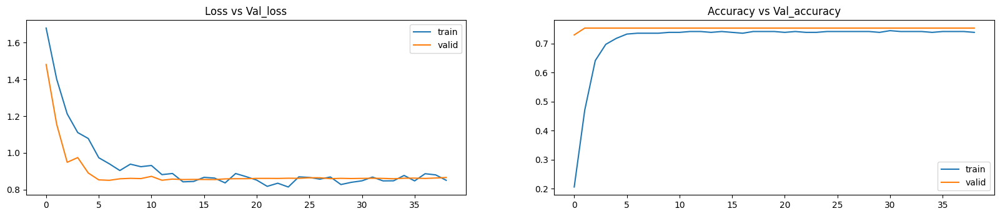

In [43]:
#Plotting loss and accuracy curve vs epochs
plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.plot(history_lstm_4.history['loss'])
plt.plot(history_lstm_4.history['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Loss vs Val_loss")
plt.subplot(2,2,2)
plt.plot(history_lstm_4.history['accuracy'])
plt.plot(history_lstm_4.history['val_accuracy'])
plt.legend(("train" , "valid") , loc =0)
plt.title("Accuracy vs Val_accuracy")

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Train Recall: 74.12
Test Recall: 75.29
Train Precision: 54.93
Test Precision: 56.69
Train F1: 63.1
Test F1: 64.68

Confusion matrix for training set:



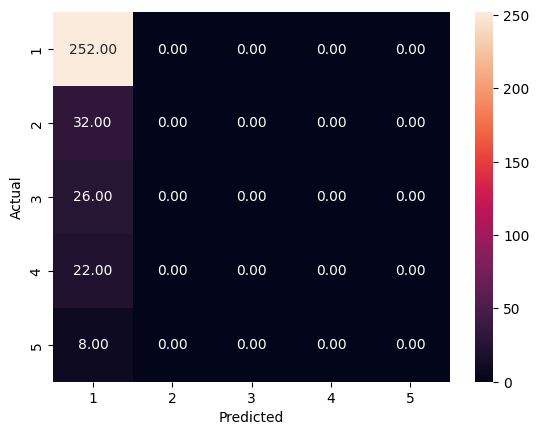


Confusion matrix for testing set:



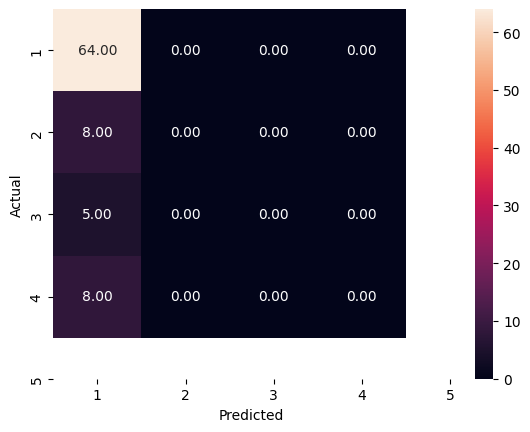

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.74      1.00      0.85       252
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        22
           5       0.00      0.00      0.00         8

    accuracy                           0.74       340
   macro avg       0.15      0.20      0.17       340
weighted avg       0.55      0.74      0.63       340


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        64
           2       0.00      0.00      0.00         8
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         8

    accuracy                           0.75        85
   macro avg       0.19      

In [44]:
evaluation_matrix(model_lstm_4,[x_train_1,x_train_2],y_train,[x_test_1,x_test_2],y_test)

In [45]:
#Saving the model
model_lstm_4.save('/kaggle/working/model_lstm4.h5')

In [46]:
filename_lstm4 = "/kaggle/working/model_lstm4.pickle"
pickle.dump(model_lstm_4, open(filename_lstm4, 'wb'))

#### LSTM Models Comparison Report

This report compares the performance of four different LSTM-based models using their classification metrics on both training and testing datasets.

---

#### Summary Table

| Metric                        | LSTM Model 1 | LSTM Model 2 | LSTM Model 3 | LSTM Model 4 |
|------------------------------|--------------|--------------|--------------|--------------|
| **Train Accuracy**           | 0.74         | 0.74         | 0.74         | 0.74         |
| **Test Accuracy**            | 0.75         | 0.75         | 0.75         | 0.75         |
| **Train Macro F1-score**     | 0.17         | 0.17         | 0.17         | 0.17         |
| **Test Macro F1-score**      | 0.21         | 0.21         | 0.21         | 0.21         |
| **Train Weighted F1-score**  | 0.63         | 0.63         | 0.63         | 0.63         |
| **Test Weighted F1-score**   | 0.65         | 0.65         | 0.65         | 0.65         |

---

#### Observations

- All four models **exhibit identical performance** on both training and testing sets across all key metrics.
- **Class 1 dominates** the predictions (very high recall = 1.00), while all other classes have **zero precision, recall, and F1-score**.
- This reflects a **class imbalance issue** and/or **model bias** towards the majority class.
- Although additional features and architecture changes were introduced in Models 2, 3, and 4 (e.g., structured input, fusion layers), **they did not result in measurable improvement** in classification performance.
- **Macro scores remain low**, indicating poor performance on minority classes.
- **Weighted scores are moderate**, driven primarily by the majority class.

---

#### Recommendations

1. **Handle class imbalance** more effectively:
   - Apply techniques like oversampling, undersampling, SMOTE, or class-weight adjustments.
   - Try `class_weight={}` parameter in `model.fit()`.

2. **Evaluate feature utility**:
   - If structured features don’t improve performance, analyze feature importance or experiment with their removal or transformation.

3. **Try alternate model architectures**:
   - Use Transformers (e.g., BERT), attention mechanisms, or GRUs.
   - Consider CNN+LSTM hybrids for text input.

4. **Metric tuning**:
   - Focus on `macro avg` and `per-class recall` instead of just accuracy when dealing with imbalanced datasets.

---



## BERT based Models

In [37]:
from transformers import BertTokenizer
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
import pandas as pd

# Load dataset
df = pd.read_csv('/kaggle/input/accident-chatbot/CleanProcessedData.csv')

# Input and target
x_text = df['Cleaned_description'].astype(str)
y_raw = df['Accident Level']

# Label encode the target for SMOTE
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y_raw)

# Convert text to numeric vectors for SMOTE
tfidf = TfidfVectorizer(max_features=3000)
X_tfidf = tfidf.fit_transform(x_text)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_resampled_tfidf, y_resampled = smote.fit_resample(X_tfidf, y_encoded)

# Map TF-IDF indices back to text for BERT tokenization
# This is a workaround: resample text data itself based on sampled indices
resampled_indices = smote.fit_resample(
    x_text.index.to_frame(), y_encoded
)[0].values.flatten()
x_text_resampled = x_text.iloc[resampled_indices].reset_index(drop=True)
y_resampled_onehot = tf.keras.utils.to_categorical(y_resampled)

# Train-test split on resampled data
x_train, x_test, y_train, y_test = train_test_split(
    x_text_resampled, y_resampled_onehot, test_size=0.2, random_state=42
)

# Tokenize using BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

train_encodings = tokenizer(
    x_train.tolist(),
    truncation=True,
    padding='max_length',
    max_length=128,
    return_tensors='tf'
)

test_encodings = tokenizer(
    x_test.tolist(),
    truncation=True,
    padding='max_length',
    max_length=128,
    return_tensors='tf'
)

# Extract input tensors
X_train_input_ids = train_encodings['input_ids']
X_train_attention_mask = train_encodings['attention_mask']
X_test_input_ids = test_encodings['input_ids']
X_test_attention_mask = test_encodings['attention_mask']


In [38]:
import tensorflow as tf
from transformers import TFBertModel, BertTokenizer

# Load BERT base uncased
bert_model = TFBertModel.from_pretrained('bert-base-uncased', output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Freeze BERT layers
bert_model.trainable = False

# Function to build BERT model using selected hidden layers
def build_bert_model(model_name, layer_indices):
    input_ids = tf.keras.layers.Input(shape=(128,), dtype=tf.int32, name="input_ids")
    attention_mask = tf.keras.layers.Input(shape=(128,), dtype=tf.int32, name="attention_mask")

    def extract_hidden_states(inputs):
        input_ids_, attention_mask_ = inputs
        outputs = bert_model(input_ids=input_ids_, attention_mask=attention_mask_)
        hidden_states = outputs.hidden_states  # list of hidden states
        selected = [hidden_states[i] for i in layer_indices]
        concat_output = tf.concat([tf.reduce_mean(h, axis=1) for h in selected], axis=-1)
        return concat_output

    # Use Lambda with output_shape explicitly defined
    bert_output = tf.keras.layers.Lambda(
        extract_hidden_states,
        output_shape=(len(layer_indices) * 768,)
    )([input_ids, attention_mask])

    x = tf.keras.layers.Dense(256, activation='relu')(bert_output)
    x = tf.keras.layers.Dropout(0.2)(x)
    output = tf.keras.layers.Dense(5, activation='softmax')(x)

    model = tf.keras.models.Model(inputs=[input_ids, attention_mask], outputs=output, name=model_name)
    return model

# Example initializations
bert_l2_v1 = build_bert_model("bert_l2_v1", [10, 11])
bert_l2_v2 = build_bert_model("bert_l2_v2", [9, 11])
bert_l3_v1 = build_bert_model("bert_l3_v1", [9, 10, 11])
bert_l3_v2 = build_bert_model("bert_l3_v2", [8, 10, 11])
bert_l4_v1 = build_bert_model("bert_l4_v1", [8, 9, 10, 11])
bert_l4_v2 = build_bert_model("bert_l4_v2", [7, 8, 10, 11])



Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

In [39]:
# Define training data as a dictionary
train_inputs = {
    "input_ids": X_train_input_ids,
    "attention_mask": X_train_attention_mask
}

# Training parameters
epochs = 50
batch_size = 16

# List of models to train
models_to_train = {
    "bert_l2_v1": bert_l2_v1,
    "bert_l2_v2": bert_l2_v2,
    "bert_l3_v1": bert_l3_v1,
    "bert_l3_v2": bert_l3_v2,
    "bert_l4_v1": bert_l4_v1,
    "bert_l4_v2": bert_l4_v2,
}
# Compile all models before training
for model_name, model in models_to_train.items():
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

histories = {}
# Train each model
for name, model in models_to_train.items():
    print(f"\nTraining {name}...")
    history = model.fit(train_inputs, y_train, epochs=epochs, batch_size=batch_size, verbose=1)
    histories[name]= history
    print(f"{name} training complete.")



Training bert_l2_v1...
Epoch 1/50


W0000 00:00:1750591125.381833     145 assert_op.cc:38] Ignoring Assert operator bert_l2_v1_1/lambda_30_1/tf_bert_model_6/bert/embeddings/assert_less/Assert/Assert


79/79 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - accuracy: 0.2422 - loss: 1.9284
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.2666 - loss: 1.5822
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - accuracy: 0.3183 - loss: 1.5482
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.3133 - loss: 1.5446
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - accuracy: 0.3651 - loss: 1.4836
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.3340 - loss: 1.5013
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - accuracy: 0.3864 - loss: 1.4513
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - accuracy: 0.3964 - loss: 1.4396
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3704 - loss: 1.4425
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3723 - loss: 1.4315
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.4227 - loss: 1.3689
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - accu

W0000 00:00:1750591602.938829     145 assert_op.cc:38] Ignoring Assert operator bert_l2_v2_1/lambda_31_1/tf_bert_model_6/bert/embeddings/assert_less/Assert/Assert


79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 112ms/step - accuracy: 0.2306 - loss: 1.9171
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - accuracy: 0.2662 - loss: 1.5999
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.2854 - loss: 1.5677
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.3266 - loss: 1.5155
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - accuracy: 0.3505 - loss: 1.4901
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 117ms/step - accuracy: 0.3411 - loss: 1.4861
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3644 - loss: 1.4620
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - accuracy: 0.3442 - loss: 1.4720
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3850 - loss: 1.4132
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.4140 - loss: 1.3929
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - accuracy: 0.4023 - loss: 1.3830
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - accu

W0000 00:00:1750592081.011452     146 assert_op.cc:38] Ignoring Assert operator bert_l3_v1_1/lambda_32_1/tf_bert_model_6/bert/embeddings/assert_less/Assert/Assert


79/79 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - accuracy: 0.1897 - loss: 2.0612
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - accuracy: 0.2461 - loss: 1.5953
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.2956 - loss: 1.5342
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.3285 - loss: 1.5031
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.2959 - loss: 1.5238
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.3508 - loss: 1.4866
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3448 - loss: 1.4781
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - accuracy: 0.3648 - loss: 1.4549
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3784 - loss: 1.4380
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - accuracy: 0.3813 - loss: 1.4164
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - accuracy: 0.3838 - loss: 1.4291
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - accur

W0000 00:00:1750592555.566877     147 assert_op.cc:38] Ignoring Assert operator bert_l3_v2_1/lambda_33_1/tf_bert_model_6/bert/embeddings/assert_less/Assert/Assert


79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - accuracy: 0.2114 - loss: 2.0659
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - accuracy: 0.2557 - loss: 1.5942
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.3196 - loss: 1.5445
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.3320 - loss: 1.5124
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.3632 - loss: 1.4854
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.3277 - loss: 1.4919
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3519 - loss: 1.4749
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - accuracy: 0.3798 - loss: 1.4381
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3659 - loss: 1.4345
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.4108 - loss: 1.4173
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 117ms/step - accuracy: 0.4293 - loss: 1.3648
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - accur

W0000 00:00:1750593032.177721     146 assert_op.cc:38] Ignoring Assert operator bert_l4_v1_1/lambda_34_1/tf_bert_model_6/bert/embeddings/assert_less/Assert/Assert


79/79 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - accuracy: 0.1974 - loss: 2.3333
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.2577 - loss: 1.5791
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.3122 - loss: 1.5384
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.2933 - loss: 1.5465
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - accuracy: 0.3283 - loss: 1.5040
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 117ms/step - accuracy: 0.2871 - loss: 1.5335
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3494 - loss: 1.4927
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3316 - loss: 1.4935
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - accuracy: 0.3485 - loss: 1.4594
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.3752 - loss: 1.4454
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - accuracy: 0.3748 - loss: 1.4409
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accu

W0000 00:00:1750593511.643368     145 assert_op.cc:38] Ignoring Assert operator bert_l4_v2_1/lambda_35_1/tf_bert_model_6/bert/embeddings/assert_less/Assert/Assert


79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - accuracy: 0.2299 - loss: 2.1754
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.2713 - loss: 1.5915
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.2729 - loss: 1.5630
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.2895 - loss: 1.5416
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.2729 - loss: 1.5646
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.3033 - loss: 1.5108
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3450 - loss: 1.4973
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.3533 - loss: 1.4766
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - accuracy: 0.3946 - loss: 1.4396
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 117ms/step - accuracy: 0.3713 - loss: 1.4528
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 118ms/step - accuracy: 0.3945 - loss: 1.4182
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accur


Model - bert_l2_v1...


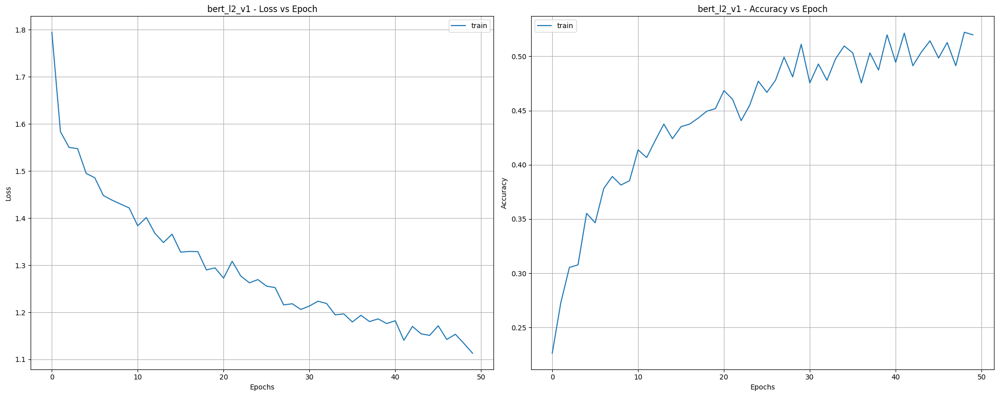

Finished plotting for bert_l2_v1.

Model - bert_l2_v2...


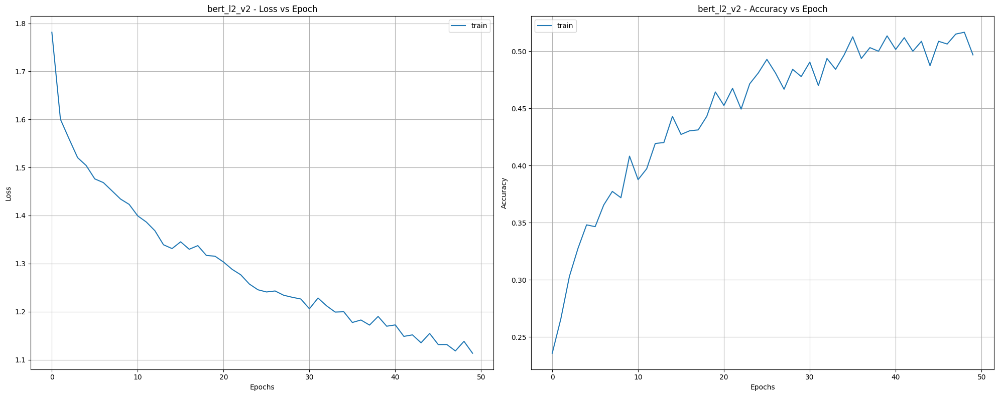

Finished plotting for bert_l2_v2.

Model - bert_l3_v1...


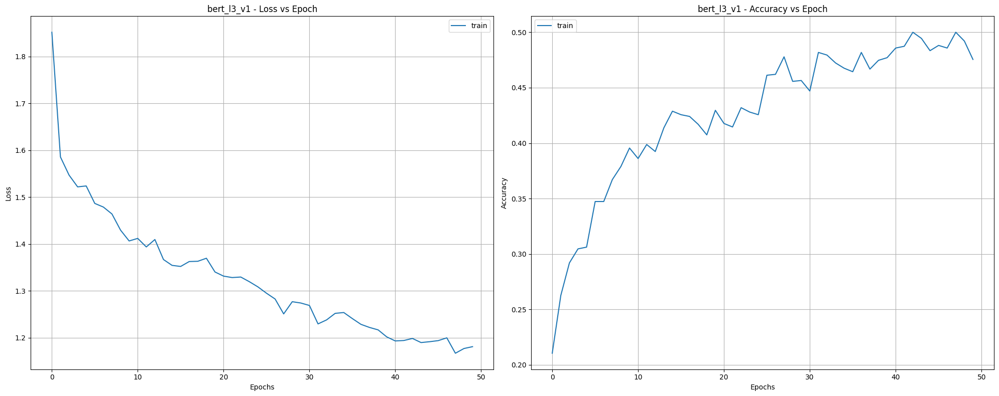

Finished plotting for bert_l3_v1.

Model - bert_l3_v2...


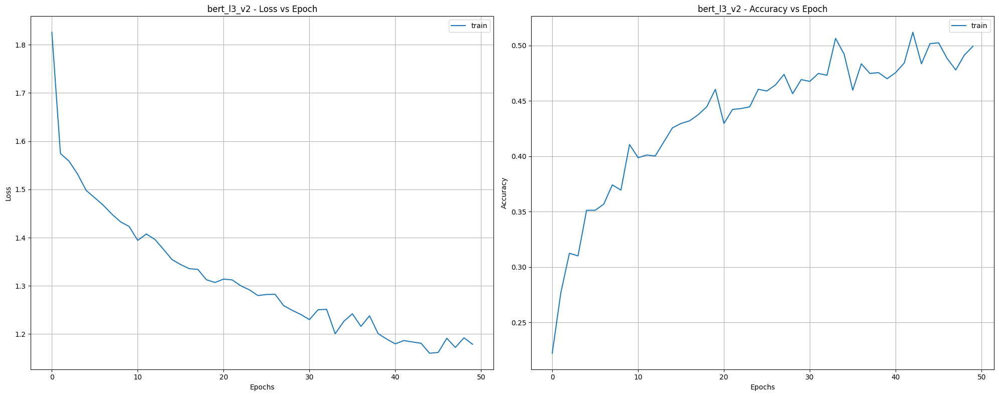

Finished plotting for bert_l3_v2.

Model - bert_l4_v1...


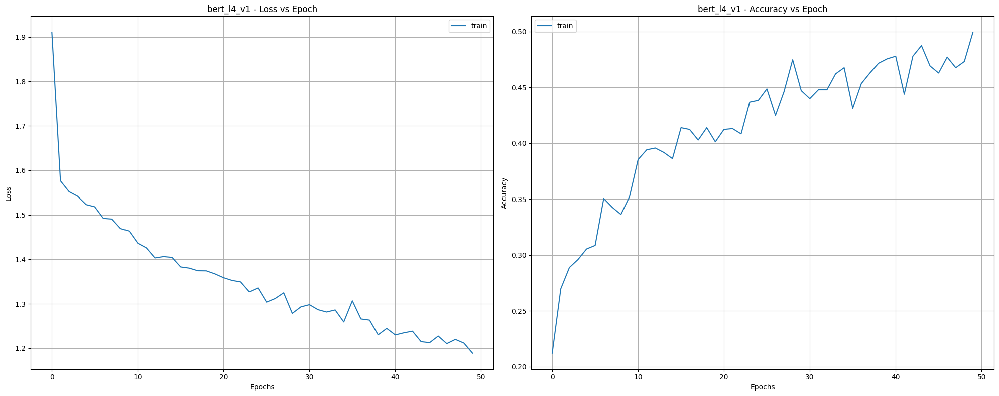

Finished plotting for bert_l4_v1.

Model - bert_l4_v2...


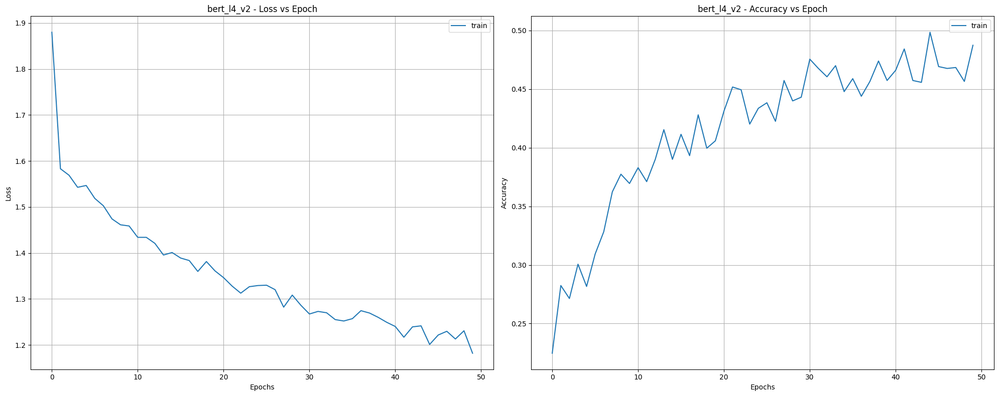

Finished plotting for bert_l4_v2.

All model histories have been plotted.


In [41]:
import matplotlib.pyplot as plt
import sys
import time


# Plotting loss and accuracy curve vs epochs
for name, history in histories.items():
    print(f"\nModel - {name}...")
    sys.stdout.flush() # Ensures this print statement appears immediately

    # Create a new figure for each model
    plt.figure(figsize=(20, 8)) # Your original figure size

    # Changed to 1 row, 2 columns, first plot for Loss
    # This places Loss and Accuracy side-by-side
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss') # Added label
    # Uncomment and use 'val_loss' if it exists in your history object
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend(("train" , "valid") , loc =0) # Your original legend, now with labels for plotting
    plt.title(f"{name} - Loss vs Epoch") # Added model name to title for clarity
    plt.xlabel("Epochs") # Good practice to label axes
    plt.ylabel("Loss")
    plt.grid(True) # Added grid for readability

    # Changed to 1 row, 2 columns, second plot for Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy') # Added label
    # Uncomment and use 'val_accuracy' if it exists in your history object
    if 'val_accuracy' in history.history:
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend(("train" , "valid") , loc =0) # Your original legend
    plt.title(f"{name} - Accuracy vs Epoch") # Added model name to title for clarity
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.grid(True) # Added grid for readability

    plt.tight_layout() # Improves spacing between subplots

    # --- These lines control the display timing ---
    plt.show(block=False) # Display the plot without blocking
    plt.pause(1.5)        # Pause for 1.5 seconds (adjust as needed) to see the plot
    plt.close()           # Close the current figure. Remove this if you want all plots to remain open.
    # --- End display timing control ---

    print(f"Finished plotting for {name}.")
    sys.stdout.flush() # Ensures this print statement appears immediately

print("\nAll model histories have been plotted.")

************************************************************************
************************************************************************


Evaluating Model - bert_l2_v1

40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step
Train Recall: 54.19
Test Recall: 30.06
Train Precision: 54.7
Test Precision: 32.01
Train F1: 54.07
Test F1: 29.93

Confusion matrix for training set:



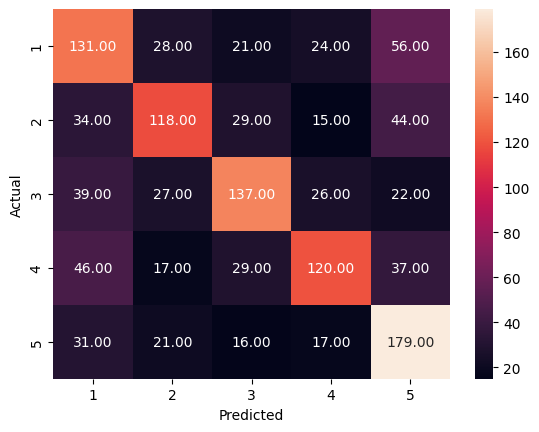


Confusion matrix for testing set:



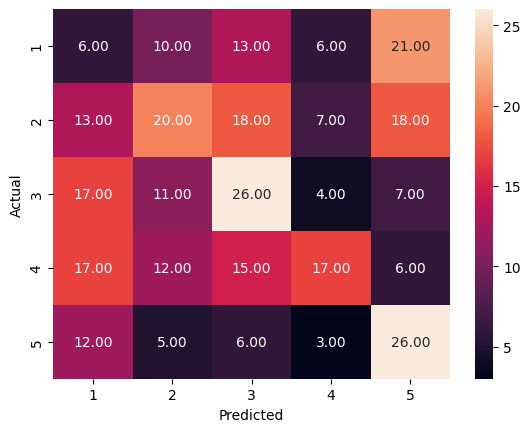

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.47      0.50      0.48       260
           2       0.56      0.49      0.52       240
           3       0.59      0.55      0.57       251
           4       0.59      0.48      0.53       249
           5       0.53      0.68      0.59       264

    accuracy                           0.54      1264
   macro avg       0.55      0.54      0.54      1264
weighted avg       0.55      0.54      0.54      1264


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.09      0.11      0.10        56
           2       0.34      0.26      0.30        76
           3       0.33      0.40      0.36        65
           4       0.46      0.25      0.33        67
           5       0.33      0.50      0.40        52

    accuracy                 

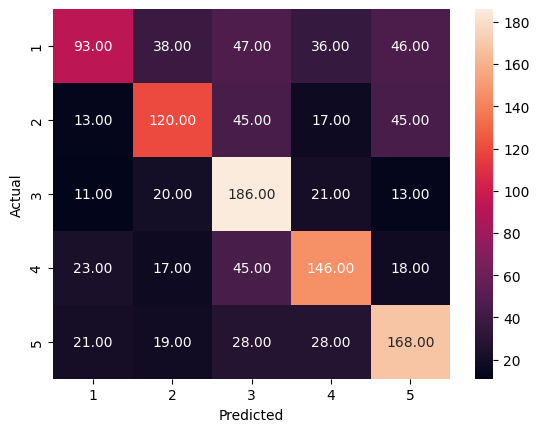


Confusion matrix for testing set:



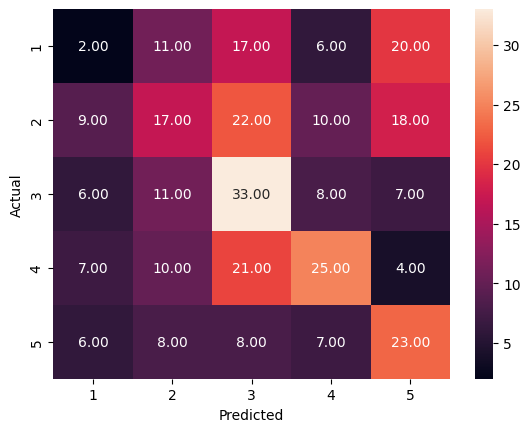

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.58      0.36      0.44       260
           2       0.56      0.50      0.53       240
           3       0.53      0.74      0.62       251
           4       0.59      0.59      0.59       249
           5       0.58      0.64      0.61       264

    accuracy                           0.56      1264
   macro avg       0.57      0.56      0.56      1264
weighted avg       0.57      0.56      0.56      1264


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.07      0.04      0.05        56
           2       0.30      0.22      0.26        76
           3       0.33      0.51      0.40        65
           4       0.45      0.37      0.41        67
           5       0.32      0.44      0.37        52

    accuracy                 

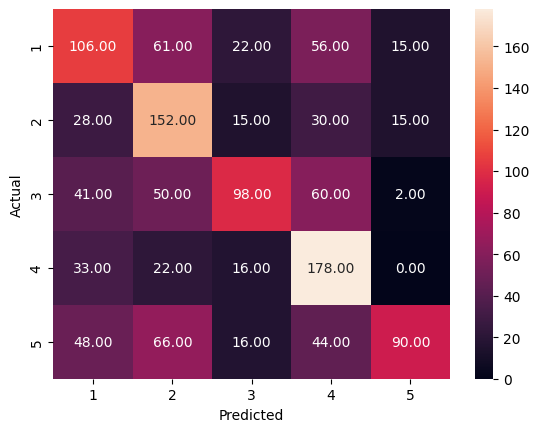


Confusion matrix for testing set:



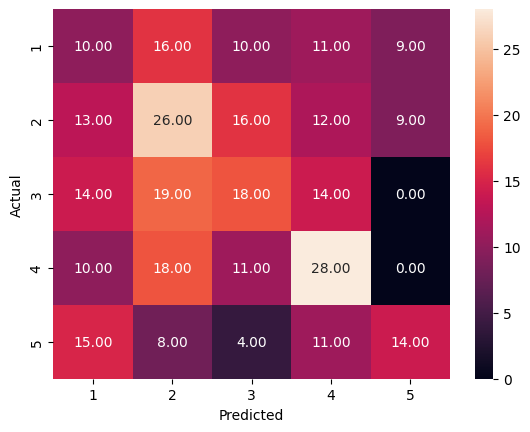

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.41      0.41      0.41       260
           2       0.43      0.63      0.51       240
           3       0.59      0.39      0.47       251
           4       0.48      0.71      0.58       249
           5       0.74      0.34      0.47       264

    accuracy                           0.49      1264
   macro avg       0.53      0.50      0.49      1264
weighted avg       0.53      0.49      0.49      1264


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.16      0.18      0.17        56
           2       0.30      0.34      0.32        76
           3       0.31      0.28      0.29        65
           4       0.37      0.42      0.39        67
           5       0.44      0.27      0.33        52

    accuracy                 

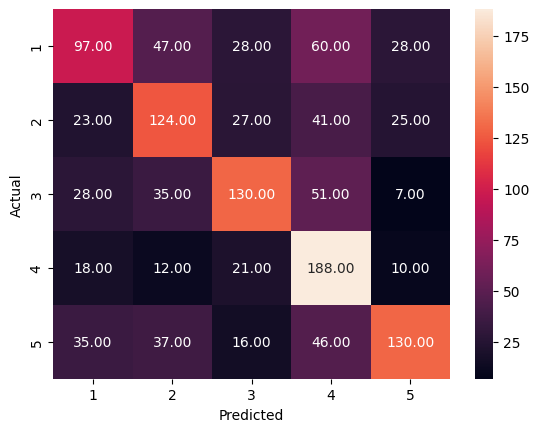


Confusion matrix for testing set:



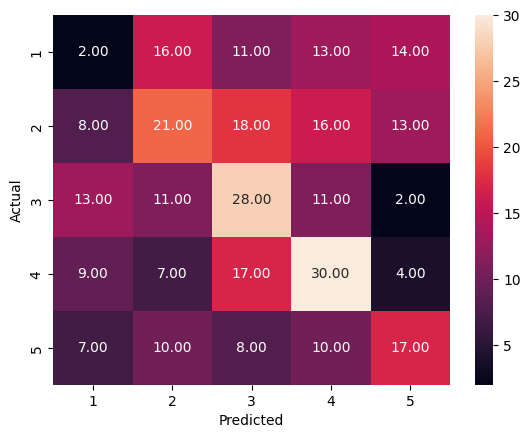

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.48      0.37      0.42       260
           2       0.49      0.52      0.50       240
           3       0.59      0.52      0.55       251
           4       0.49      0.76      0.59       249
           5       0.65      0.49      0.56       264

    accuracy                           0.53      1264
   macro avg       0.54      0.53      0.52      1264
weighted avg       0.54      0.53      0.52      1264


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.05      0.04      0.04        56
           2       0.32      0.28      0.30        76
           3       0.34      0.43      0.38        65
           4       0.38      0.45      0.41        67
           5       0.34      0.33      0.33        52

    accuracy                 

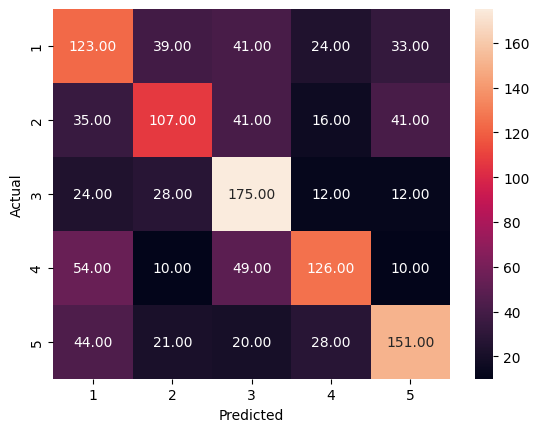


Confusion matrix for testing set:



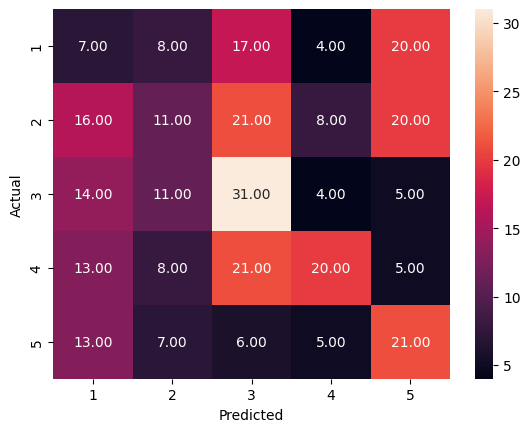

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.44      0.47      0.46       260
           2       0.52      0.45      0.48       240
           3       0.54      0.70      0.61       251
           4       0.61      0.51      0.55       249
           5       0.61      0.57      0.59       264

    accuracy                           0.54      1264
   macro avg       0.54      0.54      0.54      1264
weighted avg       0.54      0.54      0.54      1264


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.11      0.12      0.12        56
           2       0.24      0.14      0.18        76
           3       0.32      0.48      0.39        65
           4       0.49      0.30      0.37        67
           5       0.30      0.40      0.34        52

    accuracy                 

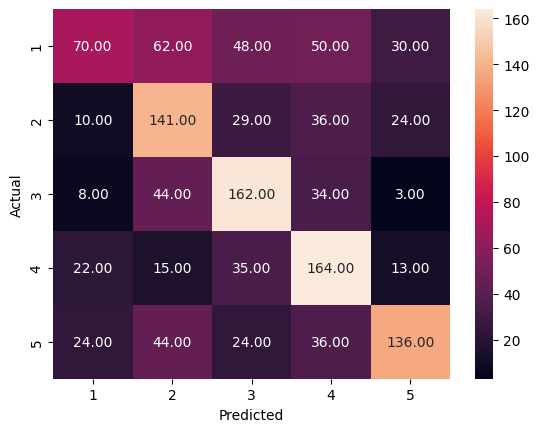


Confusion matrix for testing set:



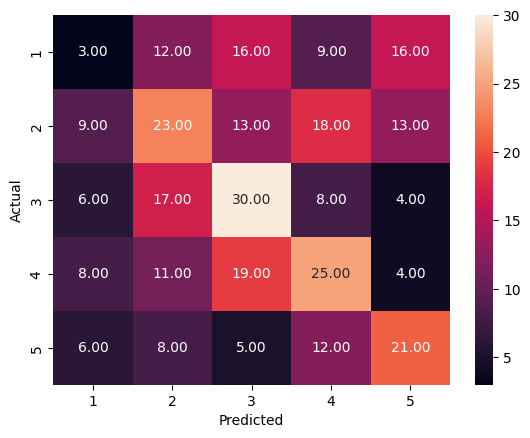

************************************************************************

Classification report for Training set:

              precision    recall  f1-score   support

           1       0.52      0.27      0.36       260
           2       0.46      0.59      0.52       240
           3       0.54      0.65      0.59       251
           4       0.51      0.66      0.58       249
           5       0.66      0.52      0.58       264

    accuracy                           0.53      1264
   macro avg       0.54      0.54      0.52      1264
weighted avg       0.54      0.53      0.52      1264


Classification report for Testing set:

              precision    recall  f1-score   support

           1       0.09      0.05      0.07        56
           2       0.32      0.30      0.31        76
           3       0.36      0.46      0.41        65
           4       0.35      0.37      0.36        67
           5       0.36      0.40      0.38        52

    accuracy                 

In [46]:
for name, model in models_to_train.items():
    print('************************************************************************')
    print('************************************************************************')
    print(f"\n\nEvaluating Model - {name}\n")

    evaluation_matrix(model,[X_train_input_ids,X_train_attention_mask],y_train,[X_test_input_ids,X_test_attention_mask],y_test)

In [49]:
import pickle
for name, model in models_to_train.items():
    model.save(f"/kaggle/working/{name}.h5")
    model_pickle_name = f"/kaggle/working/{name}.pickle"
    pickle.dump(model, open(model_pickle_name, 'wb'))

### BERT Model Performance Comparison (Train vs Test)

| Model       | Train Accuracy | Train F1 (Macro) | Test Accuracy | Test F1 (Macro) |
|-------------|----------------|------------------|----------------|-----------------|
| **bert_l2_v1** | 0.54           | 0.54             | 0.30           | 0.30            |
| **bert_l2_v2** | 0.56           | 0.56             | 0.32           | 0.30            |
| **bert_l3_v1** | 0.49           | 0.49             | 0.30           | 0.30            |
| **bert_l3_v2** | 0.53           | 0.52             | 0.31           | 0.29            |
| **bert_l4_v1** | 0.54           | 0.54             | 0.28           | 0.28            |
| **bert_l4_v2** | 0.53           | 0.52             | 0.32           | 0.31            |


#### Model Performance Insights & Recommendations

#### Summary:
All six BERT models with different layer configurations (2, 3, and 4 layers — each with 2 versions) showed modest classification performance. Here's a quick analysis:

#### Key Observations:

1. **Consistently Low Test Performance**:
   - Test accuracies hover around **28–32%**, with similar macro F1-scores.
   - This indicates poor generalization despite slight variance in training accuracy.

2. **Overfitting Signs**:
   - Some models (e.g., `bert_l2_v2`, `bert_l4_v2`) show **Train Accuracy ~53–56%**, but **Test Accuracy remains ~30–32%**.
   - The gap suggests that models may be **overfitting on training data**.

3. **Layer Depth Impact**:
   - Adding more layers (from 2 to 4) doesn't consistently improve performance.
   - For example:
     - `bert_l3_v2` and `bert_l4_v2` perform similarly on test data.
     - Deeper models do not outperform shallower ones — possibly due to limited data or lack of regularization.

4. **Label Imbalance Sensitivity**:
   - Macro F1-score remains low for all, hinting at **performance drops on minority classes**.

---

#### Recommendations:

1. **📊 Apply Class Weights or Focal Loss**:
   - Use `class_weight` or focal loss to penalize the dominant classes and support minority class learning.

2. **📉 Add Regularization**:
   - Apply **dropout** and **L2 regularization** more aggressively to avoid overfitting.
   - Consider **early stopping** during training.

3. **🧪 Use a Pretrained BERT**:
   - Current model is trained from scratch with initialized layers.
   - Try using pretrained BERT models from HuggingFace (e.g., `bert-base-uncased`) to leverage transfer learning and improve generalization.

4. **🎯 Evaluate Confusion Matrix**:
   - Analyze confusion matrices for each model to understand misclassification patterns.

5. **🧪 Explore Hyperparameter Tuning**:
   - Try changing batch sizes, learning rates, and optimizers (`AdamW`, `SGD`, etc.) for better convergence.

---

#### Next Steps:
- Experiment with other transformer variants (DistilBERT, RoBERTa).



## 🔍 Overall Model Comparison: NN vs LSTM vs BERT

| Model         | Layers | Train Accuracy | Test Accuracy | Train F1 (Macro) | Test F1 (Macro) | Train F1 (Weighted) | Test F1 (Weighted) | Notes |
|---------------|--------|----------------|---------------|------------------|------------------|----------------------|---------------------|-------|
| **NN L2 V1**   | 2      | -              | 0.69          | -                | -                | 0.99                 | 0.65                | Strong train fit, moderate generalization |
| **NN L2 V2**   | 2      | -              | 0.68          | -                | -                | 0.99                 | 0.62                | Signs of overfitting |
| **NN L3 V1**   | 3      | -              | 0.69          | -                | -                | 0.96                 | 0.62                | Balanced, but could improve generalization |
| **NN L3 V2**   | 3      | -              | **0.74**      | -                | -                | 0.99                 | **0.68**            | Best overall generalization |
| **NN L4 V1**   | 4      | -              | 0.72          | -                | -                | 0.79                 | 0.64                | Slight underfit for minority classes |
| **NN L4 V2**   | 4      | -              | 0.66          | -                | -                | 0.99                 | 0.63                | Overfit, lower test performance |
| **NN L4 V3**   | 4      | -              | 0.75          | -                | -                | 0.63                 | 0.65                | Simpler, yet competitive |
| **NN L5 V1**   | 5      | -              | 0.75          | -                | -                | 0.80                 | 0.65                | Best deep model, well regularized |
| **LSTM V1-V4** | RNN    | 0.74           | 0.75          | 0.17             | 0.21             | 0.63                 | 0.65                | Solid test performance, lower macro F1 |
| **BERT L2 V1** | 2      | 0.54           | 0.30          | 0.54             | 0.30             | 0.54                 | 0.30                | Poor generalization |
| **BERT L2 V2** | 2      | 0.56           | 0.32          | 0.56             | 0.30             | 0.56                 | 0.30                | Slight improvement |
| **BERT L3 V1** | 3      | 0.49           | 0.30          | 0.49             | 0.30             | 0.49                 | 0.30                | Underfit overall |
| **BERT L3 V2** | 3      | 0.53           | 0.31          | 0.52             | 0.29             | 0.52                 | 0.30                | Weak generalization |
| **BERT L4 V1** | 4      | 0.54           | 0.28          | 0.54             | 0.28             | 0.54                 | 0.28                | Least effective |
| **BERT L4 V2** | 4      | 0.53           | 0.32          | 0.52             | 0.31             | 0.52                 | 0.31                | Best among BERT, still below others |

---

## Key Insights

- **Best Performer**: `NN_L3_V2` outperformed all models with **74% accuracy and 0.68 weighted F1** on the test set, making it the most generalizable NN configuration.
- **LSTM Models**: Consistent **accuracy (~75%) and weighted F1 (~0.65)**, but **very low macro F1 (~0.21)** suggests **imbalance in class-wise learning**. Suitable if accuracy is prioritized.
- **BERT Models**: Despite being powerful transformers, **all BERT variants performed poorly**, maxing out at ~32% accuracy and 0.31 F1. Likely due to **insufficient training data or sequence length mismatch**.
- **Overfitting Trends**: Some NN models (e.g., `NN L2 V2`, `NN L4 V2`) showed high training F1 but lower test scores, indicating overfitting.

---

## Recommendations

1. **Use NN_L3_V2** as the base production model due to strong balance between train/test and highest F1.
2. **Improve Class Balance**: Low macro F1 across models (especially LSTM, BERT) indicates class imbalance-consider **class weighting or SMOTE**.
3. **Try DistilBERT / RoBERTa**: For BERT models, try **lighter/faster transformers** with **custom tokenizers** and better hyperparameter tuning.
4. **Tune LSTM Further**: If sequential patterns matter, LSTM could be tuned with **attention layers** or **BiLSTMs**.
5. **Use Ensemble**: Combine `NN_L3_V2` and best LSTM in an ensemble or soft-voting classifier to boost stability and performance.
6. **Monitor Minority Performance**: Even with high accuracy, low macro F1 means **critical errors for rare classes**a risk in real applications.